### CITS4404 Practical Project

# Camo Worms!

Australian _velvet worms_ come in many colours, possibly as a camouflage function ([Current Biology](https://www.cell.com/current-biology/comments/S0960-9822(11)00208-9)).

In [1]:
import matplotlib as mpl
import cv2

from src.image_loading import *
from src.image_manipulation import *
from src.plotting import *
from src.algorithms.greedy import *
from src.algorithms.local_search import *

from typing import Callable

# Controls the size of the plots.
mpl.rcParams['figure.dpi']= 140


# 1. Source Image

## 1.1. Load the source image

Loads the grayscale image and crops it into a NumPy array.

Lossy conversion from float32 to uint8. Range [0.0, 210.0]. Convert image to uint8 prior to saving to suppress this warning.


shape (max, min, mean, std. deviation)
(240, 720) (210.0, 0.0, 49.7, 34.4)


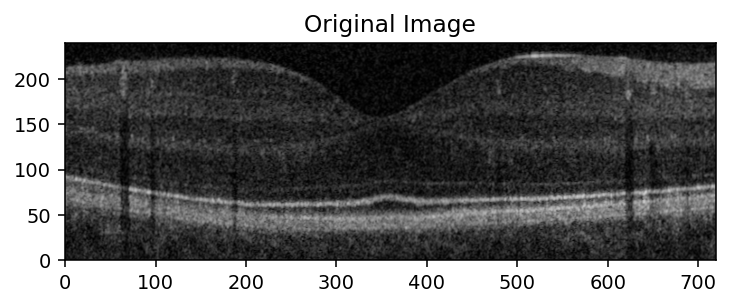

In [3]:
def draw_image(image):
    """ Draws the grayscale image with black as 0 and white as 255. """
    # use vmin and vmax to stop imshow from scaling
    plt.imshow(image, vmin=0, vmax=255, cmap='gray', origin='lower')


image = crop(load_image("images", "original"), (320, 560, 160, 880))

print("shape (max, min, mean, std. deviation)")
print("{} ({}, {}, {}, {})".format(
    np.shape(image), np.max(image), np.min(image),
    round(float(np.mean(image)), 1), round(float(np.std(image)), 1)
))
draw_image(image)
plt.title("Original Image")
plt.show()


## 1.2. Traditional Image Processing

Traditional image processing techniques such as blur, constant convolutions, median windows, and FFT denoising can be used to reduce the noise in an image.

Blurred Image: shape=(240, 720), min=2.16, mean=49.68, max=161.90


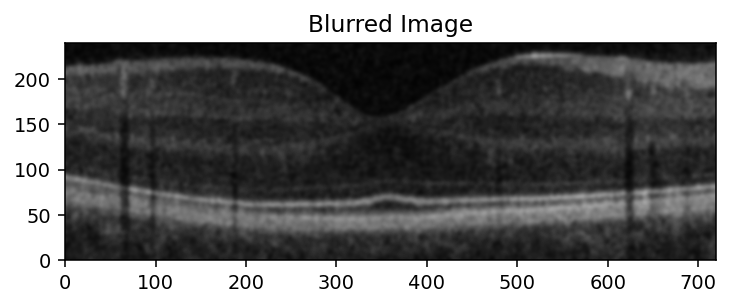

Mean Windowed Image: shape=(240, 720), min=0.00, mean=49.57, max=192.78


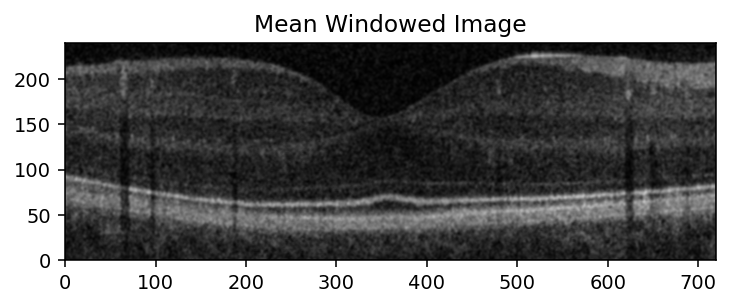

Median Windowed Image: shape=(240, 720), min=0.00, mean=49.66, max=197.00


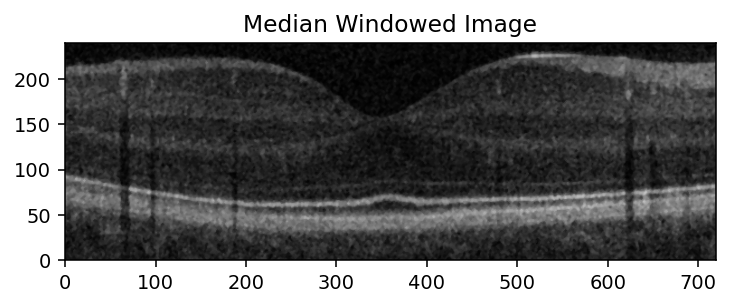

FFT Denoise Image: shape=(240, 720), min=0.00, mean=49.68, max=194.30


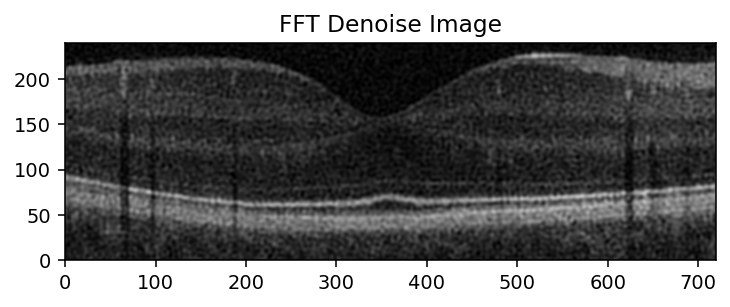

Original Image: shape=(240, 720), min=0.00, mean=49.68, max=210.00


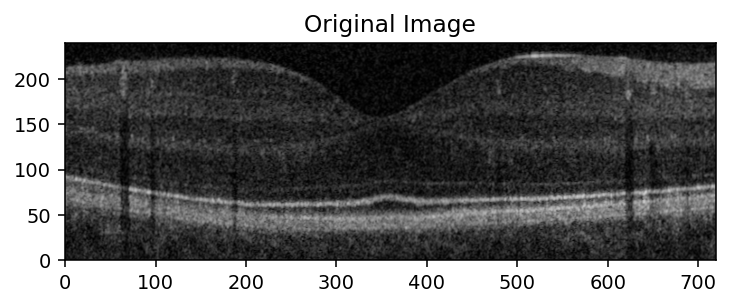

In [3]:
def test_traditional_approach(image, method: Callable, title: str):
    """ Plots the application of a traditional image processing method. """
    processed = method(image)
    print("{}: shape={}, min={:.2f}, mean={:.2f}, max={:.2f}".format(
        title, processed.shape, np.amin(processed), np.mean(processed), np.amax(processed)
    ))
    draw_image(processed)
    plt.title(title)
    plt.show()


test_traditional_approach(image, blur, "Blurred Image")
test_traditional_approach(image, mean_window, "Mean Windowed Image")
test_traditional_approach(image, median_window, "Median Windowed Image")
test_traditional_approach(image, fft_denoise, "FFT Denoise Image")
test_traditional_approach(image, lambda x: x, "Original Image")

## 1.3. Brightening the Image

The above traditional approaches show that there are many ways to reduce noise in an image, but each has their own limitations and benefits. From the above, the median filter looks the best for our purposes of maintaining clear lines in the image for our worms to follow.

However, the image still contains some trends that are very faint compared to others in the image. This can be helped by brightening and darkening the images based upon the brightness if their surroundings.

Scaled Image: shape=(240, 720), min=0.00, mean=60.32, max=255.00


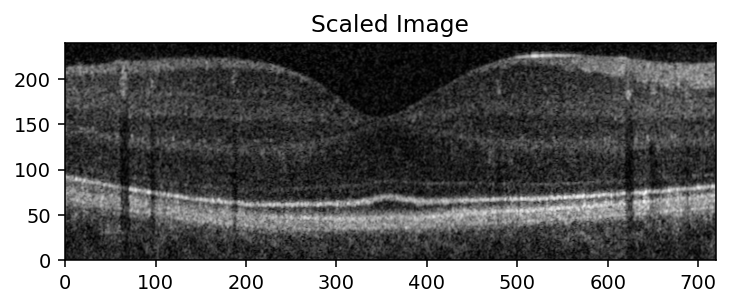

Extremify Image: shape=(240, 720), min=0.00, mean=51.69, max=255.00


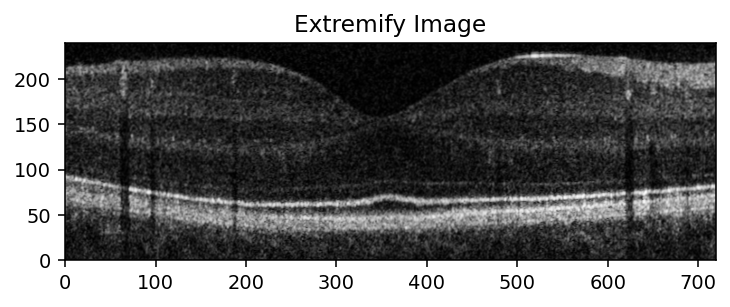

Locally Brightened Image: shape=(240, 720), min=-2.17, mean=53.61, max=252.22


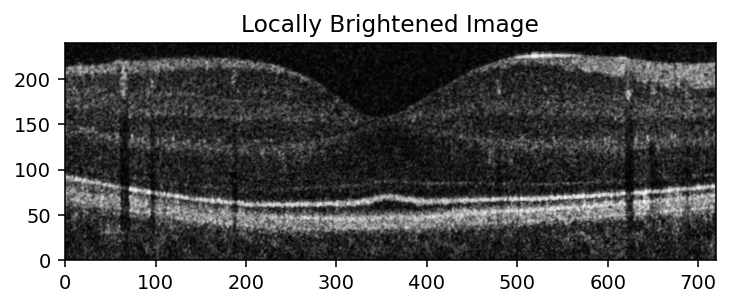

Edge Enhanced Image: shape=(240, 720), min=0.00, mean=52.11, max=249.83


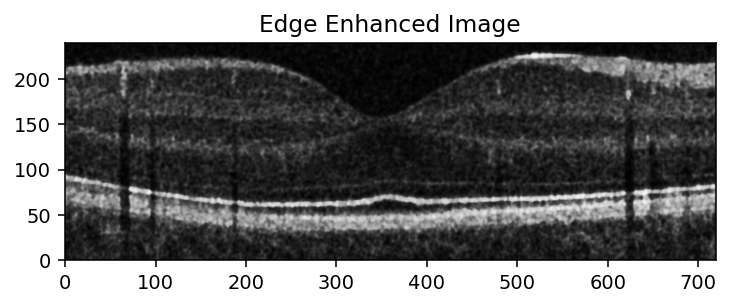

Original Image: shape=(240, 720), min=0.00, mean=49.68, max=210.00


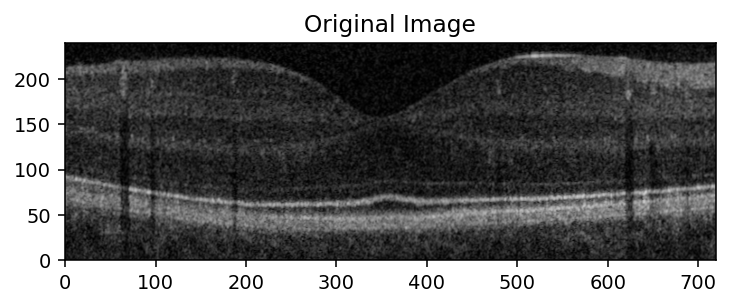

In [4]:
test_traditional_approach(image, scale_brighten, "Scaled Image")
test_traditional_approach(image, extremify, "Extremify Image")
test_traditional_approach(image, local_brighten, "Locally Brightened Image")
test_traditional_approach(image, edge_enhance, "Edge Enhanced Image")
test_traditional_approach(image, lambda x: x, "Original Image")

With these basic image transformation methods, we can enhance the lines in the image, but not very well. Hopefully our worms can do a better job.

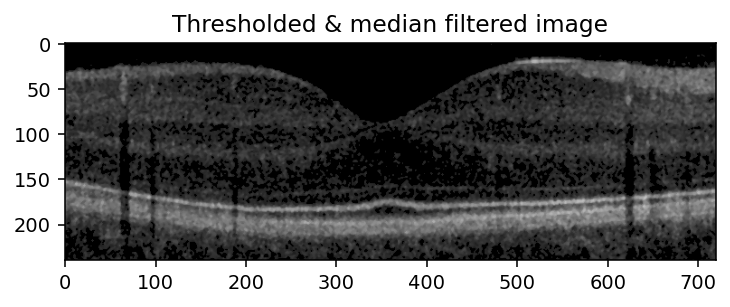

In [35]:
def remove_noise():
    originalImage = cv2.imread("images/original.png")
    grayImage = cv2.cvtColor(originalImage, cv2.COLOR_BGR2GRAY)
    (thresh, blackAndWhiteImage) = cv2.threshold(grayImage, 30, 255, cv2.THRESH_BINARY)

    for j in range(0, originalImage.shape[0]):
        for i in range(0, originalImage.shape[1]):
            if blackAndWhiteImage[j,i] == 0:
                originalImage[j,i] = (0,0,0)
    median_blur= cv2.medianBlur(originalImage, 3)

    plt.imshow(median_blur[320:560, 160: 880], vmin=0, vmax=255, cmap='gray')
    plt.title("Thresholded & median filtered image")
    plt.show()

    cv2.imwrite("images/Thresholed Image.png", originalImage)
    cv2.imwrite("images/Median Blur.png", median_blur)

remove_noise()


# 2. Worm Representation

The camouflage worms are represented by bezier curves, and are specified in src/worm.py.

## 2.1. Generating Random Worms

In [5]:
def generate_random_clew(size: int, imshape: Tuple[int, int]):
    """ Generates a random clew of size worms. """
    clew = []
    for i in range(size):
        clew.append(CamoWorm.random(imshape))
    return clew

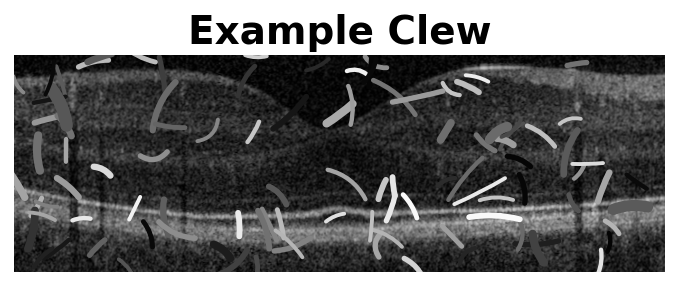

In [6]:
# Initialise clew of 100 and draw

clew = generate_random_clew(100, image.shape)
drawing = Drawing(image)
drawing.add_worms(clew)
drawing.plot(title="Example Clew")

## 2.2. Example Camo Worms

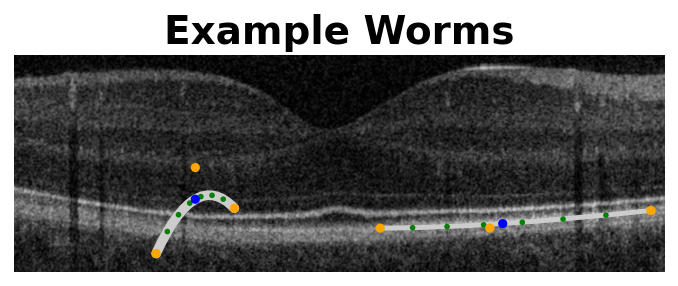

In [7]:
# Draw a single worm along with control points and some sample points

example_worm = CamoWorm(200, 80, 50, np.pi/6, 70, np.pi/3, 10, 0.8)
example_worm_2 = CamoWorm(540, 53, 150, np.pi/50, -30, np.pi/12, 5, 0.8)


def draw_example_bezier_png():
    drawing = Drawing(image)
    for worm in [example_worm, example_worm_2]:
        drawing.add_worms(worm)
        drawing.add_dots(worm.bezier(np.linspace(0, 1, num=8)), radius=2, color='green')
        drawing.add_dots(worm.control_points(), color='orange')
        drawing.add_dots((worm.x, worm.y), color='blue')

    drawing.plot(title="Example Worms")


draw_example_bezier_png()

## 3. Determine what is beneath a worm

Firstly, we will need to determine what pixels are beneath the worm. This is done by creating a mask based on the distance to the worm. To simplify this calculation, we estimate the distance to the worm as the minimum distance to one of N points along the worm. This mask can then be used to filter out only the pixels of the image that fall under the worm.


## 3.1. Reduce the number of points in a curve

The calculation of points on a bezier curve does not give points that are uniformly far apart. Therefore, some sections of the curve would be much more dense than other areas. This wastes computation time. Therefore, the function below filters out the set of points along a curve to only include points that are a certain distance apart.


## 3.2. Generation of circles

We create the mask by drawing a series of circles into a NumPy array. These circle masks can be relatively expensive to compute compared to the generation of the mask. Therefore, we can cache them to save on computation time.

## 3.3. Generate a worm mask from a bezier curve

To save on computation time, the masks that we generate only encompass the bounding box of the worm. Offsets are then used to relate the mask to the subset of the image that they represent.

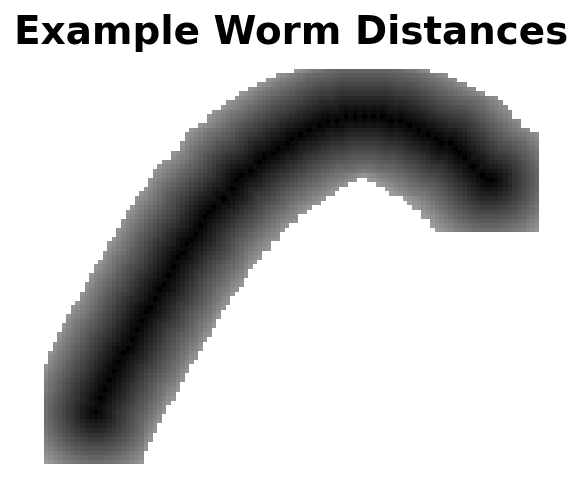

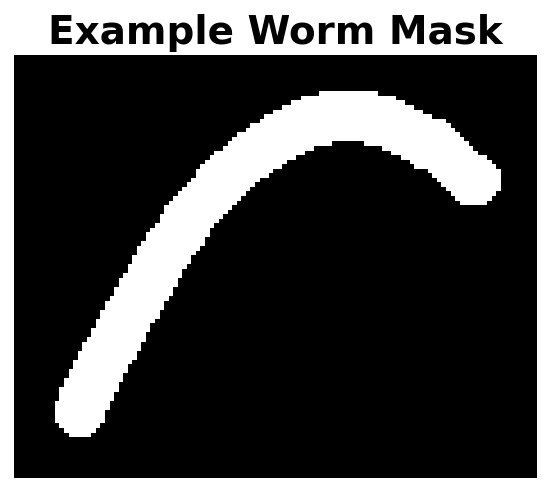

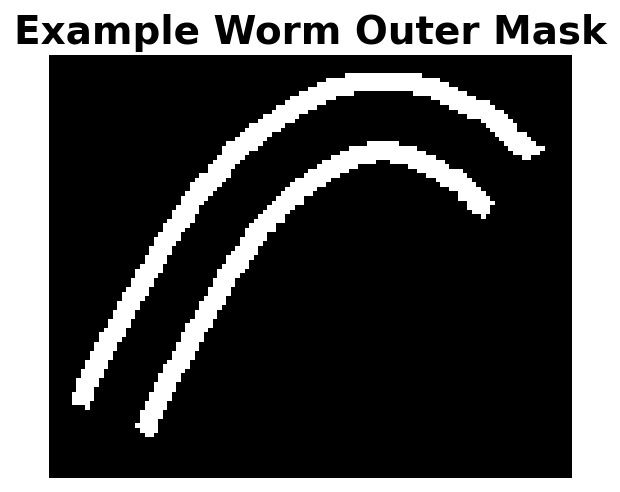

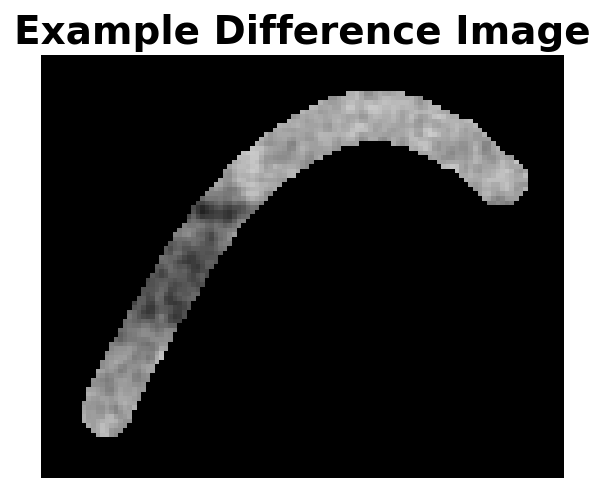

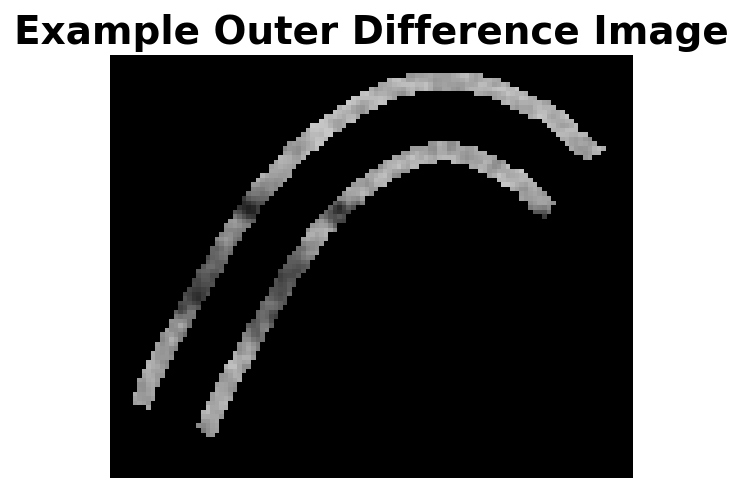

In [8]:
# Compare the generated mask with the worm used in the example above.
worm_mask = WormMask.from_worm(example_worm, image, high_qual_distances=True)
outer_mask = worm_mask.create_outer_mask()
Drawing(10 * np.sqrt(worm_mask.distances)).plot(title="Example Worm Distances")
Drawing(worm_mask.mask * 255).plot(title="Example Worm Mask")
Drawing(outer_mask.mask * 255).plot(title="Example Worm Outer Mask")
Drawing(worm_mask.difference_image(example_worm.colour) * 255).plot(title="Example Difference Image")
Drawing(outer_mask.difference_image(example_worm.colour) * 255).plot(title="Example Outer Difference Image")


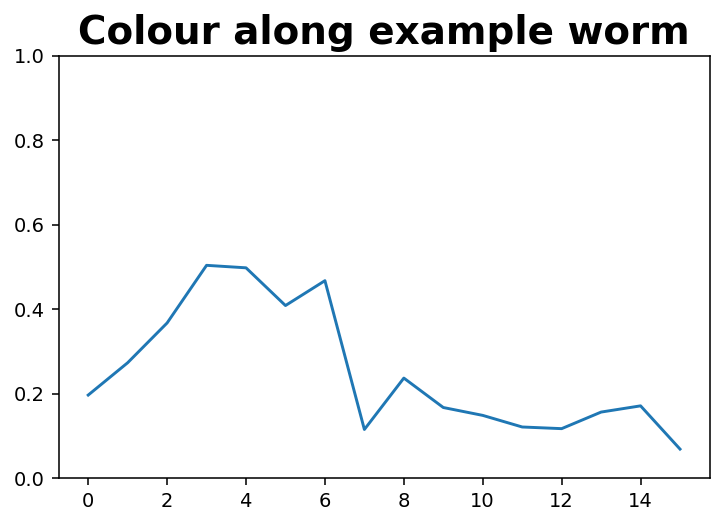

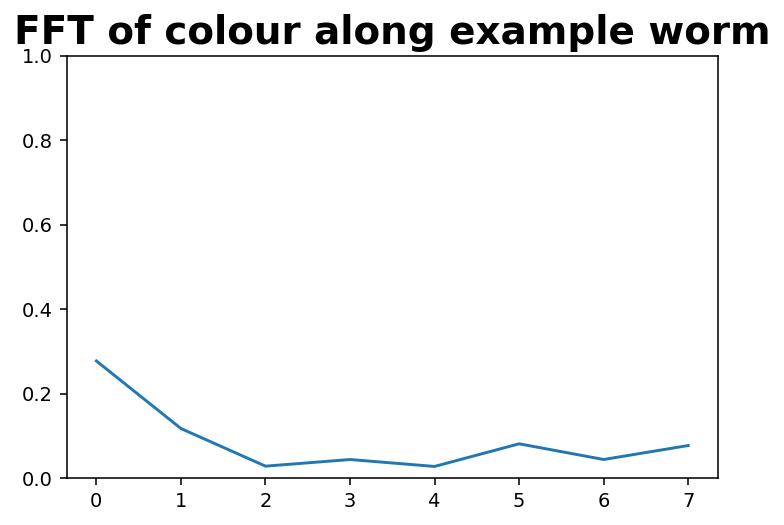

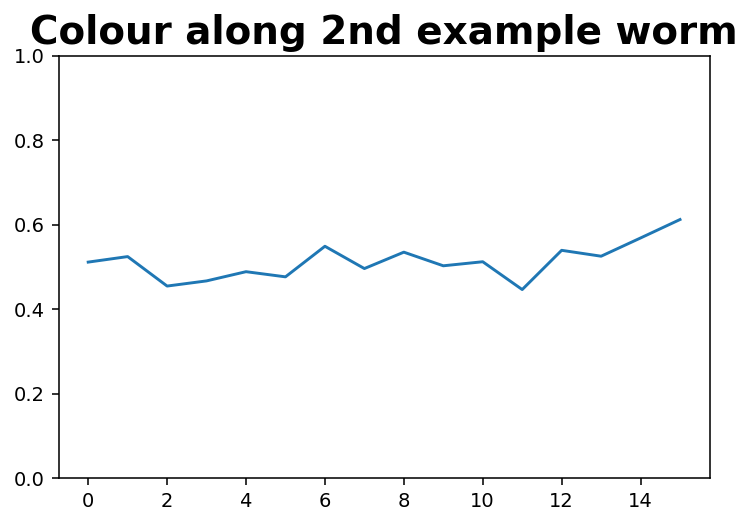

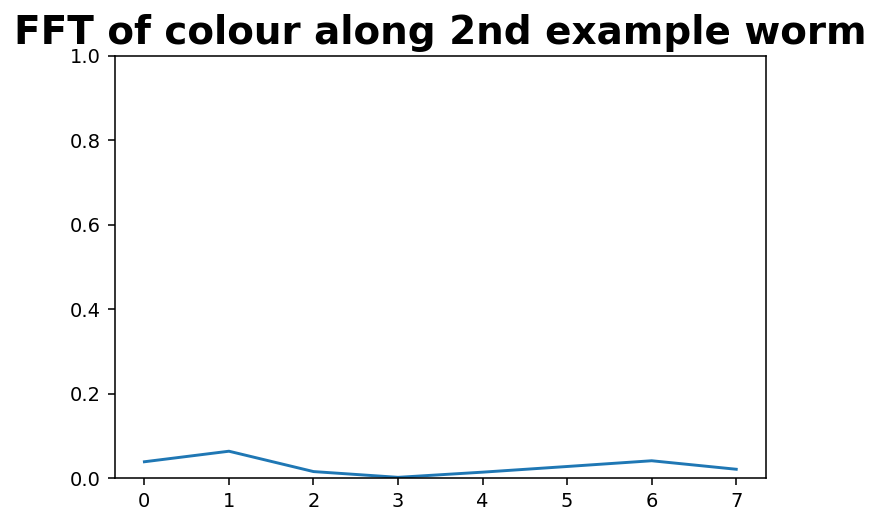

Area = 1477.0, Intersection = 0.681
Intersection of 2 Example Worms = 0.000


In [9]:
colours_under_worm = worm_mask.colour_under_points()
plt.title("Colour along example worm", fontdict={"fontsize": 20, "fontweight": 700})
plt.plot(colours_under_worm)
plt.ylim(0, 1)
plt.show()

plt.title("FFT of colour along example worm", fontdict={"fontsize": 20, "fontweight": 700})
plt.plot(fft_magnitudes(colours_under_worm))
plt.ylim(0, 1)
plt.show()

worm_mask_2 = WormMask.from_worm(example_worm_2, image)
colours_under_worm_2 = worm_mask_2.colour_under_points()
plt.title("Colour along 2nd example worm", fontdict={"fontsize": 20, "fontweight": 700})
plt.plot(colours_under_worm_2)
plt.ylim(0, 1)
plt.show()

plt.title("FFT of colour along 2nd example worm", fontdict={"fontsize": 20, "fontweight": 700})
plt.plot(fft_magnitudes(colours_under_worm_2))
plt.ylim(0, 1)
plt.show()

example_intersecting_worm = example_worm.copy(x=example_worm.x + 5)
intersecting_worm_mask = WormMask.from_worm(example_intersecting_worm, image)
print("Area = {:.1f}, Intersection = {:.3f}".format(
    worm_mask.area, worm_mask.intersection(intersecting_worm_mask))
)

print("Intersection of 2 Example Worms = {:.3f}".format(
    worm_mask.intersection(WormMask.from_worm(example_worm_2, image)))
)


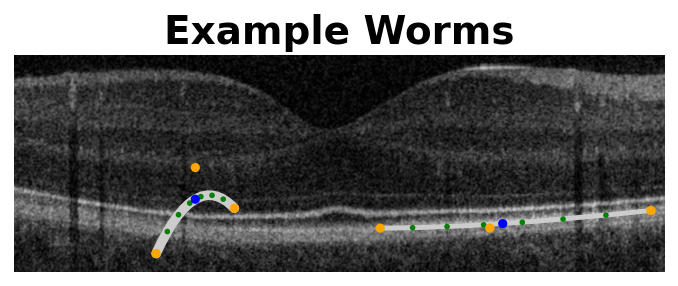

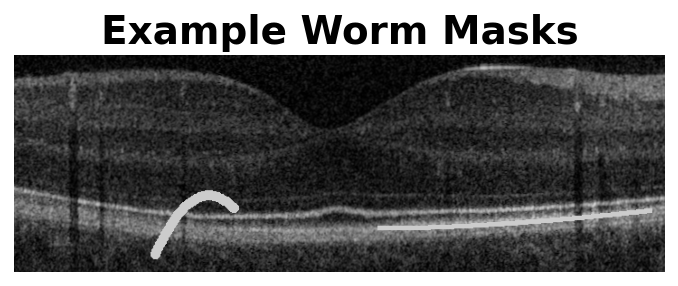

In [10]:
draw_example_bezier_png()

# Draw the masks to visualise their similarities to the real curves.
def draw_example_worm_masks(title="Example Worm Masks"):
    image_with_worm_masks = image.copy()
    for worm in [example_worm, example_worm_2]:
        mask = WormMask.from_worm(worm, image)
        mask.draw_into(image_with_worm_masks, worm.colour * 255.0)
    Drawing(image_with_worm_masks).plot(title=title)


draw_example_worm_masks()


In [ ]:
h, w = image.shape
test_param_worms = []

test_param_worm_dr = CamoWorm(150, h // 2, 100, 0, 0, np.pi/2, 5, 1)
for colour in np.linspace(0, 1, 10):
    test_param_worms.append(test_param_worm_dr.copy(
        colour=colour, dr=2*(colour-0.5)*200
    ))

test_param_worm_dgamma = CamoWorm(300, h // 2, 50, math.pi/2, 150, np.pi/2, 5, 1)
for colour in np.linspace(0, 1, 10):
    test_param_worms.append(test_param_worm_dgamma.copy(
        colour=colour, dgamma=math.pi*(0.2 + 0.6 * colour)
    ))

test_param_worm_r = CamoWorm(500, h // 2, 100, -math.pi/2, 0, np.pi/2, 5, 1)
for colour in np.linspace(0, 1, 10):
    test_param_worms.append(test_param_worm_r.copy(
        colour=colour, r=10 + 100*colour, dr=150*colour
    ))

test_param_worm_width = CamoWorm(620, h // 2, 60, 0, 0, np.pi/2, 5, 1)
width_worm_curr_y = 16
for colour in np.linspace(0, 1, 10):
    width = 4+21*colour
    test_param_worms.append(test_param_worm_width.copy(
        colour=colour, y=width_worm_curr_y, width=width
    ))
    width_worm_curr_y += width + 8

drawing = Drawing(np.zeros(image.shape) + 127)
drawing.add_worms(test_param_worms)
drawing.add_dots((test_param_worm_dr.x, test_param_worm_dr.y), color='orange')
drawing.add_dots((test_param_worm_dgamma.x, test_param_worm_dgamma.y), color='blue')
drawing.add_dots((test_param_worm_r.x, test_param_worm_r.y), color='green')
drawing.plot(title="dr, dgamma, r, width using patches")

param_image = np.zeros(image.shape) + 127
for worm in test_param_worms:
    WormMask.from_worm(worm, param_image).draw_into(param_image, worm.colour * 255)
drawing = Drawing(param_image)
drawing.add_dots((test_param_worm_dr.x, test_param_worm_dr.y), color='orange')
drawing.add_dots((test_param_worm_dgamma.x, test_param_worm_dgamma.y), color='blue')
drawing.add_dots((test_param_worm_r.x, test_param_worm_r.y), color='green')
drawing.plot(title="dr, dgamma, r, width using masks")


# 4. Search Optimisation
Determining the colour and width of the worms by evolution is particularly difficult. However, we can just use the mean colour under the mask for the colour of the worm. Additionally, we can use search over many width values to determine the best width for the worm.

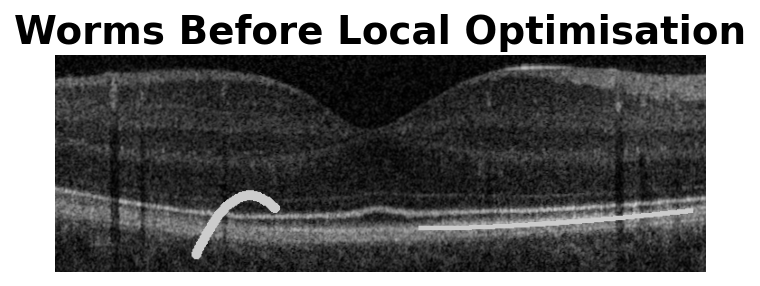

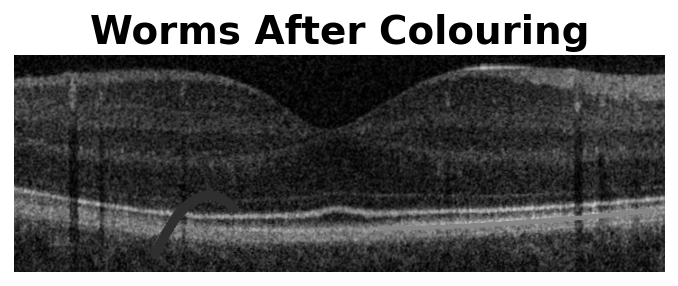

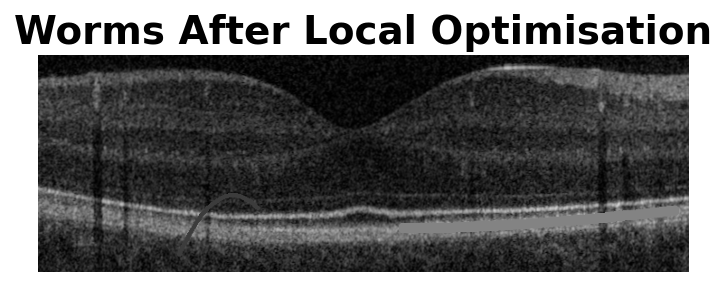

In [12]:
draw_example_worm_masks(title="Worms Before Local Optimisation")

# Set the worms to the most common colour under them.
example_mask = WormMask.from_worm(example_worm, image)
example_mask_2 = WormMask.from_worm(example_worm_2, image)
example_worm.colour = example_mask.median_colour()
example_worm_2.colour = example_mask_2.median_colour()
draw_example_worm_masks(title="Worms After Colouring")

# Search for the best width for the example worms.
locally_optimise_worm(image, example_worm)
locally_optimise_worm(image, example_worm_2)
draw_example_worm_masks(title="Worms After Local Optimisation")


# 5. Optimisation Algorithm

## 5.1 Greedy Search
This algorithm randomly mutates a population of camo worms, and only keeps the mutations that improve the score of the worms.

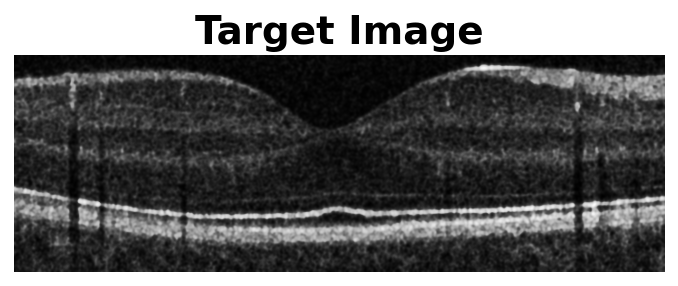

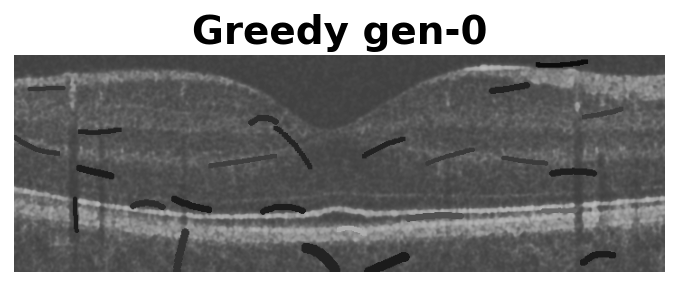

In [13]:
ga = GreedyClewEvolution(image, 25)
ga.plot_clew(show_target_image=True)


## 5.2. Randomly Mutating Worms
The algorithm randomly mutates the worms to find potential improvements to them. These mutations are more drastic the lower the score of the worm, and less drastic the higher the score of the worm.

There is also a small random chance that a good worm will be randomly mutated as though it scored as poorly as possible. This is done as an attempt to allow worms to escape local minima.

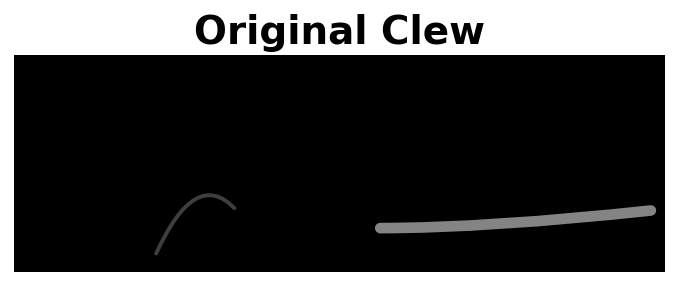

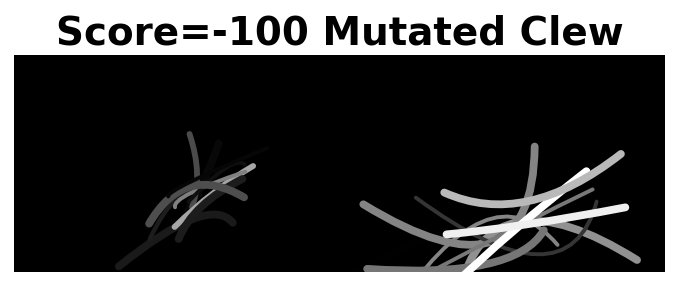

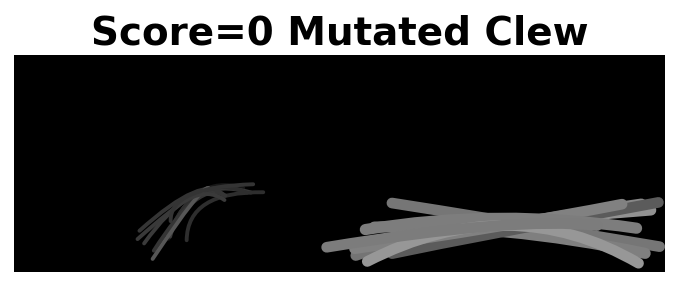

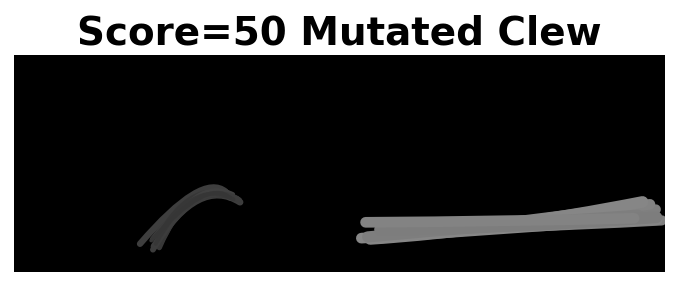

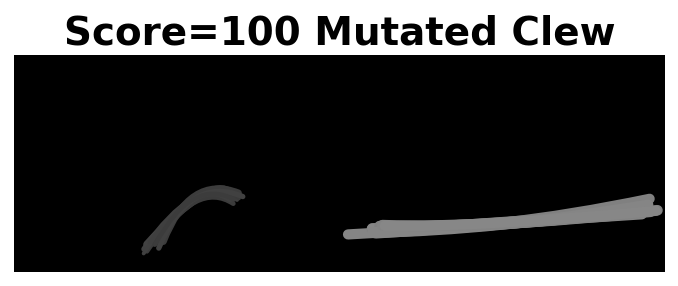

In [14]:
ga_mutate_test = GreedyClewEvolution(image, 0)
ga_mutate_test.add_worm(example_worm)
ga_mutate_test.add_worm(example_worm_2)

drawing = Drawing(np.zeros(image.shape) + 0.5)
drawing.add_worms(ga_mutate_test.clew)
drawing.plot(title="Original Clew")

mutated_worms = [ga_mutate_test.random_mutate(example_worm, -100, drastic_chance=0) for i in range(10)]
mutated_worms += [ga_mutate_test.random_mutate(example_worm_2, -100, drastic_chance=0) for i in range(10)]
drawing = Drawing(np.zeros(image.shape) + 0.5)
drawing.add_worms(mutated_worms)
drawing.plot(title="Score=-100 Mutated Clew")

mutated_worms = [ga_mutate_test.random_mutate(example_worm, 0, drastic_chance=0) for i in range(10)]
mutated_worms += [ga_mutate_test.random_mutate(example_worm_2, 0, drastic_chance=0) for i in range(10)]
drawing = Drawing(np.zeros(image.shape) + 0.5)
drawing.add_worms(mutated_worms)
drawing.plot(title="Score=0 Mutated Clew")

mutated_worms = [ga_mutate_test.random_mutate(example_worm, 50, drastic_chance=0) for i in range(10)]
mutated_worms += [ga_mutate_test.random_mutate(example_worm_2, 50, drastic_chance=0) for i in range(10)]
drawing = Drawing(np.zeros(image.shape) + 0.5)
drawing.add_worms(mutated_worms)
drawing.plot(title="Score=50 Mutated Clew")

mutated_worms = [ga_mutate_test.random_mutate(example_worm, 100, drastic_chance=0) for i in range(10)]
mutated_worms += [ga_mutate_test.random_mutate(example_worm_2, 100, drastic_chance=0) for i in range(10)]
drawing = Drawing(np.zeros(image.shape))
drawing.add_worms(mutated_worms)
drawing.plot(title="Score=100 Mutated Clew")


## 5.3. Running the Greedy Algorithm
Now, we can run the greedy algorithm using our basic functions as a baseline test.

Generation 1: SSIM = 0.293, Scores = 2 ± 30, [-33, 85], Worms = 25  (took 0.77 sec)


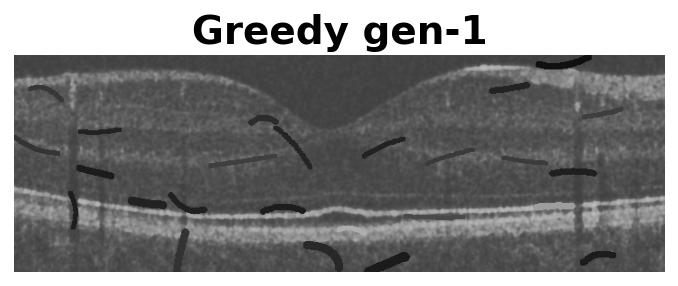

In [15]:
ga.run_generation()
ga.plot_clew()

Generation 2: SSIM = 0.289, Scores = 9 ± 41, [-43, 95], Worms = 25  (took 0.65 sec)
Generation 3: SSIM = 0.287, Scores = 16 ± 55, [-33, 201], Worms = 25  (took 0.63 sec)
Generation 4: SSIM = 0.289, Scores = 24 ± 57, [-33, 201], Worms = 25  (took 0.61 sec)
Generation 5: SSIM = 0.289, Scores = 26 ± 59, [-33, 201], Worms = 25  (took 0.54 sec)
Generation 6: SSIM = 0.293, Scores = 31 ± 62, [-33, 201], Worms = 25  (took 0.54 sec)
Generation 7: SSIM = 0.293, Scores = 34 ± 64, [-33, 201], Worms = 25  (took 0.54 sec)
Generation 8: SSIM = 0.291, Scores = 38 ± 66, [-33, 201], Worms = 25  (took 0.53 sec)
Generation 9: SSIM = 0.291, Scores = 41 ± 69, [-33, 201], Worms = 25  (took 0.51 sec)
Generation 10: SSIM = 0.294, Scores = 44 ± 72, [-33, 201], Worms = 25  (took 0.51 sec)


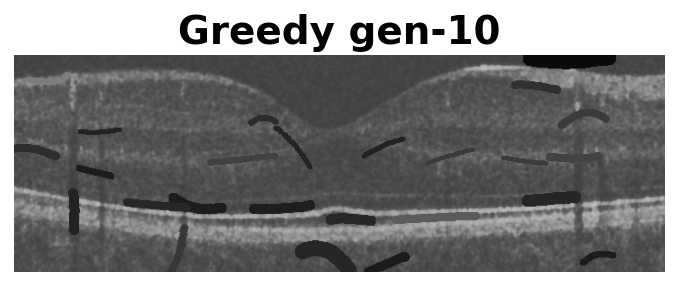

In [16]:
ga.run_generations(9)
ga.plot_clew()

Generation 11: SSIM = 0.293, Scores = 47 ± 75, [-33, 201], Worms = 25  (took 0.50 sec)
Generation 12: SSIM = 0.293, Scores = 51 ± 76, [-33, 201], Worms = 25  (took 0.51 sec)
Generation 13: SSIM = 0.293, Scores = 55 ± 80, [-33, 201], Worms = 25  (took 0.49 sec)
Generation 14: SSIM = 0.292, Scores = 60 ± 85, [-33, 220], Worms = 25  (took 0.48 sec)
len =  0.0 for [  4 652] - [  4 652]
Generation 15: SSIM = 0.293, Scores = 66 ± 90, [-33, 222], Worms = 25  (took 0.48 sec)
Generation 16: SSIM = 0.293, Scores = 68 ± 91, [-33, 222], Worms = 25  (took 0.48 sec)
Generation 17: SSIM = 0.294, Scores = 70 ± 93, [-33, 227], Worms = 25  (took 0.48 sec)
Generation 18: SSIM = 0.295, Scores = 72 ± 94, [-33, 232], Worms = 25  (took 0.48 sec)
Generation 19: SSIM = 0.294, Scores = 73 ± 96, [-33, 232], Worms = 25  (took 0.47 sec)
Generation 20: SSIM = 0.294, Scores = 76 ± 99, [-33, 243], Worms = 25  (took 0.48 sec)


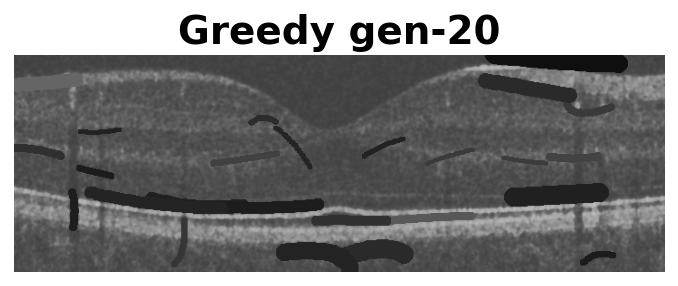

In [17]:
ga.run_generations(10)
ga.plot_clew()

Generation 21: SSIM = 0.295, Scores = 79 ± 100, [-33, 244], Worms = 25  (took 0.47 sec)
Generation 22: SSIM = 0.300, Scores = 80 ± 101, [-33, 244], Worms = 25  (took 0.45 sec)
Generation 23: SSIM = 0.300, Scores = 81 ± 101, [-33, 251], Worms = 25  (took 0.45 sec)
Generation 24: SSIM = 0.300, Scores = 81 ± 101, [-33, 251], Worms = 25  (took 0.45 sec)
Generation 25: SSIM = 0.300, Scores = 83 ± 103, [-33, 251], Worms = 25  (took 0.44 sec)
Generation 26: SSIM = 0.300, Scores = 85 ± 105, [-33, 280], Worms = 25  (took 0.45 sec)
Generation 27: SSIM = 0.301, Scores = 86 ± 106, [-33, 291], Worms = 25  (took 0.44 sec)
Generation 28: SSIM = 0.302, Scores = 90 ± 104, [-33, 291], Worms = 25  (took 0.44 sec)
Generation 29: SSIM = 0.301, Scores = 91 ± 105, [-33, 296], Worms = 25  (took 0.42 sec)
Generation 30: SSIM = 0.302, Scores = 93 ± 106, [-33, 296], Worms = 25  (took 0.42 sec)


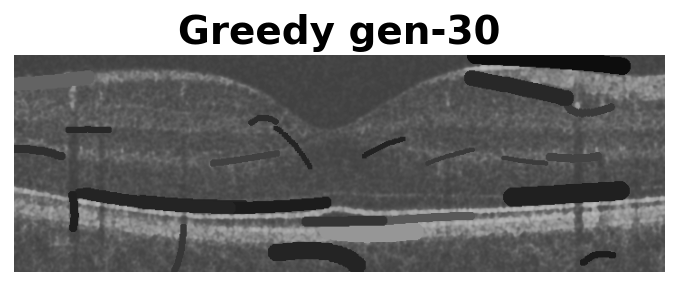

In [18]:
ga.run_generations(10)
ga.plot_clew()

Generation 31: SSIM = 0.302, Scores = 93 ± 106, [-33, 296], Worms = 25  (took 0.41 sec)
Generation 32: SSIM = 0.301, Scores = 89 ± 107, [-33, 296], Worms = 26  (took 0.49 sec)
Generation 33: SSIM = 0.301, Scores = 90 ± 106, [-33, 296], Worms = 26  (took 0.45 sec)
Generation 34: SSIM = 0.302, Scores = 92 ± 107, [-33, 309], Worms = 26  (took 0.42 sec)
Generation 35: SSIM = 0.303, Scores = 93 ± 108, [-33, 309], Worms = 26  (took 0.43 sec)
Generation 36: SSIM = 0.304, Scores = 93 ± 108, [-33, 309], Worms = 26  (took 0.42 sec)
Generation 37: SSIM = 0.304, Scores = 94 ± 109, [-33, 309], Worms = 26  (took 0.42 sec)
Generation 38: SSIM = 0.304, Scores = 95 ± 109, [-33, 309], Worms = 26  (took 0.43 sec)
Generation 39: SSIM = 0.304, Scores = 96 ± 110, [-33, 309], Worms = 25  (took 0.42 sec)
Generation 40: SSIM = 0.305, Scores = 102 ± 108, [-27, 309], Worms = 25  (took 0.38 sec)


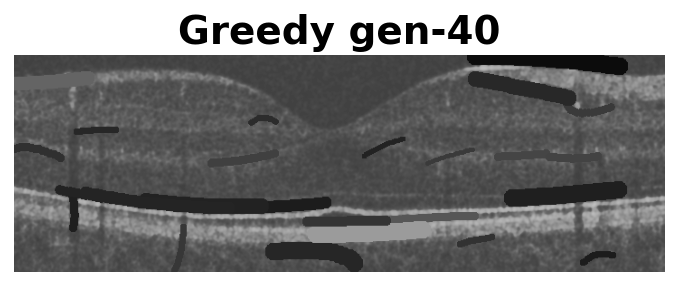

In [19]:
ga.run_generations(10)
ga.plot_clew()

Generation 41: SSIM = 0.305, Scores = 103 ± 108, [-27, 309], Worms = 25  (took 0.37 sec)
Generation 42: SSIM = 0.305, Scores = 103 ± 108, [-27, 309], Worms = 25  (took 0.35 sec)
Generation 43: SSIM = 0.305, Scores = 104 ± 108, [-27, 309], Worms = 25  (took 0.35 sec)
Generation 44: SSIM = 0.306, Scores = 107 ± 107, [-27, 309], Worms = 25  (took 0.35 sec)
Generation 45: SSIM = 0.305, Scores = 107 ± 108, [-27, 309], Worms = 25  (took 0.33 sec)
Generation 46: SSIM = 0.305, Scores = 107 ± 108, [-27, 309], Worms = 25  (took 0.33 sec)
Generation 47: SSIM = 0.303, Scores = 109 ± 108, [-27, 309], Worms = 25  (took 0.33 sec)
Generation 48: SSIM = 0.304, Scores = 106 ± 107, [-27, 309], Worms = 26  (took 0.41 sec)
Generation 49: SSIM = 0.304, Scores = 107 ± 106, [-27, 309], Worms = 26  (took 0.34 sec)
Generation 50: SSIM = 0.304, Scores = 110 ± 105, [-27, 309], Worms = 26  (took 0.33 sec)


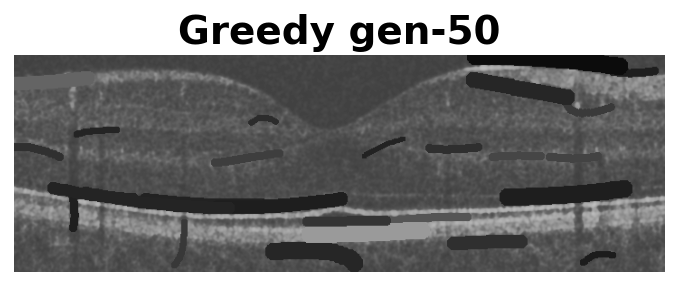

In [20]:
ga.run_generations(10)
ga.plot_clew()

Generation 51: SSIM = 0.304, Scores = 111 ± 106, [-27, 309], Worms = 26  (took 0.35 sec)
Generation 52: SSIM = 0.305, Scores = 112 ± 106, [-27, 309], Worms = 26  (took 0.34 sec)
Generation 53: SSIM = 0.304, Scores = 113 ± 106, [-27, 309], Worms = 26  (took 0.34 sec)
Generation 54: SSIM = 0.305, Scores = 114 ± 106, [-27, 309], Worms = 26  (took 0.34 sec)
Generation 55: SSIM = 0.305, Scores = 114 ± 107, [-27, 309], Worms = 26  (took 0.34 sec)
Generation 56: SSIM = 0.305, Scores = 115 ± 107, [-27, 309], Worms = 26  (took 0.34 sec)
Generation 57: SSIM = 0.305, Scores = 115 ± 107, [-27, 309], Worms = 26  (took 0.34 sec)
Generation 58: SSIM = 0.305, Scores = 116 ± 107, [-27, 309], Worms = 26  (took 0.33 sec)
Generation 59: SSIM = 0.305, Scores = 117 ± 108, [-27, 309], Worms = 26  (took 0.33 sec)
Generation 60: SSIM = 0.305, Scores = 118 ± 109, [-27, 309], Worms = 26  (took 0.33 sec)


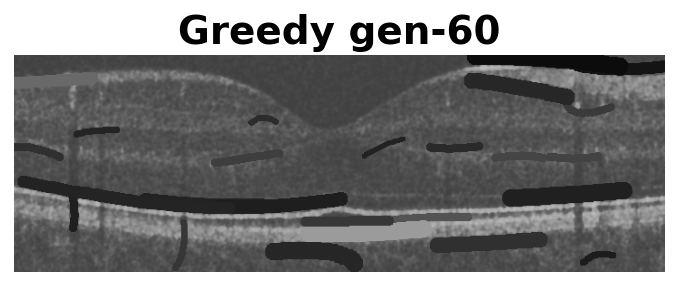

In [21]:
ga.run_generations(10)
ga.plot_clew()

Generation 61: SSIM = 0.305, Scores = 118 ± 109, [-27, 309], Worms = 25  (took 0.34 sec)
Generation 62: SSIM = 0.305, Scores = 125 ± 107, [-24, 309], Worms = 25  (took 0.31 sec)
Generation 63: SSIM = 0.306, Scores = 119 ± 108, [-24, 309], Worms = 26  (took 0.39 sec)
Generation 64: SSIM = 0.305, Scores = 121 ± 107, [-24, 309], Worms = 26  (took 0.35 sec)
Generation 65: SSIM = 0.305, Scores = 123 ± 107, [-24, 309], Worms = 26  (took 0.32 sec)
Generation 66: SSIM = 0.306, Scores = 124 ± 107, [-24, 309], Worms = 26  (took 0.32 sec)
Generation 67: SSIM = 0.306, Scores = 125 ± 107, [-24, 309], Worms = 26  (took 0.32 sec)
Generation 68: SSIM = 0.307, Scores = 125 ± 107, [-24, 309], Worms = 26  (took 0.32 sec)
Generation 69: SSIM = 0.307, Scores = 125 ± 107, [-24, 309], Worms = 26  (took 0.31 sec)
Generation 70: SSIM = 0.307, Scores = 126 ± 106, [-24, 309], Worms = 25  (took 0.31 sec)


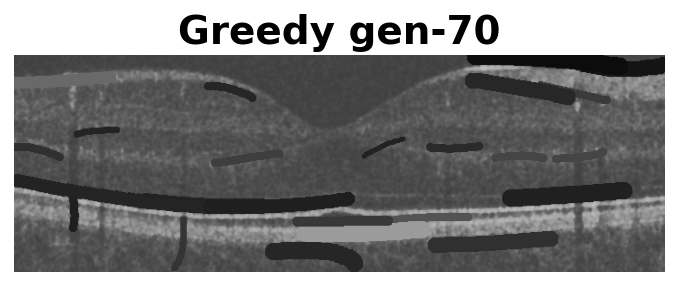

In [22]:
ga.run_generations(10)
ga.plot_clew()

Generation 71: SSIM = 0.308, Scores = 132 ± 104, [-22, 309], Worms = 25  (took 0.32 sec)
Generation 72: SSIM = 0.309, Scores = 133 ± 103, [-22, 309], Worms = 25  (took 0.30 sec)
Generation 73: SSIM = 0.309, Scores = 134 ± 103, [-22, 309], Worms = 25  (took 0.29 sec)
Generation 74: SSIM = 0.309, Scores = 134 ± 103, [-22, 309], Worms = 25  (took 0.29 sec)
Generation 75: SSIM = 0.311, Scores = 134 ± 103, [-22, 309], Worms = 25  (took 0.29 sec)
Generation 76: SSIM = 0.311, Scores = 135 ± 103, [-22, 309], Worms = 25  (took 0.28 sec)
Generation 77: SSIM = 0.311, Scores = 136 ± 104, [-22, 309], Worms = 25  (took 0.28 sec)
Generation 78: SSIM = 0.311, Scores = 136 ± 104, [-22, 309], Worms = 25  (took 0.29 sec)
Generation 79: SSIM = 0.312, Scores = 137 ± 104, [-22, 309], Worms = 25  (took 0.30 sec)
Generation 80: SSIM = 0.312, Scores = 137 ± 104, [-22, 309], Worms = 25  (took 0.29 sec)


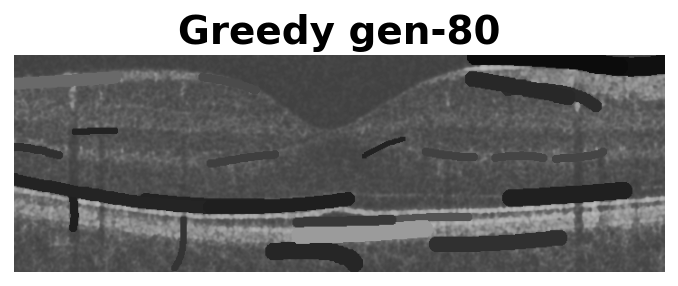

In [23]:
ga.run_generations(10)
ga.plot_clew()

Generation 81: SSIM = 0.312, Scores = 137 ± 104, [-22, 309], Worms = 25  (took 0.29 sec)
Generation 82: SSIM = 0.312, Scores = 138 ± 104, [-22, 309], Worms = 25  (took 0.29 sec)
Generation 83: SSIM = 0.311, Scores = 138 ± 104, [-22, 309], Worms = 25  (took 0.28 sec)
Generation 84: SSIM = 0.311, Scores = 132 ± 106, [-22, 309], Worms = 26  (took 0.36 sec)
Generation 85: SSIM = 0.311, Scores = 132 ± 106, [-22, 309], Worms = 25  (took 0.31 sec)
Generation 86: SSIM = 0.311, Scores = 132 ± 107, [-26, 309], Worms = 26  (took 0.36 sec)
Generation 87: SSIM = 0.311, Scores = 132 ± 107, [-26, 309], Worms = 25  (took 0.31 sec)
Generation 88: SSIM = 0.310, Scores = 139 ± 104, [-22, 309], Worms = 25  (took 0.28 sec)
Generation 89: SSIM = 0.310, Scores = 133 ± 106, [-22, 309], Worms = 25  (took 0.36 sec)
Generation 90: SSIM = 0.313, Scores = 141 ± 103, [5, 309], Worms = 25  (took 0.28 sec)


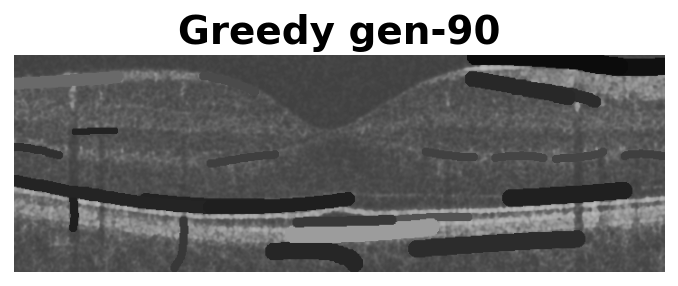

In [24]:
ga.run_generations(10)
ga.plot_clew()

Generation 91: SSIM = 0.313, Scores = 141 ± 103, [5, 309], Worms = 25  (took 0.26 sec)
Generation 92: SSIM = 0.313, Scores = 135 ± 106, [-23, 309], Worms = 25  (took 0.34 sec)
Generation 93: SSIM = 0.314, Scores = 135 ± 105, [-18, 309], Worms = 26  (took 0.34 sec)
Generation 94: SSIM = 0.314, Scores = 136 ± 105, [-18, 309], Worms = 26  (took 0.29 sec)
Generation 95: SSIM = 0.315, Scores = 136 ± 105, [-18, 309], Worms = 25  (took 0.30 sec)
Generation 96: SSIM = 0.313, Scores = 142 ± 102, [5, 309], Worms = 25  (took 0.26 sec)
Generation 97: SSIM = 0.314, Scores = 142 ± 102, [5, 309], Worms = 25  (took 0.26 sec)
Generation 98: SSIM = 0.313, Scores = 137 ± 104, [5, 309], Worms = 26  (took 0.34 sec)
Generation 99: SSIM = 0.315, Scores = 139 ± 102, [5, 309], Worms = 26  (took 0.28 sec)
Generation 100: SSIM = 0.315, Scores = 135 ± 104, [-26, 309], Worms = 27  (took 0.35 sec)


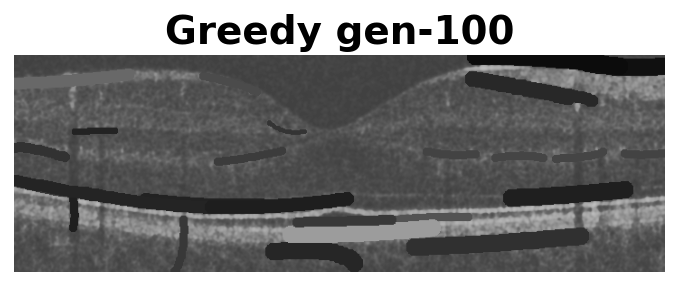

In [25]:
ga.run_generations(10)
ga.plot_clew()

Generation 101: SSIM = 0.315, Scores = 135 ± 104, [-26, 309], Worms = 27  (took 0.31 sec)
Generation 102: SSIM = 0.315, Scores = 135 ± 104, [-26, 309], Worms = 27  (took 0.31 sec)
Generation 103: SSIM = 0.315, Scores = 136 ± 104, [-26, 309], Worms = 27  (took 0.31 sec)
Generation 104: SSIM = 0.315, Scores = 136 ± 104, [-26, 309], Worms = 26  (took 0.30 sec)
Generation 105: SSIM = 0.314, Scores = 142 ± 100, [5, 309], Worms = 26  (took 0.27 sec)
Generation 106: SSIM = 0.314, Scores = 136 ± 103, [-18, 309], Worms = 27  (took 0.35 sec)
Generation 107: SSIM = 0.315, Scores = 137 ± 102, [4, 309], Worms = 27  (took 0.30 sec)
Generation 108: SSIM = 0.315, Scores = 138 ± 101, [5, 309], Worms = 27  (took 0.28 sec)
Generation 109: SSIM = 0.315, Scores = 138 ± 101, [5, 309], Worms = 27  (took 0.28 sec)
Generation 110: SSIM = 0.315, Scores = 139 ± 101, [5, 309], Worms = 27  (took 0.28 sec)
Generation 111: SSIM = 0.315, Scores = 133 ± 104, [-25, 309], Worms = 28  (took 0.37 sec)
Generation 112: SSIM

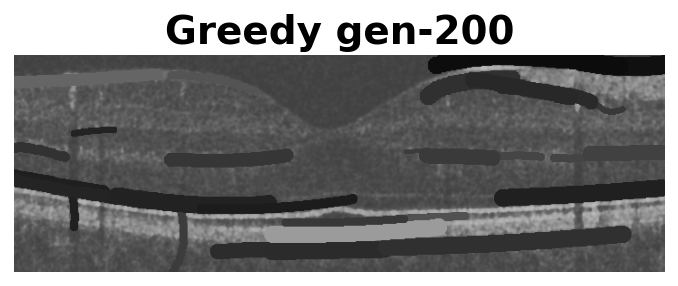

In [26]:
ga.run_generations(100)
ga.plot_clew()

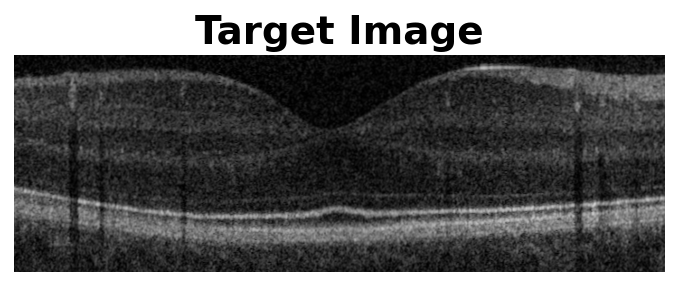

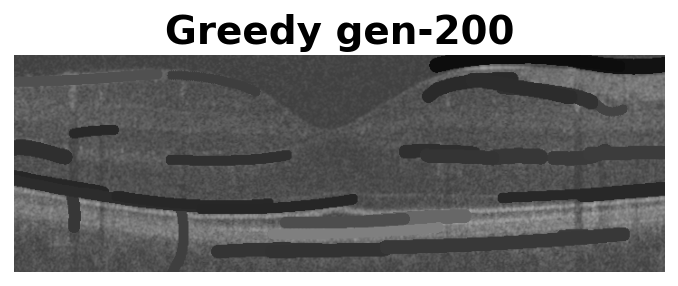

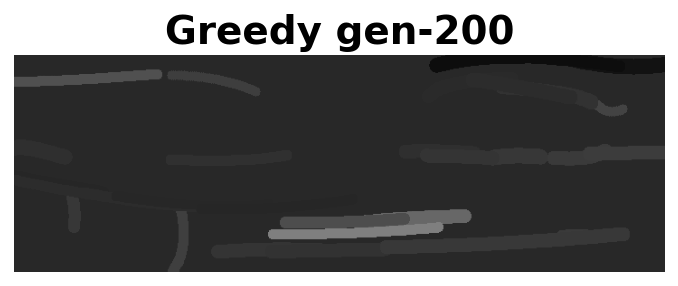

In [27]:
ga_image = ga.image
try:
    ga.image = image
    ga.clew_masks = locally_optimise_clew(ga.image, ga.clew)
    ga.plot_clew(show_target_image=True)
    ga.plot_clew(exclude_background=True)
finally:
    ga.image = ga_image

Generation 201: SSIM = 0.314, Scores = 126 ± 92, [-29, 287], Worms = 34  (took 0.51 sec)
Generation 202: SSIM = 0.318, Scores = 132 ± 93, [-29, 292], Worms = 34  (took 0.44 sec)
Generation 203: SSIM = 0.320, Scores = 138 ± 97, [-29, 309], Worms = 34  (took 0.40 sec)
Generation 204: SSIM = 0.321, Scores = 139 ± 97, [-29, 309], Worms = 34  (took 0.40 sec)
Generation 205: SSIM = 0.321, Scores = 141 ± 96, [3, 309], Worms = 34  (took 0.40 sec)
Generation 206: SSIM = 0.321, Scores = 143 ± 95, [6, 309], Worms = 34  (took 0.39 sec)
Generation 207: SSIM = 0.321, Scores = 146 ± 96, [7, 309], Worms = 34  (took 0.38 sec)
Generation 208: SSIM = 0.321, Scores = 146 ± 95, [7, 309], Worms = 34  (took 0.38 sec)
Generation 209: SSIM = 0.321, Scores = 148 ± 95, [7, 309], Worms = 34  (took 0.38 sec)
Generation 210: SSIM = 0.322, Scores = 149 ± 95, [7, 309], Worms = 34  (took 0.38 sec)
Generation 211: SSIM = 0.322, Scores = 150 ± 95, [7, 309], Worms = 34  (took 0.38 sec)
Generation 212: SSIM = 0.321, Score

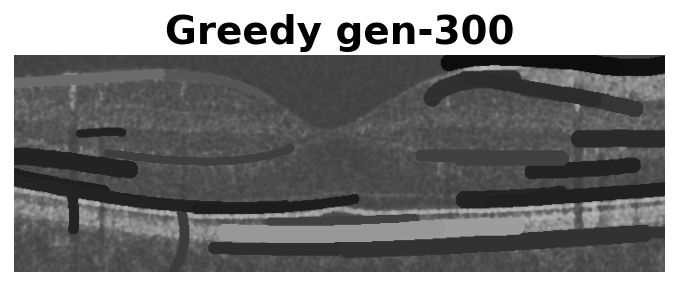

In [28]:
ga.run_generations(100)
ga.plot_clew()

Generation 301: SSIM = 0.325, Scores = 183 ± 88, [10, 310], Worms = 35  (took 0.37 sec)
Generation 302: SSIM = 0.325, Scores = 178 ± 93, [-21, 310], Worms = 36  (took 0.46 sec)
Generation 303: SSIM = 0.325, Scores = 178 ± 93, [-21, 310], Worms = 36  (took 0.40 sec)
Generation 304: SSIM = 0.325, Scores = 178 ± 93, [-21, 310], Worms = 35  (took 0.41 sec)
Generation 305: SSIM = 0.325, Scores = 179 ± 92, [7, 310], Worms = 36  (took 0.46 sec)
Generation 306: SSIM = 0.325, Scores = 173 ± 96, [-21, 310], Worms = 37  (took 0.49 sec)
Generation 307: SSIM = 0.326, Scores = 174 ± 96, [-21, 310], Worms = 37  (took 0.43 sec)
Generation 308: SSIM = 0.325, Scores = 174 ± 96, [-21, 310], Worms = 36  (took 0.44 sec)
Generation 309: SSIM = 0.326, Scores = 174 ± 96, [-18, 310], Worms = 37  (took 0.48 sec)
Generation 310: SSIM = 0.326, Scores = 174 ± 96, [-18, 310], Worms = 37  (took 0.44 sec)
Generation 311: SSIM = 0.326, Scores = 174 ± 96, [-18, 310], Worms = 37  (took 0.43 sec)
Generation 312: SSIM = 0

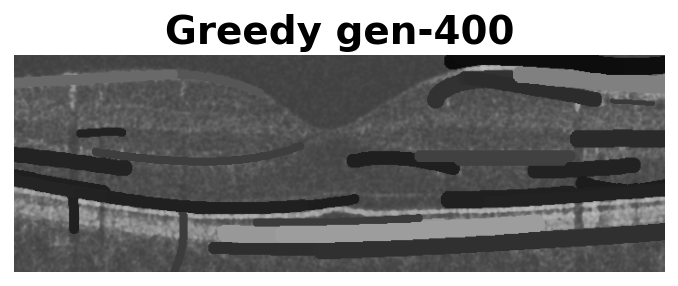

In [29]:
ga.run_generations(100)
ga.plot_clew()

Generation 401: SSIM = 0.333, Scores = 178 ± 99, [-22, 320], Worms = 38  (took 0.50 sec)
Generation 402: SSIM = 0.333, Scores = 178 ± 99, [-17, 320], Worms = 39  (took 0.51 sec)
Generation 403: SSIM = 0.333, Scores = 178 ± 99, [-17, 320], Worms = 38  (took 0.45 sec)
Generation 404: SSIM = 0.333, Scores = 184 ± 95, [4, 320], Worms = 38  (took 0.42 sec)
Generation 405: SSIM = 0.332, Scores = 184 ± 95, [4, 320], Worms = 38  (took 0.41 sec)
Generation 406: SSIM = 0.332, Scores = 179 ± 99, [-26, 320], Worms = 38  (took 0.51 sec)
Generation 407: SSIM = 0.332, Scores = 179 ± 99, [-20, 320], Worms = 39  (took 0.50 sec)
Generation 408: SSIM = 0.332, Scores = 179 ± 99, [-20, 320], Worms = 38  (took 0.45 sec)
Generation 409: SSIM = 0.332, Scores = 179 ± 99, [-24, 320], Worms = 38  (took 0.51 sec)
Generation 410: SSIM = 0.332, Scores = 185 ± 96, [9, 344], Worms = 38  (took 0.42 sec)
Generation 411: SSIM = 0.333, Scores = 186 ± 96, [9, 344], Worms = 38  (took 0.41 sec)
Generation 412: SSIM = 0.333,

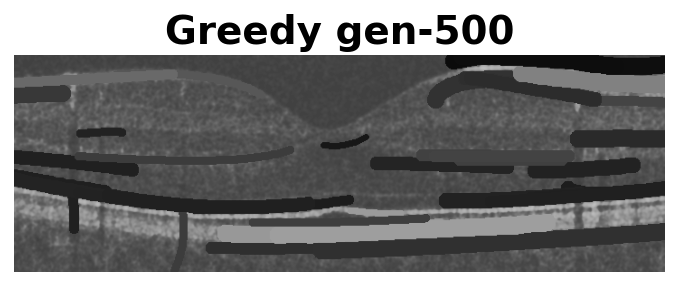

In [30]:
ga.run_generations(100)
ga.plot_clew()

Generation 501: SSIM = 0.336, Scores = 182 ± 99, [-26, 354], Worms = 41  (took 0.48 sec)
Generation 502: SSIM = 0.336, Scores = 183 ± 99, [-26, 354], Worms = 41  (took 0.48 sec)
Generation 503: SSIM = 0.336, Scores = 183 ± 99, [-26, 354], Worms = 40  (took 0.48 sec)
Generation 504: SSIM = 0.336, Scores = 182 ± 99, [-32, 354], Worms = 41  (took 0.53 sec)
Generation 505: SSIM = 0.337, Scores = 183 ± 99, [-32, 354], Worms = 40  (took 0.48 sec)
Generation 506: SSIM = 0.337, Scores = 188 ± 94, [10, 354], Worms = 40  (took 0.44 sec)
Generation 507: SSIM = 0.337, Scores = 183 ± 98, [-12, 354], Worms = 40  (took 0.53 sec)
Generation 508: SSIM = 0.337, Scores = 183 ± 99, [-21, 354], Worms = 41  (took 0.57 sec)
Generation 509: SSIM = 0.337, Scores = 183 ± 99, [-21, 354], Worms = 40  (took 0.52 sec)
Generation 510: SSIM = 0.337, Scores = 183 ± 99, [-21, 354], Worms = 41  (took 0.55 sec)
Generation 511: SSIM = 0.337, Scores = 183 ± 99, [-21, 354], Worms = 41  (took 0.52 sec)
Generation 512: SSIM =

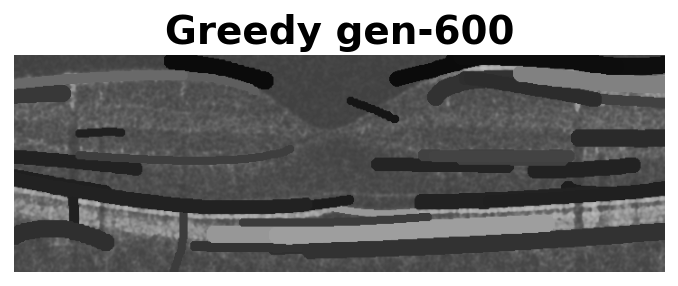

Generation 601: SSIM = 0.343, Scores = 183 ± 98, [-13, 371], Worms = 45  (took 0.51 sec)
Generation 602: SSIM = 0.343, Scores = 183 ± 98, [-13, 371], Worms = 44  (took 0.51 sec)
Generation 603: SSIM = 0.343, Scores = 183 ± 98, [-17, 376], Worms = 45  (took 0.57 sec)
Generation 604: SSIM = 0.343, Scores = 185 ± 98, [-17, 376], Worms = 45  (took 0.52 sec)
Generation 605: SSIM = 0.343, Scores = 185 ± 98, [-17, 376], Worms = 44  (took 0.50 sec)
Generation 606: SSIM = 0.343, Scores = 184 ± 98, [-22, 376], Worms = 45  (took 0.57 sec)
Generation 607: SSIM = 0.343, Scores = 184 ± 98, [-22, 376], Worms = 44  (took 0.50 sec)
Generation 608: SSIM = 0.343, Scores = 185 ± 99, [-26, 376], Worms = 45  (took 0.55 sec)
Generation 609: SSIM = 0.343, Scores = 185 ± 99, [-26, 376], Worms = 45  (took 0.49 sec)
Generation 610: SSIM = 0.343, Scores = 185 ± 99, [-26, 376], Worms = 44  (took 0.50 sec)
Generation 611: SSIM = 0.343, Scores = 186 ± 98, [-11, 376], Worms = 44  (took 0.55 sec)
Generation 612: SSIM 

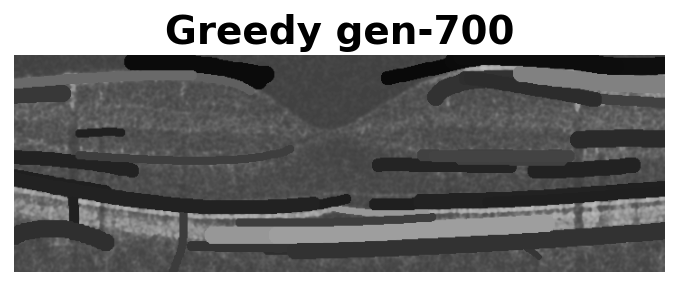

Generation 701: SSIM = 0.345, Scores = 185 ± 103, [-24, 383], Worms = 47  (took 0.58 sec)
Generation 702: SSIM = 0.346, Scores = 185 ± 103, [-24, 383], Worms = 47  (took 0.54 sec)
Generation 703: SSIM = 0.346, Scores = 185 ± 103, [-24, 383], Worms = 46  (took 0.54 sec)
Generation 704: SSIM = 0.346, Scores = 185 ± 103, [-24, 383], Worms = 47  (took 0.61 sec)
Generation 705: SSIM = 0.346, Scores = 185 ± 103, [-24, 383], Worms = 47  (took 0.54 sec)
Generation 706: SSIM = 0.346, Scores = 185 ± 103, [-24, 383], Worms = 46  (took 0.55 sec)
Generation 707: SSIM = 0.346, Scores = 185 ± 103, [-23, 383], Worms = 46  (took 0.61 sec)
Generation 708: SSIM = 0.346, Scores = 185 ± 103, [-22, 383], Worms = 47  (took 0.61 sec)
Generation 709: SSIM = 0.346, Scores = 185 ± 103, [-22, 383], Worms = 46  (took 0.54 sec)
Generation 710: SSIM = 0.347, Scores = 185 ± 103, [-23, 383], Worms = 46  (took 0.60 sec)
Generation 711: SSIM = 0.346, Scores = 185 ± 103, [-22, 383], Worms = 46  (took 0.59 sec)
Generation

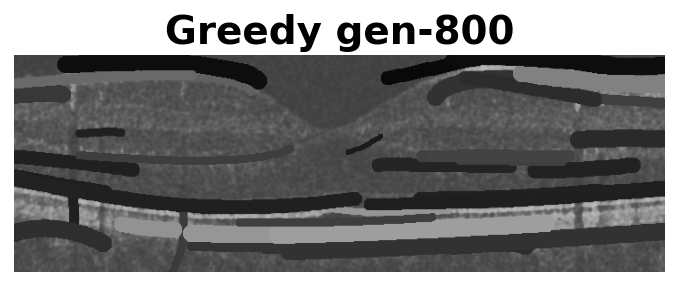

Generation 801: SSIM = 0.352, Scores = 189 ± 101, [-27, 383], Worms = 48  (took 0.59 sec)
Generation 802: SSIM = 0.352, Scores = 189 ± 101, [-27, 383], Worms = 47  (took 0.53 sec)
Generation 803: SSIM = 0.352, Scores = 189 ± 101, [-27, 383], Worms = 47  (took 0.61 sec)
Generation 804: SSIM = 0.352, Scores = 189 ± 101, [-23, 383], Worms = 48  (took 0.60 sec)
Generation 805: SSIM = 0.352, Scores = 189 ± 101, [-23, 383], Worms = 47  (took 0.53 sec)
Generation 806: SSIM = 0.352, Scores = 194 ± 97, [10, 383], Worms = 47  (took 0.49 sec)
Generation 807: SSIM = 0.352, Scores = 194 ± 97, [10, 383], Worms = 47  (took 0.51 sec)
Generation 808: SSIM = 0.352, Scores = 194 ± 97, [10, 386], Worms = 47  (took 0.51 sec)
Generation 809: SSIM = 0.351, Scores = 190 ± 101, [-26, 386], Worms = 48  (took 0.60 sec)
Generation 810: SSIM = 0.351, Scores = 190 ± 101, [-26, 386], Worms = 47  (took 0.55 sec)
Generation 811: SSIM = 0.352, Scores = 195 ± 97, [10, 386], Worms = 47  (took 0.51 sec)
Generation 812: SS

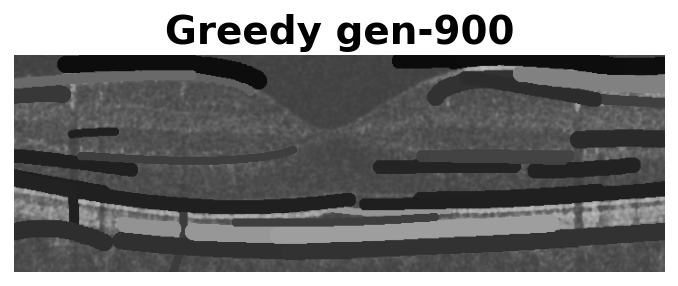

Generation 901: SSIM = 0.351, Scores = 198 ± 96, [13, 392], Worms = 48  (took 0.51 sec)
Generation 902: SSIM = 0.351, Scores = 194 ± 100, [-21, 392], Worms = 49  (took 0.61 sec)
Generation 903: SSIM = 0.351, Scores = 194 ± 100, [-21, 392], Worms = 49  (took 0.54 sec)
Generation 904: SSIM = 0.351, Scores = 194 ± 100, [-21, 392], Worms = 48  (took 0.55 sec)
Generation 905: SSIM = 0.351, Scores = 199 ± 97, [13, 392], Worms = 48  (took 0.51 sec)
Generation 906: SSIM = 0.351, Scores = 194 ± 101, [-22, 392], Worms = 49  (took 0.63 sec)
Generation 907: SSIM = 0.351, Scores = 194 ± 101, [-22, 392], Worms = 48  (took 0.57 sec)
Generation 908: SSIM = 0.351, Scores = 194 ± 101, [-25, 392], Worms = 49  (took 0.62 sec)
Generation 909: SSIM = 0.351, Scores = 194 ± 101, [-25, 392], Worms = 48  (took 0.57 sec)
Generation 910: SSIM = 0.351, Scores = 199 ± 97, [13, 392], Worms = 48  (took 0.53 sec)
Generation 911: SSIM = 0.351, Scores = 194 ± 101, [-29, 392], Worms = 48  (took 0.62 sec)
Generation 912: 

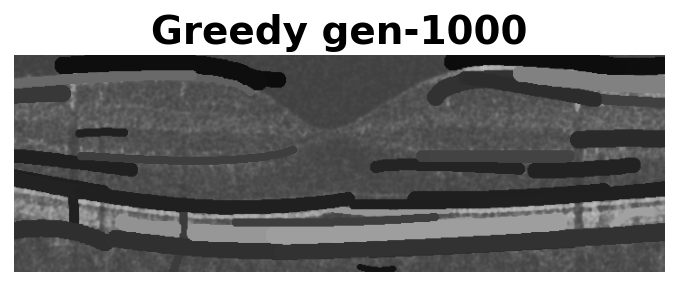

Generation 1001: SSIM = 0.352, Scores = 192 ± 103, [-25, 392], Worms = 50  (took 0.61 sec)
Generation 1002: SSIM = 0.352, Scores = 192 ± 103, [-30, 392], Worms = 51  (took 0.63 sec)
Generation 1003: SSIM = 0.352, Scores = 192 ± 104, [-30, 392], Worms = 51  (took 0.56 sec)
Generation 1004: SSIM = 0.352, Scores = 192 ± 103, [-30, 392], Worms = 51  (took 0.57 sec)
Generation 1005: SSIM = 0.352, Scores = 192 ± 103, [-30, 392], Worms = 50  (took 0.57 sec)
Generation 1006: SSIM = 0.352, Scores = 192 ± 103, [-22, 392], Worms = 51  (took 0.63 sec)
Generation 1007: SSIM = 0.352, Scores = 192 ± 103, [-22, 392], Worms = 50  (took 0.58 sec)
Generation 1008: SSIM = 0.352, Scores = 192 ± 103, [-25, 392], Worms = 50  (took 0.63 sec)
Generation 1009: SSIM = 0.351, Scores = 192 ± 103, [-25, 392], Worms = 50  (took 0.63 sec)
Generation 1010: SSIM = 0.351, Scores = 192 ± 103, [-25, 392], Worms = 51  (took 0.63 sec)
Generation 1011: SSIM = 0.351, Scores = 193 ± 103, [-25, 392], Worms = 51  (took 0.57 sec)

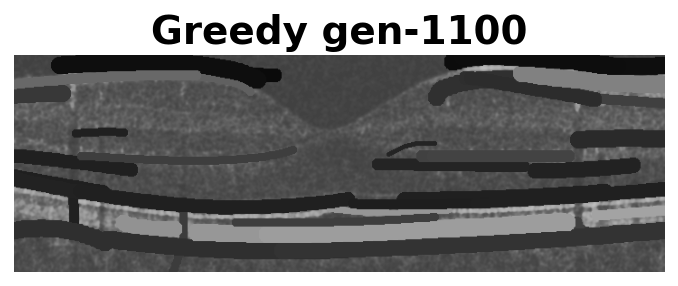

Generation 1101: SSIM = 0.353, Scores = 194 ± 104, [-22, 392], Worms = 51  (took 0.64 sec)
Generation 1102: SSIM = 0.354, Scores = 194 ± 104, [-35, 392], Worms = 51  (took 0.69 sec)
Generation 1103: SSIM = 0.353, Scores = 194 ± 104, [-22, 392], Worms = 52  (took 0.68 sec)
Generation 1104: SSIM = 0.353, Scores = 194 ± 104, [-22, 392], Worms = 51  (took 0.61 sec)
Generation 1105: SSIM = 0.353, Scores = 194 ± 103, [-16, 392], Worms = 51  (took 0.68 sec)
Generation 1106: SSIM = 0.353, Scores = 194 ± 104, [-33, 392], Worms = 51  (took 0.68 sec)
Generation 1107: SSIM = 0.353, Scores = 194 ± 104, [-25, 392], Worms = 51  (took 0.68 sec)
Generation 1108: SSIM = 0.353, Scores = 194 ± 104, [-26, 392], Worms = 52  (took 0.68 sec)
Generation 1109: SSIM = 0.353, Scores = 194 ± 104, [-26, 392], Worms = 51  (took 0.59 sec)
Generation 1110: SSIM = 0.353, Scores = 194 ± 104, [-26, 392], Worms = 52  (took 0.65 sec)
Generation 1111: SSIM = 0.353, Scores = 194 ± 104, [-26, 392], Worms = 51  (took 0.58 sec)

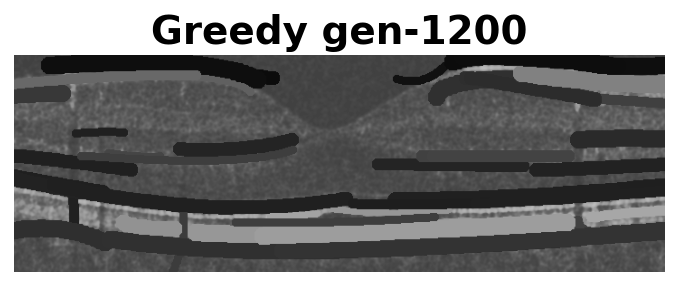

Generation 1201: SSIM = 0.359, Scores = 191 ± 104, [14, 392], Worms = 55  (took 0.65 sec)
Generation 1202: SSIM = 0.360, Scores = 191 ± 104, [16, 392], Worms = 55  (took 0.64 sec)
Generation 1203: SSIM = 0.360, Scores = 191 ± 104, [16, 392], Worms = 55  (took 0.63 sec)
Generation 1204: SSIM = 0.360, Scores = 187 ± 107, [-27, 392], Worms = 56  (took 0.74 sec)
Generation 1205: SSIM = 0.360, Scores = 188 ± 106, [-27, 392], Worms = 55  (took 0.67 sec)
Generation 1206: SSIM = 0.360, Scores = 192 ± 103, [16, 392], Worms = 55  (took 0.63 sec)
Generation 1207: SSIM = 0.360, Scores = 193 ± 102, [16, 392], Worms = 55  (took 0.63 sec)
Generation 1208: SSIM = 0.360, Scores = 193 ± 102, [16, 392], Worms = 55  (took 0.63 sec)
Generation 1209: SSIM = 0.360, Scores = 189 ± 105, [-29, 392], Worms = 56  (took 0.73 sec)
Generation 1210: SSIM = 0.360, Scores = 189 ± 105, [-29, 392], Worms = 55  (took 0.66 sec)
Generation 1211: SSIM = 0.360, Scores = 189 ± 105, [-30, 392], Worms = 56  (took 0.73 sec)
Gener

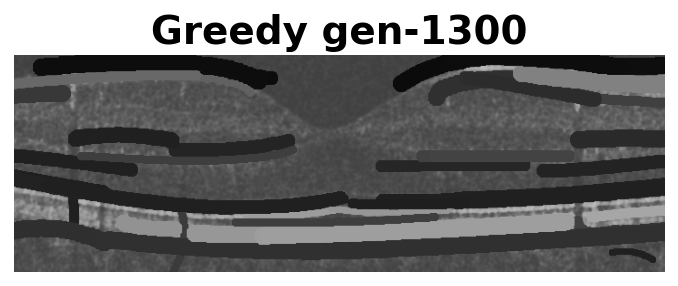

Generation 1301: SSIM = 0.364, Scores = 194 ± 104, [-30, 392], Worms = 55  (took 0.70 sec)
Generation 1302: SSIM = 0.363, Scores = 194 ± 104, [-29, 392], Worms = 55  (took 0.73 sec)
Generation 1303: SSIM = 0.364, Scores = 194 ± 104, [-23, 392], Worms = 56  (took 0.73 sec)
Generation 1304: SSIM = 0.364, Scores = 194 ± 104, [-23, 392], Worms = 55  (took 0.66 sec)
Generation 1305: SSIM = 0.364, Scores = 194 ± 104, [-23, 392], Worms = 56  (took 0.72 sec)
Generation 1306: SSIM = 0.364, Scores = 194 ± 104, [-23, 392], Worms = 55  (took 0.67 sec)
Generation 1307: SSIM = 0.364, Scores = 194 ± 104, [-21, 392], Worms = 56  (took 0.73 sec)
Generation 1308: SSIM = 0.364, Scores = 194 ± 104, [-21, 392], Worms = 55  (took 0.66 sec)
Generation 1309: SSIM = 0.364, Scores = 194 ± 104, [-31, 392], Worms = 55  (took 0.73 sec)
Generation 1310: SSIM = 0.364, Scores = 198 ± 101, [17, 392], Worms = 55  (took 0.62 sec)
Generation 1311: SSIM = 0.363, Scores = 194 ± 104, [-21, 392], Worms = 56  (took 0.72 sec)


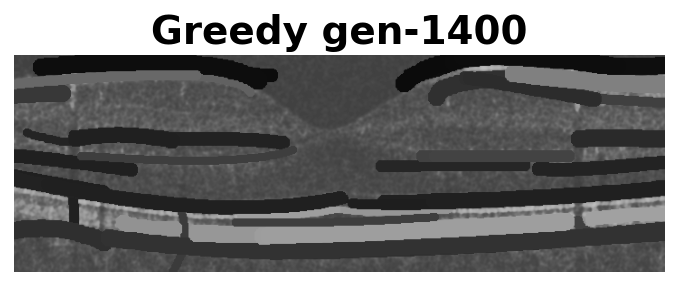

Generation 1401: SSIM = 0.365, Scores = 190 ± 108, [-24, 392], Worms = 58  (took 0.75 sec)
Generation 1402: SSIM = 0.365, Scores = 190 ± 108, [-24, 392], Worms = 57  (took 0.68 sec)
Generation 1403: SSIM = 0.364, Scores = 190 ± 107, [-15, 392], Worms = 57  (took 0.77 sec)
Generation 1404: SSIM = 0.364, Scores = 189 ± 108, [-28, 392], Worms = 57  (took 0.75 sec)
Generation 1405: SSIM = 0.364, Scores = 189 ± 108, [-33, 392], Worms = 58  (took 0.75 sec)
Generation 1406: SSIM = 0.364, Scores = 189 ± 108, [-33, 392], Worms = 57  (took 0.68 sec)
Generation 1407: SSIM = 0.364, Scores = 189 ± 108, [-32, 392], Worms = 58  (took 0.74 sec)
Generation 1408: SSIM = 0.364, Scores = 190 ± 108, [-32, 392], Worms = 57  (took 0.70 sec)
Generation 1409: SSIM = 0.364, Scores = 190 ± 107, [-26, 392], Worms = 58  (took 0.76 sec)
Generation 1410: SSIM = 0.363, Scores = 190 ± 107, [-26, 392], Worms = 57  (took 0.69 sec)
Generation 1411: SSIM = 0.364, Scores = 190 ± 107, [-34, 392], Worms = 58  (took 0.75 sec)

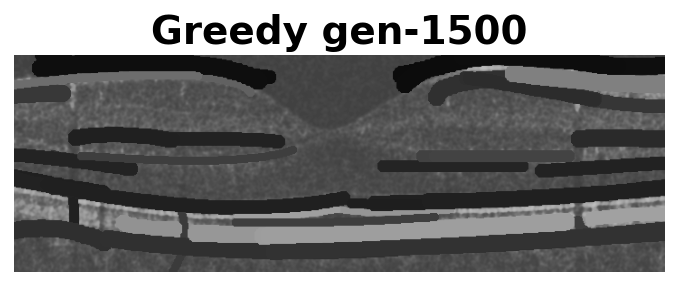

Generation 1501: SSIM = 0.364, Scores = 192 ± 104, [-22, 392], Worms = 59  (took 0.78 sec)
Generation 1502: SSIM = 0.364, Scores = 192 ± 104, [-24, 392], Worms = 59  (took 0.76 sec)
Generation 1503: SSIM = 0.364, Scores = 192 ± 103, [-21, 392], Worms = 60  (took 0.77 sec)
Generation 1504: SSIM = 0.364, Scores = 189 ± 106, [-36, 392], Worms = 61  (took 0.82 sec)
Generation 1505: SSIM = 0.364, Scores = 189 ± 105, [-36, 392], Worms = 61  (took 0.72 sec)
Generation 1506: SSIM = 0.364, Scores = 189 ± 105, [-36, 392], Worms = 60  (took 0.71 sec)
Generation 1507: SSIM = 0.365, Scores = 189 ± 105, [-30, 392], Worms = 61  (took 0.78 sec)
Generation 1508: SSIM = 0.364, Scores = 190 ± 105, [-30, 392], Worms = 61  (took 0.71 sec)
Generation 1509: SSIM = 0.366, Scores = 190 ± 104, [-30, 392], Worms = 61  (took 0.71 sec)
Generation 1510: SSIM = 0.366, Scores = 190 ± 104, [-30, 392], Worms = 61  (took 0.71 sec)
Generation 1511: SSIM = 0.366, Scores = 190 ± 104, [-30, 392], Worms = 61  (took 0.71 sec)

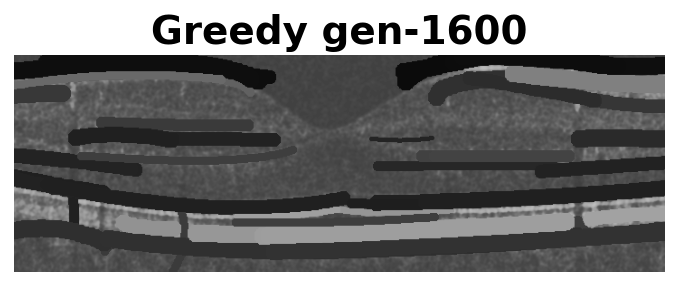

Generation 1601: SSIM = 0.367, Scores = 190 ± 104, [-16, 392], Worms = 62  (took 0.78 sec)
Generation 1602: SSIM = 0.367, Scores = 190 ± 104, [-16, 392], Worms = 61  (took 0.75 sec)
Generation 1603: SSIM = 0.366, Scores = 190 ± 104, [-20, 392], Worms = 62  (took 0.80 sec)
Generation 1604: SSIM = 0.366, Scores = 190 ± 104, [-20, 392], Worms = 61  (took 0.74 sec)
Generation 1605: SSIM = 0.367, Scores = 191 ± 103, [-20, 392], Worms = 62  (took 0.81 sec)
Generation 1606: SSIM = 0.367, Scores = 191 ± 103, [-20, 392], Worms = 61  (took 0.74 sec)
Generation 1607: SSIM = 0.367, Scores = 195 ± 100, [19, 392], Worms = 61  (took 0.69 sec)
Generation 1608: SSIM = 0.367, Scores = 195 ± 100, [19, 392], Worms = 61  (took 0.69 sec)
Generation 1609: SSIM = 0.367, Scores = 191 ± 103, [-34, 392], Worms = 61  (took 0.79 sec)
Generation 1610: SSIM = 0.367, Scores = 191 ± 103, [-39, 392], Worms = 61  (took 0.79 sec)
Generation 1611: SSIM = 0.367, Scores = 191 ± 103, [-27, 392], Worms = 62  (took 0.80 sec)
G

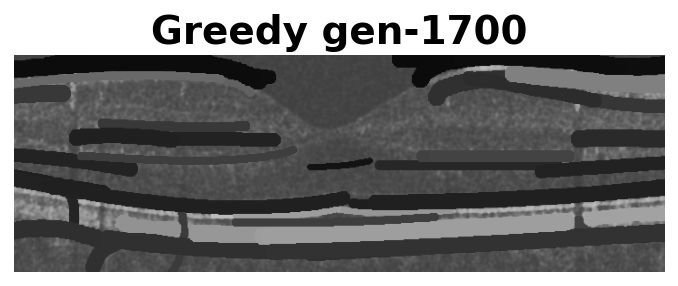

Generation 1701: SSIM = 0.367, Scores = 195 ± 101, [-27, 392], Worms = 64  (took 0.79 sec)
Generation 1702: SSIM = 0.367, Scores = 195 ± 101, [-27, 392], Worms = 63  (took 0.74 sec)
Generation 1703: SSIM = 0.368, Scores = 199 ± 98, [19, 392], Worms = 63  (took 0.70 sec)
Generation 1704: SSIM = 0.367, Scores = 195 ± 102, [-30, 392], Worms = 64  (took 0.81 sec)
Generation 1705: SSIM = 0.367, Scores = 195 ± 102, [-30, 392], Worms = 63  (took 0.73 sec)
Generation 1706: SSIM = 0.367, Scores = 199 ± 98, [19, 392], Worms = 63  (took 0.70 sec)
Generation 1707: SSIM = 0.368, Scores = 195 ± 101, [-20, 392], Worms = 63  (took 0.80 sec)
Generation 1708: SSIM = 0.367, Scores = 195 ± 101, [-23, 392], Worms = 63  (took 0.81 sec)
Generation 1709: SSIM = 0.367, Scores = 195 ± 101, [-25, 392], Worms = 64  (took 0.81 sec)
Generation 1710: SSIM = 0.367, Scores = 195 ± 101, [-25, 392], Worms = 63  (took 0.74 sec)
Generation 1711: SSIM = 0.367, Scores = 195 ± 101, [-24, 392], Worms = 63  (took 0.81 sec)
Gen

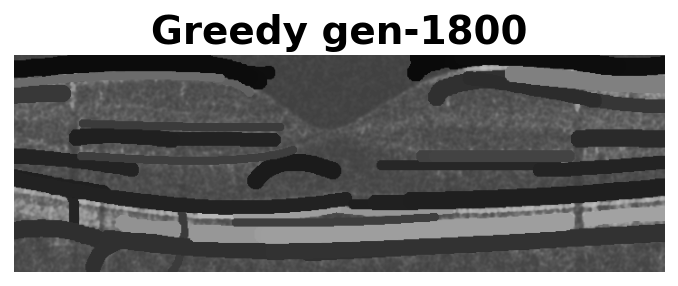

Generation 1801: SSIM = 0.368, Scores = 200 ± 98, [19, 392], Worms = 65  (took 0.75 sec)
Generation 1802: SSIM = 0.368, Scores = 196 ± 101, [-25, 392], Worms = 66  (took 0.84 sec)
Generation 1803: SSIM = 0.368, Scores = 197 ± 101, [-25, 392], Worms = 65  (took 0.77 sec)
Generation 1804: SSIM = 0.368, Scores = 200 ± 98, [19, 392], Worms = 65  (took 0.72 sec)
Generation 1805: SSIM = 0.368, Scores = 200 ± 98, [19, 392], Worms = 65  (took 0.72 sec)
Generation 1806: SSIM = 0.368, Scores = 200 ± 98, [19, 392], Worms = 65  (took 0.71 sec)
Generation 1807: SSIM = 0.368, Scores = 200 ± 98, [19, 392], Worms = 65  (took 0.72 sec)
Generation 1808: SSIM = 0.368, Scores = 197 ± 101, [-34, 392], Worms = 65  (took 0.84 sec)
Generation 1809: SSIM = 0.368, Scores = 197 ± 101, [-28, 392], Worms = 65  (took 0.83 sec)
Generation 1810: SSIM = 0.368, Scores = 197 ± 101, [-25, 392], Worms = 66  (took 0.83 sec)
Generation 1811: SSIM = 0.368, Scores = 197 ± 101, [-25, 392], Worms = 65  (took 0.77 sec)
Generatio

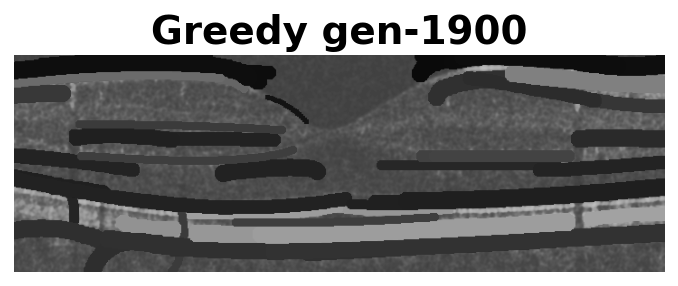

Generation 1901: SSIM = 0.369, Scores = 198 ± 101, [-26, 392], Worms = 66  (took 0.78 sec)
Generation 1902: SSIM = 0.369, Scores = 198 ± 101, [-23, 392], Worms = 66  (took 0.85 sec)
Generation 1903: SSIM = 0.369, Scores = 201 ± 98, [20, 392], Worms = 66  (took 0.74 sec)
Generation 1904: SSIM = 0.369, Scores = 202 ± 98, [20, 392], Worms = 66  (took 0.74 sec)
Generation 1905: SSIM = 0.369, Scores = 198 ± 101, [-17, 392], Worms = 66  (took 0.85 sec)
Generation 1906: SSIM = 0.369, Scores = 198 ± 102, [-26, 392], Worms = 66  (took 0.84 sec)
Generation 1907: SSIM = 0.369, Scores = 198 ± 102, [-26, 392], Worms = 66  (took 0.85 sec)
Generation 1908: SSIM = 0.369, Scores = 198 ± 101, [-23, 392], Worms = 66  (took 0.84 sec)
Generation 1909: SSIM = 0.369, Scores = 198 ± 102, [-26, 392], Worms = 66  (took 0.84 sec)
Generation 1910: SSIM = 0.369, Scores = 202 ± 98, [20, 392], Worms = 66  (took 0.74 sec)
Generation 1911: SSIM = 0.369, Scores = 198 ± 102, [-29, 392], Worms = 66  (took 0.84 sec)
Gener

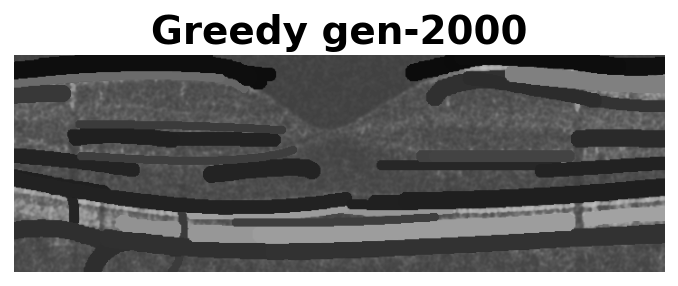

Generation 2001: SSIM = 0.368, Scores = 200 ± 102, [-25, 392], Worms = 68  (took 0.85 sec)
Generation 2002: SSIM = 0.368, Scores = 200 ± 102, [-25, 392], Worms = 67  (took 0.75 sec)
Generation 2003: SSIM = 0.368, Scores = 200 ± 102, [-19, 392], Worms = 67  (took 0.82 sec)
Generation 2004: SSIM = 0.368, Scores = 200 ± 102, [-21, 392], Worms = 67  (took 0.83 sec)
Generation 2005: SSIM = 0.368, Scores = 200 ± 102, [-19, 392], Worms = 68  (took 0.82 sec)
Generation 2006: SSIM = 0.368, Scores = 200 ± 102, [-19, 392], Worms = 67  (took 0.76 sec)
Generation 2007: SSIM = 0.368, Scores = 200 ± 102, [-34, 392], Worms = 67  (took 0.84 sec)
Generation 2008: SSIM = 0.368, Scores = 200 ± 102, [-29, 392], Worms = 68  (took 0.86 sec)
Generation 2009: SSIM = 0.368, Scores = 200 ± 102, [-29, 392], Worms = 67  (took 0.79 sec)
Generation 2010: SSIM = 0.369, Scores = 200 ± 102, [-21, 392], Worms = 68  (took 0.86 sec)
Generation 2011: SSIM = 0.369, Scores = 200 ± 102, [-21, 392], Worms = 67  (took 0.79 sec)

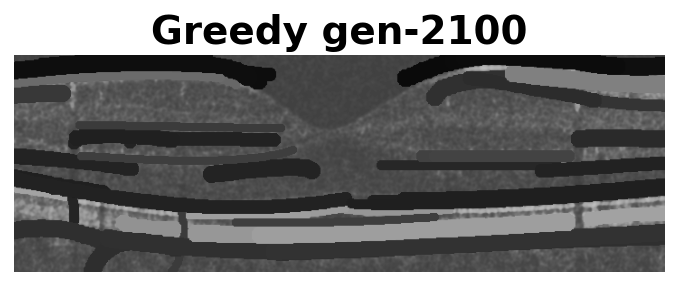

Generation 2101: SSIM = 0.373, Scores = 202 ± 99, [33, 392], Worms = 69  (took 0.79 sec)
Generation 2102: SSIM = 0.373, Scores = 202 ± 99, [37, 392], Worms = 69  (took 0.77 sec)
Generation 2103: SSIM = 0.373, Scores = 202 ± 99, [38, 392], Worms = 69  (took 0.79 sec)
Generation 2104: SSIM = 0.373, Scores = 202 ± 98, [48, 392], Worms = 69  (took 0.77 sec)
Generation 2105: SSIM = 0.373, Scores = 203 ± 98, [53, 392], Worms = 69  (took 0.78 sec)
Generation 2106: SSIM = 0.373, Scores = 199 ± 101, [-32, 392], Worms = 70  (took 0.90 sec)
Generation 2107: SSIM = 0.373, Scores = 199 ± 101, [-32, 392], Worms = 69  (took 0.80 sec)
Generation 2108: SSIM = 0.373, Scores = 203 ± 98, [53, 392], Worms = 69  (took 0.75 sec)
Generation 2109: SSIM = 0.373, Scores = 203 ± 98, [53, 392], Worms = 69  (took 0.75 sec)
Generation 2110: SSIM = 0.373, Scores = 200 ± 101, [-27, 392], Worms = 70  (took 0.88 sec)
Generation 2111: SSIM = 0.373, Scores = 200 ± 101, [-27, 392], Worms = 70  (took 0.81 sec)
Generation 21

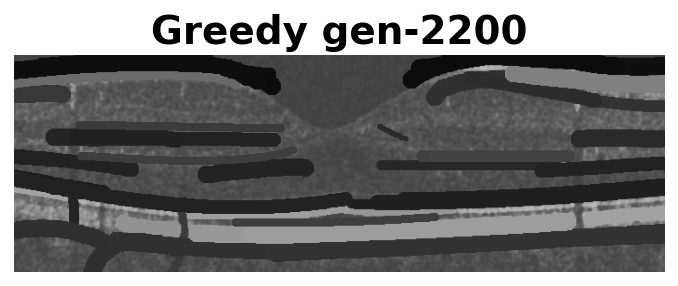

Generation 2201: SSIM = 0.373, Scores = 201 ± 100, [-31, 392], Worms = 70  (took 0.82 sec)
Generation 2202: SSIM = 0.373, Scores = 201 ± 100, [-29, 392], Worms = 71  (took 0.85 sec)
Generation 2203: SSIM = 0.373, Scores = 201 ± 100, [-29, 392], Worms = 70  (took 0.80 sec)
Generation 2204: SSIM = 0.373, Scores = 201 ± 100, [-28, 392], Worms = 70  (took 0.85 sec)
Generation 2205: SSIM = 0.373, Scores = 201 ± 100, [-36, 392], Worms = 70  (took 0.85 sec)
Generation 2206: SSIM = 0.373, Scores = 200 ± 100, [-25, 392], Worms = 72  (took 0.96 sec)
Generation 2207: SSIM = 0.373, Scores = 201 ± 99, [-25, 392], Worms = 71  (took 0.84 sec)
Generation 2208: SSIM = 0.373, Scores = 201 ± 99, [-18, 392], Worms = 72  (took 0.86 sec)
Generation 2209: SSIM = 0.373, Scores = 201 ± 99, [-18, 392], Worms = 71  (took 0.82 sec)
Generation 2210: SSIM = 0.373, Scores = 204 ± 96, [53, 392], Worms = 71  (took 0.79 sec)
Generation 2211: SSIM = 0.373, Scores = 201 ± 99, [-13, 392], Worms = 71  (took 0.87 sec)
Gener

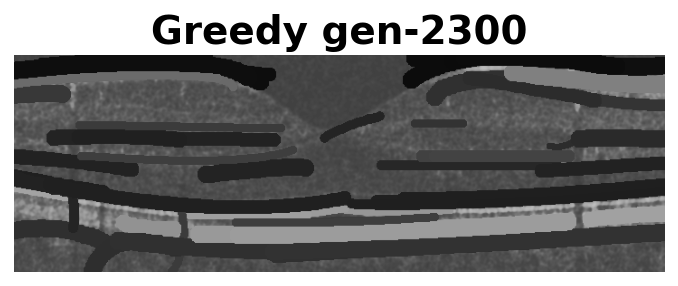

Generation 2301: SSIM = 0.374, Scores = 199 ± 103, [-14, 392], Worms = 73  (took 0.90 sec)
Generation 2302: SSIM = 0.374, Scores = 199 ± 104, [-25, 392], Worms = 73  (took 0.93 sec)
Generation 2303: SSIM = 0.374, Scores = 199 ± 104, [-36, 392], Worms = 74  (took 0.91 sec)
Generation 2304: SSIM = 0.374, Scores = 199 ± 104, [-36, 392], Worms = 73  (took 0.84 sec)
Generation 2305: SSIM = 0.374, Scores = 199 ± 104, [-24, 392], Worms = 74  (took 0.91 sec)
Generation 2306: SSIM = 0.374, Scores = 199 ± 103, [-24, 392], Worms = 73  (took 0.83 sec)
Generation 2307: SSIM = 0.375, Scores = 202 ± 101, [4, 392], Worms = 73  (took 0.79 sec)
Generation 2308: SSIM = 0.374, Scores = 202 ± 101, [4, 392], Worms = 73  (took 0.79 sec)
Generation 2309: SSIM = 0.374, Scores = 199 ± 104, [-25, 392], Worms = 73  (took 0.91 sec)
Generation 2310: SSIM = 0.375, Scores = 202 ± 101, [4, 392], Worms = 73  (took 0.80 sec)
Generation 2311: SSIM = 0.374, Scores = 199 ± 104, [-29, 392], Worms = 73  (took 0.90 sec)
Gener

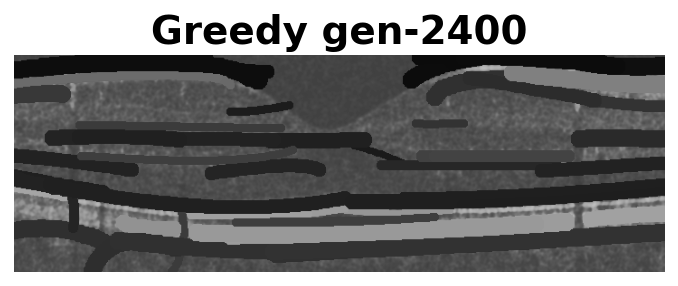

Generation 2401: SSIM = 0.375, Scores = 199 ± 105, [-28, 392], Worms = 74  (took 0.91 sec)
Generation 2402: SSIM = 0.374, Scores = 199 ± 105, [-30, 392], Worms = 74  (took 0.96 sec)
Generation 2403: SSIM = 0.374, Scores = 202 ± 103, [5, 392], Worms = 74  (took 0.83 sec)
Generation 2404: SSIM = 0.374, Scores = 199 ± 105, [-31, 392], Worms = 75  (took 0.95 sec)
Generation 2405: SSIM = 0.374, Scores = 199 ± 105, [-31, 392], Worms = 74  (took 0.89 sec)
Generation 2406: SSIM = 0.374, Scores = 199 ± 105, [-25, 392], Worms = 75  (took 0.97 sec)
Generation 2407: SSIM = 0.374, Scores = 199 ± 105, [-25, 392], Worms = 74  (took 0.87 sec)
Generation 2408: SSIM = 0.374, Scores = 199 ± 105, [-31, 392], Worms = 75  (took 0.94 sec)
Generation 2409: SSIM = 0.374, Scores = 199 ± 105, [-31, 392], Worms = 74  (took 0.88 sec)
Generation 2410: SSIM = 0.374, Scores = 199 ± 105, [-28, 392], Worms = 74  (took 0.95 sec)
Generation 2411: SSIM = 0.374, Scores = 199 ± 105, [-35, 392], Worms = 74  (took 0.96 sec)
G

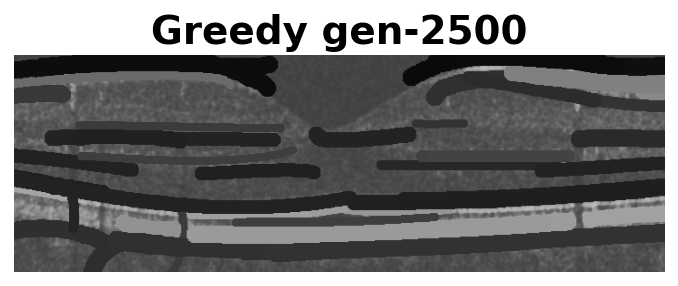

Generation 2501: SSIM = 0.376, Scores = 204 ± 100, [5, 392], Worms = 78  (took 0.91 sec)
Generation 2502: SSIM = 0.376, Scores = 204 ± 100, [5, 392], Worms = 78  (took 0.89 sec)
Generation 2503: SSIM = 0.376, Scores = 204 ± 100, [5, 392], Worms = 78  (took 0.89 sec)
Generation 2504: SSIM = 0.376, Scores = 201 ± 103, [-20, 392], Worms = 79  (took 1.01 sec)
Generation 2505: SSIM = 0.377, Scores = 201 ± 103, [-20, 392], Worms = 79  (took 0.94 sec)
Generation 2506: SSIM = 0.376, Scores = 202 ± 103, [-20, 392], Worms = 78  (took 0.93 sec)
Generation 2507: SSIM = 0.374, Scores = 201 ± 103, [-27, 392], Worms = 79  (took 0.99 sec)
Generation 2508: SSIM = 0.374, Scores = 202 ± 103, [-27, 392], Worms = 79  (took 0.93 sec)
Generation 2509: SSIM = 0.374, Scores = 202 ± 103, [-27, 392], Worms = 79  (took 0.92 sec)
Generation 2510: SSIM = 0.374, Scores = 202 ± 103, [-27, 392], Worms = 78  (took 0.88 sec)
Generation 2511: SSIM = 0.375, Scores = 205 ± 100, [5, 392], Worms = 78  (took 0.87 sec)
Generat

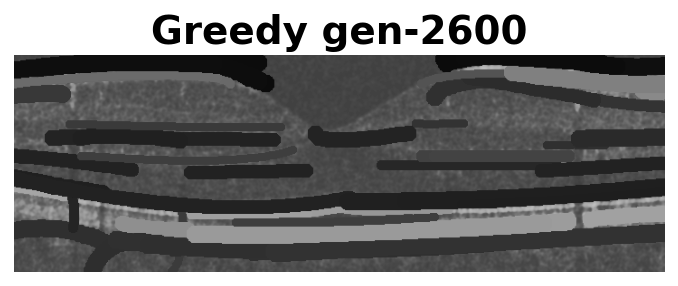

Generation 2601: SSIM = 0.377, Scores = 201 ± 104, [-20, 392], Worms = 81  (took 1.03 sec)
Generation 2602: SSIM = 0.376, Scores = 200 ± 104, [-32, 392], Worms = 81  (took 1.00 sec)
Generation 2603: SSIM = 0.375, Scores = 200 ± 105, [-40, 392], Worms = 82  (took 1.00 sec)
Generation 2604: SSIM = 0.375, Scores = 200 ± 105, [-40, 392], Worms = 81  (took 0.92 sec)
Generation 2605: SSIM = 0.376, Scores = 201 ± 104, [-31, 392], Worms = 82  (took 0.99 sec)
Generation 2606: SSIM = 0.376, Scores = 201 ± 104, [-31, 392], Worms = 81  (took 0.94 sec)
Generation 2607: SSIM = 0.376, Scores = 200 ± 104, [-35, 392], Worms = 82  (took 1.01 sec)
Generation 2608: SSIM = 0.376, Scores = 200 ± 104, [-35, 392], Worms = 81  (took 0.92 sec)
Generation 2609: SSIM = 0.376, Scores = 203 ± 102, [5, 392], Worms = 81  (took 0.89 sec)
Generation 2610: SSIM = 0.376, Scores = 200 ± 105, [-42, 392], Worms = 82  (took 1.00 sec)
Generation 2611: SSIM = 0.376, Scores = 200 ± 105, [-42, 392], Worms = 81  (took 0.96 sec)
G

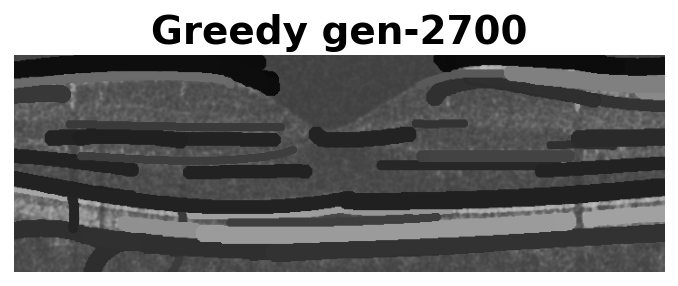

Generation 2701: SSIM = 0.376, Scores = 201 ± 104, [-36, 393], Worms = 83  (took 1.10 sec)
Generation 2702: SSIM = 0.376, Scores = 201 ± 104, [-36, 393], Worms = 82  (took 0.97 sec)
Generation 2703: SSIM = 0.376, Scores = 201 ± 104, [-32, 393], Worms = 82  (took 1.04 sec)
Generation 2704: SSIM = 0.376, Scores = 201 ± 104, [-35, 393], Worms = 83  (took 1.03 sec)
Generation 2705: SSIM = 0.376, Scores = 201 ± 104, [-35, 393], Worms = 82  (took 0.96 sec)
Generation 2706: SSIM = 0.376, Scores = 204 ± 101, [5, 393], Worms = 82  (took 0.93 sec)
Generation 2707: SSIM = 0.376, Scores = 201 ± 104, [-28, 393], Worms = 83  (took 1.04 sec)
Generation 2708: SSIM = 0.376, Scores = 201 ± 104, [-28, 393], Worms = 82  (took 0.96 sec)
Generation 2709: SSIM = 0.376, Scores = 201 ± 104, [-28, 393], Worms = 82  (took 1.04 sec)
Generation 2710: SSIM = 0.376, Scores = 201 ± 104, [-31, 393], Worms = 83  (took 1.05 sec)
Generation 2711: SSIM = 0.376, Scores = 201 ± 104, [-31, 393], Worms = 82  (took 0.96 sec)
G

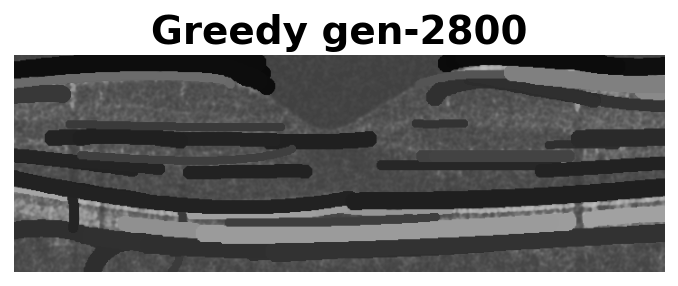

Generation 2801: SSIM = 0.375, Scores = 205 ± 102, [5, 397], Worms = 82  (took 0.95 sec)
Generation 2802: SSIM = 0.375, Scores = 203 ± 104, [-27, 397], Worms = 83  (took 1.04 sec)
Generation 2803: SSIM = 0.375, Scores = 203 ± 104, [-27, 397], Worms = 82  (took 0.98 sec)
Generation 2804: SSIM = 0.375, Scores = 203 ± 104, [-27, 397], Worms = 82  (took 1.05 sec)
Generation 2805: SSIM = 0.375, Scores = 203 ± 104, [-24, 397], Worms = 82  (took 1.04 sec)
Generation 2806: SSIM = 0.376, Scores = 203 ± 104, [-31, 397], Worms = 83  (took 1.05 sec)
Generation 2807: SSIM = 0.376, Scores = 203 ± 104, [-31, 397], Worms = 82  (took 0.97 sec)
Generation 2808: SSIM = 0.376, Scores = 203 ± 104, [-24, 397], Worms = 82  (took 1.06 sec)
Generation 2809: SSIM = 0.375, Scores = 203 ± 104, [-31, 397], Worms = 82  (took 1.06 sec)
Generation 2810: SSIM = 0.376, Scores = 203 ± 105, [-42, 397], Worms = 82  (took 1.05 sec)
Generation 2811: SSIM = 0.376, Scores = 203 ± 104, [-28, 397], Worms = 82  (took 1.04 sec)
G

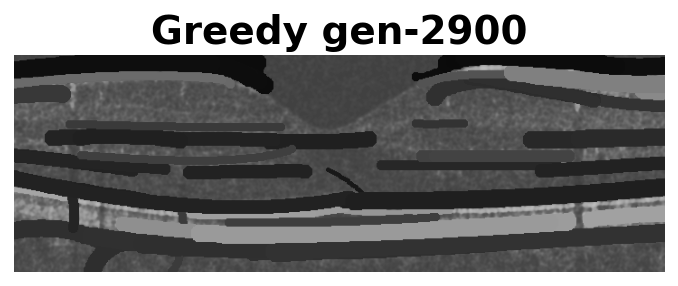

Generation 2901: SSIM = 0.374, Scores = 203 ± 105, [-39, 397], Worms = 83  (took 1.02 sec)
Generation 2902: SSIM = 0.375, Scores = 203 ± 105, [-23, 397], Worms = 84  (took 1.07 sec)
Generation 2903: SSIM = 0.375, Scores = 203 ± 105, [-23, 397], Worms = 83  (took 0.97 sec)
Generation 2904: SSIM = 0.374, Scores = 203 ± 105, [-30, 397], Worms = 84  (took 1.06 sec)
Generation 2905: SSIM = 0.375, Scores = 203 ± 105, [-30, 397], Worms = 84  (took 0.99 sec)
Generation 2906: SSIM = 0.375, Scores = 203 ± 105, [-30, 397], Worms = 83  (took 0.98 sec)
Generation 2907: SSIM = 0.375, Scores = 203 ± 105, [-34, 397], Worms = 84  (took 1.04 sec)
Generation 2908: SSIM = 0.375, Scores = 203 ± 105, [-34, 397], Worms = 83  (took 0.97 sec)
Generation 2909: SSIM = 0.375, Scores = 203 ± 105, [-35, 397], Worms = 84  (took 1.05 sec)
Generation 2910: SSIM = 0.375, Scores = 203 ± 105, [-35, 397], Worms = 84  (took 0.96 sec)
Generation 2911: SSIM = 0.375, Scores = 204 ± 104, [-35, 397], Worms = 83  (took 0.96 sec)

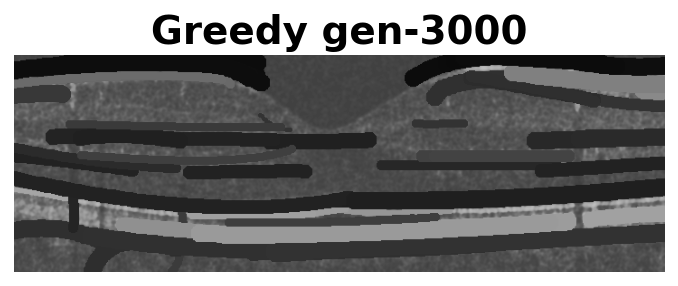

Generation 3001: SSIM = 0.375, Scores = 209 ± 104, [-28, 397], Worms = 83  (took 1.00 sec)
Generation 3002: SSIM = 0.375, Scores = 207 ± 105, [-9, 397], Worms = 85  (took 1.20 sec)
Generation 3003: SSIM = 0.375, Scores = 207 ± 105, [-9, 397], Worms = 84  (took 0.99 sec)
Generation 3004: SSIM = 0.375, Scores = 209 ± 103, [5, 397], Worms = 84  (took 0.96 sec)
Generation 3005: SSIM = 0.375, Scores = 206 ± 105, [-27, 397], Worms = 85  (took 1.07 sec)
Generation 3006: SSIM = 0.375, Scores = 207 ± 105, [-27, 397], Worms = 85  (took 1.00 sec)
Generation 3007: SSIM = 0.375, Scores = 207 ± 105, [-27, 397], Worms = 84  (took 0.99 sec)
Generation 3008: SSIM = 0.374, Scores = 207 ± 105, [-29, 397], Worms = 85  (took 1.07 sec)
Generation 3009: SSIM = 0.374, Scores = 207 ± 105, [-29, 397], Worms = 84  (took 0.98 sec)
Generation 3010: SSIM = 0.375, Scores = 207 ± 105, [-33, 397], Worms = 85  (took 1.06 sec)
Generation 3011: SSIM = 0.375, Scores = 207 ± 105, [-33, 397], Worms = 85  (took 0.98 sec)
Gen

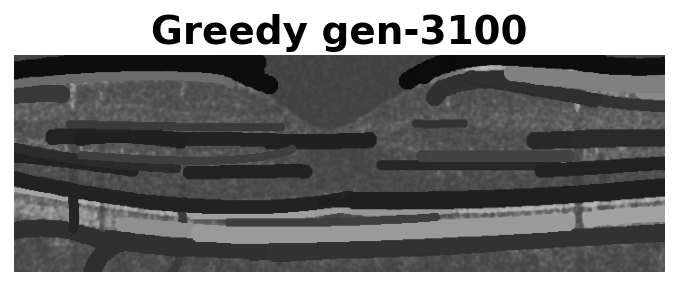

Generation 3101: SSIM = 0.375, Scores = 209 ± 104, [-35, 397], Worms = 86  (took 1.12 sec)
Generation 3102: SSIM = 0.375, Scores = 209 ± 104, [-35, 397], Worms = 85  (took 1.01 sec)
Generation 3103: SSIM = 0.375, Scores = 212 ± 101, [5, 397], Worms = 85  (took 0.96 sec)
Generation 3104: SSIM = 0.375, Scores = 209 ± 104, [-37, 397], Worms = 85  (took 1.08 sec)
Generation 3105: SSIM = 0.375, Scores = 212 ± 101, [5, 397], Worms = 85  (took 0.96 sec)
Generation 3106: SSIM = 0.375, Scores = 209 ± 103, [-29, 397], Worms = 85  (took 1.06 sec)
Generation 3107: SSIM = 0.374, Scores = 209 ± 104, [-34, 397], Worms = 86  (took 1.08 sec)
Generation 3108: SSIM = 0.374, Scores = 209 ± 104, [-34, 397], Worms = 85  (took 1.00 sec)
Generation 3109: SSIM = 0.375, Scores = 209 ± 104, [-42, 397], Worms = 86  (took 1.08 sec)
Generation 3110: SSIM = 0.375, Scores = 209 ± 104, [-42, 397], Worms = 85  (took 1.00 sec)
Generation 3111: SSIM = 0.375, Scores = 209 ± 104, [-38, 397], Worms = 85  (took 1.07 sec)
Gen

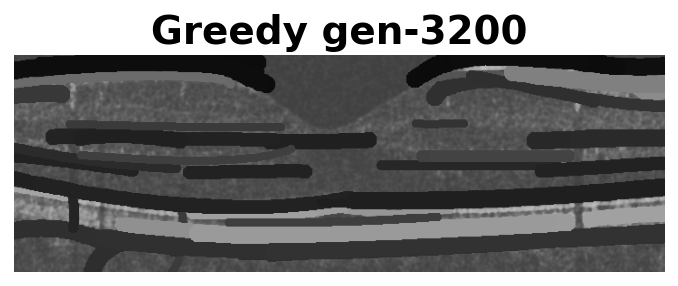

Generation 3201: SSIM = 0.377, Scores = 213 ± 101, [5, 399], Worms = 86  (took 0.99 sec)
Generation 3202: SSIM = 0.377, Scores = 210 ± 103, [-22, 399], Worms = 86  (took 1.10 sec)
Generation 3203: SSIM = 0.377, Scores = 210 ± 103, [-25, 399], Worms = 86  (took 1.10 sec)
Generation 3204: SSIM = 0.376, Scores = 210 ± 104, [-27, 399], Worms = 86  (took 1.09 sec)
Generation 3205: SSIM = 0.377, Scores = 210 ± 104, [-33, 399], Worms = 87  (took 1.07 sec)
Generation 3206: SSIM = 0.376, Scores = 210 ± 104, [-33, 399], Worms = 86  (took 1.01 sec)
Generation 3207: SSIM = 0.376, Scores = 210 ± 104, [-26, 399], Worms = 87  (took 1.09 sec)
Generation 3208: SSIM = 0.376, Scores = 210 ± 103, [-26, 399], Worms = 86  (took 1.02 sec)
Generation 3209: SSIM = 0.376, Scores = 213 ± 101, [5, 399], Worms = 86  (took 0.97 sec)
Generation 3210: SSIM = 0.376, Scores = 211 ± 103, [-23, 399], Worms = 86  (took 1.08 sec)
Generation 3211: SSIM = 0.375, Scores = 210 ± 104, [-35, 399], Worms = 86  (took 1.09 sec)
Gen

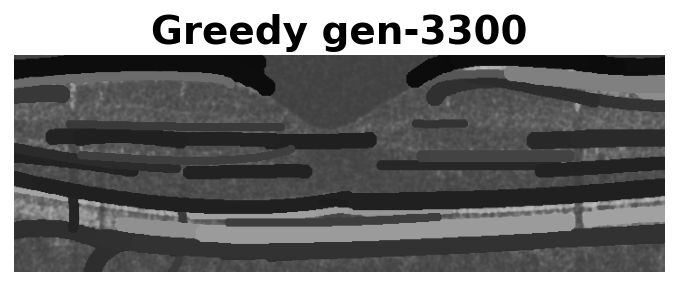

Generation 3301: SSIM = 0.376, Scores = 212 ± 104, [-45, 399], Worms = 87  (took 1.10 sec)
Generation 3302: SSIM = 0.376, Scores = 212 ± 104, [-45, 399], Worms = 86  (took 1.01 sec)
Generation 3303: SSIM = 0.376, Scores = 212 ± 104, [-34, 399], Worms = 86  (took 1.09 sec)
Generation 3304: SSIM = 0.376, Scores = 212 ± 104, [-29, 399], Worms = 86  (took 1.08 sec)
Generation 3305: SSIM = 0.376, Scores = 212 ± 104, [-27, 399], Worms = 87  (took 1.10 sec)
Generation 3306: SSIM = 0.376, Scores = 212 ± 104, [-27, 399], Worms = 87  (took 1.01 sec)
Generation 3307: SSIM = 0.376, Scores = 212 ± 104, [-27, 399], Worms = 86  (took 1.01 sec)
Generation 3308: SSIM = 0.376, Scores = 212 ± 104, [-36, 399], Worms = 87  (took 1.10 sec)
Generation 3309: SSIM = 0.376, Scores = 212 ± 104, [-36, 399], Worms = 86  (took 1.01 sec)
Generation 3310: SSIM = 0.376, Scores = 212 ± 104, [-23, 399], Worms = 86  (took 1.08 sec)
Generation 3311: SSIM = 0.375, Scores = 212 ± 104, [-37, 399], Worms = 86  (took 1.09 sec)

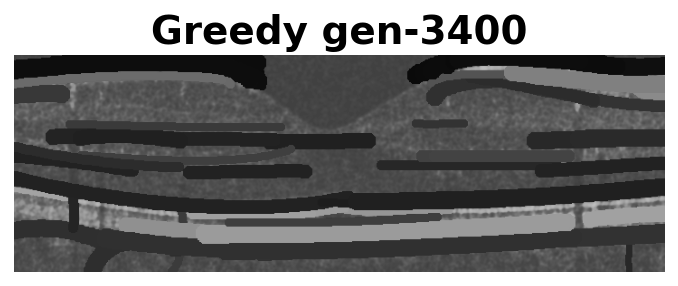

Generation 3401: SSIM = 0.376, Scores = 211 ± 105, [-32, 399], Worms = 88  (took 1.07 sec)
Generation 3402: SSIM = 0.376, Scores = 211 ± 105, [-32, 399], Worms = 87  (took 1.01 sec)
Generation 3403: SSIM = 0.376, Scores = 211 ± 105, [-36, 399], Worms = 88  (took 1.09 sec)
Generation 3404: SSIM = 0.376, Scores = 211 ± 106, [-36, 399], Worms = 87  (took 1.00 sec)
Generation 3405: SSIM = 0.376, Scores = 211 ± 105, [-34, 399], Worms = 87  (took 1.09 sec)
Generation 3406: SSIM = 0.376, Scores = 211 ± 105, [-34, 399], Worms = 88  (took 1.08 sec)
Generation 3407: SSIM = 0.376, Scores = 211 ± 105, [-34, 399], Worms = 87  (took 1.02 sec)
Generation 3408: SSIM = 0.376, Scores = 211 ± 105, [-32, 399], Worms = 87  (took 1.08 sec)
Generation 3409: SSIM = 0.376, Scores = 211 ± 105, [-34, 399], Worms = 87  (took 1.09 sec)
Generation 3410: SSIM = 0.376, Scores = 211 ± 105, [-31, 399], Worms = 88  (took 1.08 sec)
Generation 3411: SSIM = 0.376, Scores = 211 ± 105, [-31, 399], Worms = 88  (took 1.01 sec)

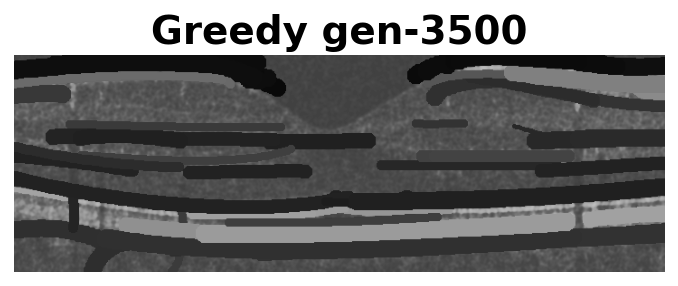

Generation 3501: SSIM = 0.377, Scores = 210 ± 104, [-21, 399], Worms = 90  (took 1.08 sec)
Generation 3502: SSIM = 0.377, Scores = 213 ± 101, [5, 399], Worms = 90  (took 1.01 sec)
Generation 3503: SSIM = 0.377, Scores = 213 ± 101, [5, 399], Worms = 90  (took 1.02 sec)
Generation 3504: SSIM = 0.377, Scores = 211 ± 103, [-20, 399], Worms = 91  (took 1.13 sec)
Generation 3505: SSIM = 0.377, Scores = 211 ± 103, [-20, 399], Worms = 90  (took 1.07 sec)
Generation 3506: SSIM = 0.376, Scores = 211 ± 104, [-34, 399], Worms = 91  (took 1.14 sec)
Generation 3507: SSIM = 0.376, Scores = 211 ± 104, [-34, 399], Worms = 90  (took 1.05 sec)
Generation 3508: SSIM = 0.377, Scores = 213 ± 101, [5, 399], Worms = 90  (took 1.01 sec)
Generation 3509: SSIM = 0.377, Scores = 211 ± 103, [-27, 399], Worms = 91  (took 1.14 sec)
Generation 3510: SSIM = 0.377, Scores = 211 ± 103, [-27, 399], Worms = 90  (took 1.06 sec)
Generation 3511: SSIM = 0.376, Scores = 211 ± 104, [-43, 399], Worms = 91  (took 1.14 sec)
Gener

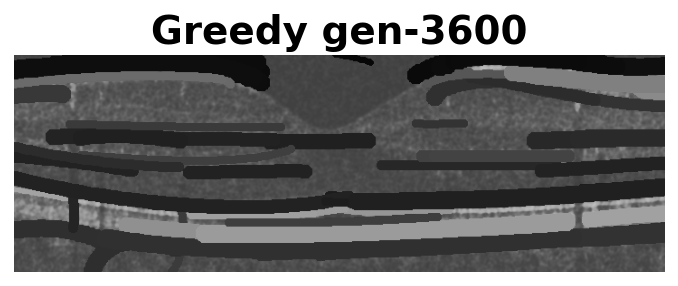

Generation 3601: SSIM = 0.376, Scores = 211 ± 103, [-33, 399], Worms = 92  (took 1.12 sec)
Generation 3602: SSIM = 0.377, Scores = 212 ± 103, [-34, 399], Worms = 93  (took 1.17 sec)
Generation 3603: SSIM = 0.377, Scores = 212 ± 103, [-34, 399], Worms = 92  (took 1.10 sec)
Generation 3604: SSIM = 0.376, Scores = 214 ± 101, [5, 399], Worms = 92  (took 1.05 sec)
Generation 3605: SSIM = 0.376, Scores = 212 ± 103, [-35, 399], Worms = 92  (took 1.16 sec)
len =  0.0 for [239 522] - [239 522]
Generation 3606: SSIM = 0.376, Scores = 212 ± 103, [-33, 399], Worms = 92  (took 1.17 sec)
Generation 3607: SSIM = 0.376, Scores = 212 ± 103, [-31, 399], Worms = 92  (took 1.16 sec)
Generation 3608: SSIM = 0.376, Scores = 212 ± 103, [-22, 399], Worms = 92  (took 1.17 sec)
Generation 3609: SSIM = 0.377, Scores = 212 ± 103, [-20, 399], Worms = 92  (took 1.18 sec)
Generation 3610: SSIM = 0.376, Scores = 212 ± 103, [-24, 399], Worms = 92  (took 1.17 sec)
Generation 3611: SSIM = 0.377, Scores = 212 ± 103, [-17

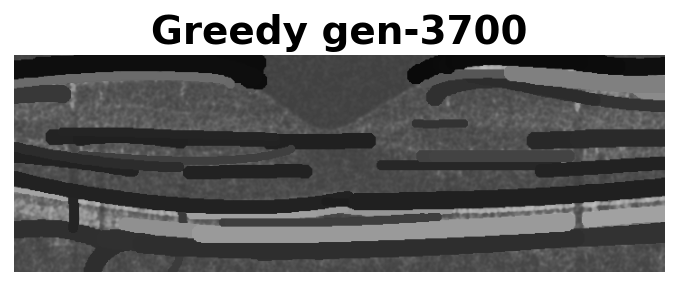

Generation 3701: SSIM = 0.375, Scores = 214 ± 101, [5, 399], Worms = 94  (took 1.09 sec)
Generation 3702: SSIM = 0.374, Scores = 211 ± 103, [-34, 399], Worms = 95  (took 1.17 sec)
Generation 3703: SSIM = 0.374, Scores = 211 ± 103, [-34, 399], Worms = 94  (took 1.10 sec)
Generation 3704: SSIM = 0.374, Scores = 211 ± 103, [-31, 399], Worms = 95  (took 1.16 sec)
Generation 3705: SSIM = 0.374, Scores = 212 ± 103, [-31, 399], Worms = 94  (took 1.10 sec)
Generation 3706: SSIM = 0.374, Scores = 211 ± 103, [-33, 399], Worms = 94  (took 1.19 sec)
Generation 3707: SSIM = 0.374, Scores = 212 ± 103, [-29, 399], Worms = 95  (took 1.19 sec)
Generation 3708: SSIM = 0.374, Scores = 212 ± 103, [-29, 399], Worms = 94  (took 1.07 sec)
Generation 3709: SSIM = 0.374, Scores = 212 ± 103, [-32, 399], Worms = 94  (took 1.15 sec)
Generation 3710: SSIM = 0.374, Scores = 211 ± 104, [-54, 399], Worms = 95  (took 1.15 sec)
Generation 3711: SSIM = 0.374, Scores = 211 ± 104, [-54, 399], Worms = 94  (took 1.06 sec)
G

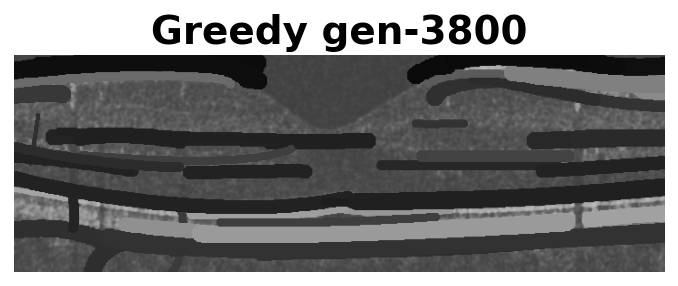

Generation 3801: SSIM = 0.374, Scores = 213 ± 102, [-31, 400], Worms = 95  (took 1.13 sec)
Generation 3802: SSIM = 0.374, Scores = 214 ± 102, [-31, 400], Worms = 95  (took 1.10 sec)
Generation 3803: SSIM = 0.374, Scores = 214 ± 102, [-31, 400], Worms = 95  (took 1.09 sec)
Generation 3804: SSIM = 0.374, Scores = 214 ± 102, [-31, 400], Worms = 94  (took 1.10 sec)
Generation 3805: SSIM = 0.374, Scores = 214 ± 103, [-56, 400], Worms = 94  (took 1.19 sec)
Generation 3806: SSIM = 0.374, Scores = 214 ± 102, [-30, 400], Worms = 95  (took 1.18 sec)
Generation 3807: SSIM = 0.374, Scores = 212 ± 104, [-38, 400], Worms = 96  (took 1.24 sec)
Generation 3808: SSIM = 0.374, Scores = 212 ± 104, [-38, 400], Worms = 95  (took 1.14 sec)
Generation 3809: SSIM = 0.374, Scores = 215 ± 102, [5, 400], Worms = 95  (took 1.09 sec)
Generation 3810: SSIM = 0.374, Scores = 212 ± 104, [-47, 400], Worms = 96  (took 1.21 sec)
Generation 3811: SSIM = 0.374, Scores = 212 ± 104, [-47, 400], Worms = 95  (took 1.14 sec)
G

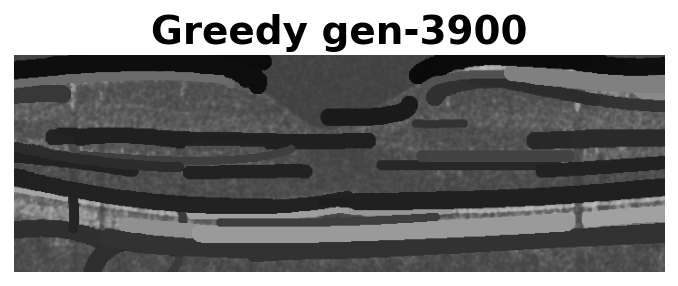

Generation 3901: SSIM = 0.374, Scores = 213 ± 104, [-25, 400], Worms = 97  (took 1.22 sec)
Generation 3902: SSIM = 0.374, Scores = 212 ± 104, [-41, 400], Worms = 97  (took 1.19 sec)
Generation 3903: SSIM = 0.374, Scores = 213 ± 104, [-37, 400], Worms = 98  (took 1.20 sec)
Generation 3904: SSIM = 0.374, Scores = 213 ± 104, [-37, 400], Worms = 97  (took 1.14 sec)
Generation 3905: SSIM = 0.375, Scores = 213 ± 104, [-37, 400], Worms = 98  (took 1.22 sec)
Generation 3906: SSIM = 0.374, Scores = 213 ± 104, [-37, 400], Worms = 98  (took 1.12 sec)
Generation 3907: SSIM = 0.374, Scores = 213 ± 104, [-37, 400], Worms = 98  (took 1.12 sec)
Generation 3908: SSIM = 0.374, Scores = 213 ± 104, [-37, 400], Worms = 97  (took 1.13 sec)
Generation 3909: SSIM = 0.374, Scores = 213 ± 104, [-24, 400], Worms = 97  (took 1.24 sec)
Generation 3910: SSIM = 0.374, Scores = 213 ± 104, [-37, 400], Worms = 97  (took 1.19 sec)
Generation 3911: SSIM = 0.373, Scores = 213 ± 104, [-32, 400], Worms = 97  (took 1.20 sec)

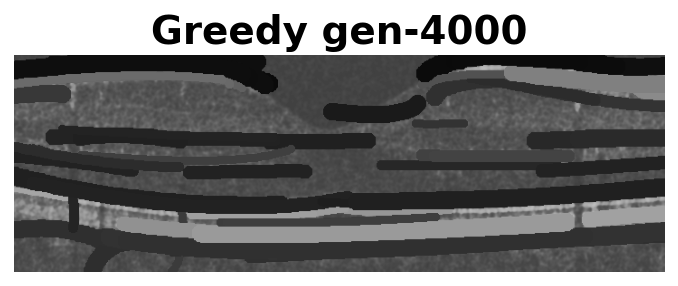

Generation 4001: SSIM = 0.375, Scores = 216 ± 102, [5, 400], Worms = 98  (took 1.16 sec)
Generation 4002: SSIM = 0.375, Scores = 213 ± 104, [-33, 400], Worms = 98  (took 1.27 sec)
Generation 4003: SSIM = 0.375, Scores = 213 ± 104, [-31, 400], Worms = 99  (took 1.27 sec)
Generation 4004: SSIM = 0.375, Scores = 213 ± 104, [-31, 400], Worms = 98  (took 1.18 sec)
Generation 4005: SSIM = 0.374, Scores = 213 ± 105, [-45, 400], Worms = 98  (took 1.27 sec)
Generation 4006: SSIM = 0.374, Scores = 213 ± 104, [-28, 400], Worms = 99  (took 1.26 sec)
Generation 4007: SSIM = 0.374, Scores = 213 ± 104, [-28, 400], Worms = 98  (took 1.17 sec)
Generation 4008: SSIM = 0.374, Scores = 213 ± 104, [-36, 400], Worms = 99  (took 1.26 sec)
Generation 4009: SSIM = 0.374, Scores = 213 ± 104, [-36, 400], Worms = 98  (took 1.17 sec)
Generation 4010: SSIM = 0.375, Scores = 213 ± 104, [-33, 400], Worms = 98  (took 1.25 sec)
Generation 4011: SSIM = 0.375, Scores = 213 ± 104, [-38, 400], Worms = 99  (took 1.24 sec)
l

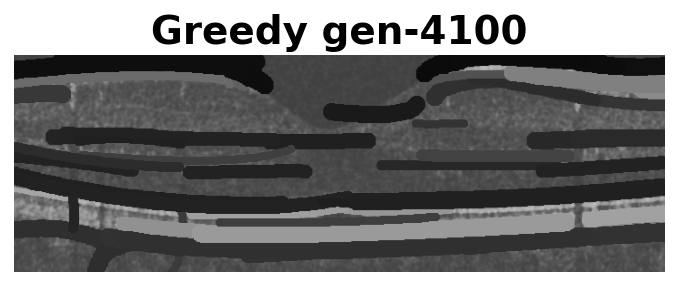

Generation 4101: SSIM = 0.375, Scores = 215 ± 104, [-28, 400], Worms = 98  (took 1.24 sec)
Generation 4102: SSIM = 0.374, Scores = 215 ± 104, [-40, 400], Worms = 98  (took 1.24 sec)
Generation 4103: SSIM = 0.374, Scores = 215 ± 104, [-32, 400], Worms = 98  (took 1.25 sec)
Generation 4104: SSIM = 0.375, Scores = 215 ± 104, [-30, 400], Worms = 99  (took 1.24 sec)
Generation 4105: SSIM = 0.375, Scores = 215 ± 104, [-30, 400], Worms = 98  (took 1.17 sec)
Generation 4106: SSIM = 0.376, Scores = 217 ± 101, [5, 400], Worms = 98  (took 1.11 sec)
Generation 4107: SSIM = 0.376, Scores = 217 ± 101, [5, 400], Worms = 98  (took 1.13 sec)
Generation 4108: SSIM = 0.376, Scores = 215 ± 104, [-22, 400], Worms = 99  (took 1.26 sec)
Generation 4109: SSIM = 0.376, Scores = 215 ± 104, [-22, 400], Worms = 98  (took 1.17 sec)
Generation 4110: SSIM = 0.375, Scores = 215 ± 104, [-34, 400], Worms = 98  (took 1.25 sec)
Generation 4111: SSIM = 0.376, Scores = 217 ± 101, [5, 400], Worms = 98  (took 1.12 sec)
Gener

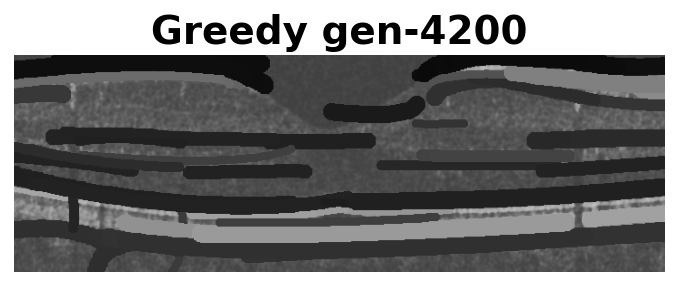

Generation 4201: SSIM = 0.375, Scores = 215 ± 104, [-32, 400], Worms = 100  (took 1.27 sec)
Generation 4202: SSIM = 0.375, Scores = 215 ± 104, [-32, 400], Worms = 99  (took 1.15 sec)
Generation 4203: SSIM = 0.374, Scores = 215 ± 104, [-33, 400], Worms = 99  (took 1.25 sec)
Generation 4204: SSIM = 0.375, Scores = 215 ± 104, [-27, 400], Worms = 99  (took 1.22 sec)
Generation 4205: SSIM = 0.375, Scores = 215 ± 103, [-21, 400], Worms = 99  (took 1.25 sec)
Generation 4206: SSIM = 0.375, Scores = 215 ± 104, [-33, 400], Worms = 99  (took 1.25 sec)
Generation 4207: SSIM = 0.376, Scores = 215 ± 105, [-66, 400], Worms = 100  (took 1.23 sec)
Generation 4208: SSIM = 0.376, Scores = 215 ± 105, [-66, 400], Worms = 99  (took 1.16 sec)
Generation 4209: SSIM = 0.375, Scores = 215 ± 104, [-35, 405], Worms = 100  (took 1.25 sec)
Generation 4210: SSIM = 0.375, Scores = 215 ± 104, [-35, 405], Worms = 99  (took 1.18 sec)
Generation 4211: SSIM = 0.375, Scores = 215 ± 104, [-21, 405], Worms = 99  (took 1.26 s

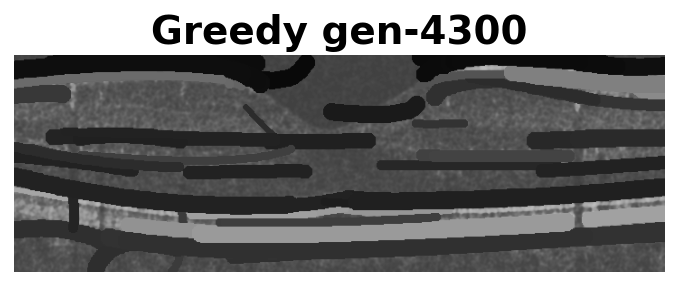

Generation 4301: SSIM = 0.377, Scores = 215 ± 104, [-28, 405], Worms = 100  (took 1.23 sec)
Generation 4302: SSIM = 0.377, Scores = 215 ± 104, [-24, 405], Worms = 101  (took 1.28 sec)
Generation 4303: SSIM = 0.377, Scores = 215 ± 104, [-24, 405], Worms = 100  (took 1.20 sec)
Generation 4304: SSIM = 0.376, Scores = 215 ± 105, [-50, 405], Worms = 101  (took 1.27 sec)
Generation 4305: SSIM = 0.376, Scores = 215 ± 105, [-50, 405], Worms = 100  (took 1.19 sec)
Generation 4306: SSIM = 0.376, Scores = 215 ± 104, [-38, 405], Worms = 101  (took 1.27 sec)
Generation 4307: SSIM = 0.376, Scores = 215 ± 104, [-38, 405], Worms = 101  (took 1.19 sec)
Generation 4308: SSIM = 0.376, Scores = 215 ± 104, [-44, 405], Worms = 100  (took 1.18 sec)
Generation 4309: SSIM = 0.376, Scores = 215 ± 104, [-39, 405], Worms = 101  (took 1.30 sec)
Generation 4310: SSIM = 0.377, Scores = 215 ± 104, [-39, 405], Worms = 100  (took 1.22 sec)
len =  0.0 for [239 480] - [239 480]
Generation 4311: SSIM = 0.377, Scores = 218

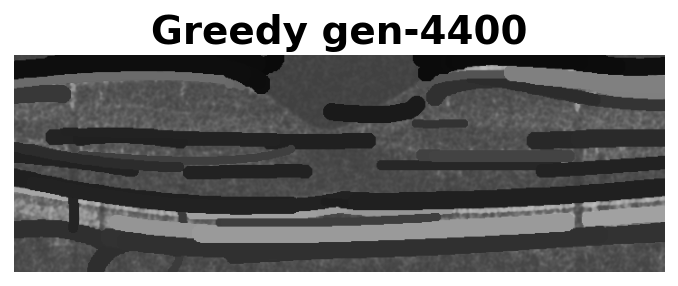

Generation 4401: SSIM = 0.376, Scores = 220 ± 101, [5, 405], Worms = 100  (took 1.16 sec)
Generation 4402: SSIM = 0.376, Scores = 217 ± 103, [-31, 405], Worms = 101  (took 1.28 sec)
Generation 4403: SSIM = 0.376, Scores = 217 ± 103, [-31, 405], Worms = 100  (took 1.17 sec)
Generation 4404: SSIM = 0.377, Scores = 217 ± 103, [-25, 405], Worms = 101  (took 1.26 sec)
Generation 4405: SSIM = 0.376, Scores = 217 ± 103, [-25, 405], Worms = 100  (took 1.19 sec)
Generation 4406: SSIM = 0.376, Scores = 220 ± 101, [5, 405], Worms = 100  (took 1.14 sec)
Generation 4407: SSIM = 0.376, Scores = 217 ± 103, [-21, 405], Worms = 100  (took 1.27 sec)
Generation 4408: SSIM = 0.376, Scores = 217 ± 103, [-24, 405], Worms = 100  (took 1.28 sec)
Generation 4409: SSIM = 0.376, Scores = 217 ± 103, [-31, 405], Worms = 101  (took 1.26 sec)
Generation 4410: SSIM = 0.377, Scores = 217 ± 103, [-31, 405], Worms = 100  (took 1.19 sec)
Generation 4411: SSIM = 0.375, Scores = 217 ± 103, [-38, 405], Worms = 101  (took 1.

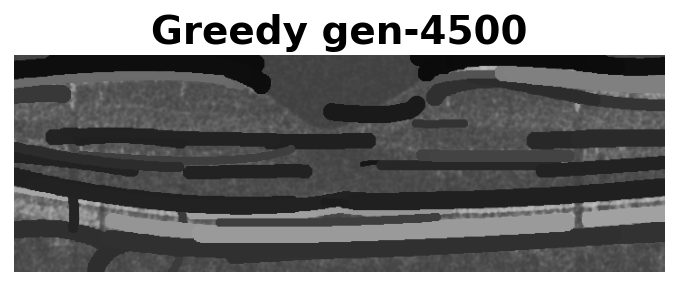

Generation 4501: SSIM = 0.374, Scores = 218 ± 103, [-35, 405], Worms = 102  (took 1.25 sec)
Generation 4502: SSIM = 0.374, Scores = 221 ± 100, [5, 405], Worms = 102  (took 1.18 sec)
Generation 4503: SSIM = 0.374, Scores = 218 ± 102, [-29, 405], Worms = 103  (took 1.31 sec)
Generation 4504: SSIM = 0.374, Scores = 219 ± 102, [-29, 405], Worms = 102  (took 1.23 sec)
Generation 4505: SSIM = 0.374, Scores = 218 ± 103, [-39, 405], Worms = 103  (took 1.30 sec)
Generation 4506: SSIM = 0.374, Scores = 218 ± 103, [-39, 405], Worms = 102  (took 1.23 sec)
Generation 4507: SSIM = 0.374, Scores = 218 ± 102, [-35, 405], Worms = 103  (took 1.27 sec)
Generation 4508: SSIM = 0.374, Scores = 219 ± 103, [-35, 405], Worms = 103  (took 1.20 sec)
Generation 4509: SSIM = 0.374, Scores = 219 ± 103, [-35, 405], Worms = 102  (took 1.18 sec)
Generation 4510: SSIM = 0.374, Scores = 219 ± 102, [-23, 405], Worms = 103  (took 1.27 sec)
Generation 4511: SSIM = 0.374, Scores = 219 ± 102, [-23, 405], Worms = 102  (took 

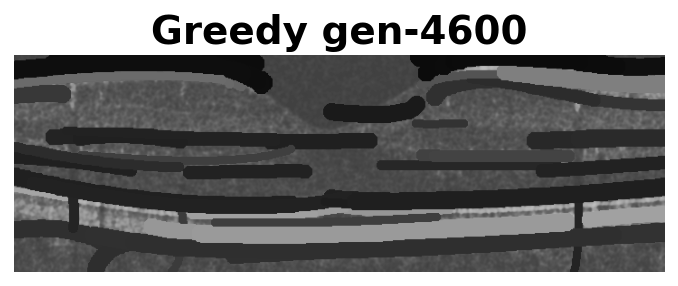

Generation 4601: SSIM = 0.372, Scores = 218 ± 103, [-41, 405], Worms = 103  (took 1.35 sec)
Generation 4602: SSIM = 0.372, Scores = 221 ± 100, [5, 405], Worms = 103  (took 1.15 sec)
Generation 4603: SSIM = 0.372, Scores = 221 ± 100, [5, 405], Worms = 103  (took 1.15 sec)
Generation 4604: SSIM = 0.372, Scores = 219 ± 103, [-38, 405], Worms = 103  (took 1.27 sec)
Generation 4605: SSIM = 0.372, Scores = 219 ± 103, [-35, 405], Worms = 104  (took 1.28 sec)
Generation 4606: SSIM = 0.372, Scores = 219 ± 103, [-35, 405], Worms = 103  (took 1.21 sec)
Generation 4607: SSIM = 0.372, Scores = 219 ± 103, [-40, 405], Worms = 104  (took 1.28 sec)
Generation 4608: SSIM = 0.372, Scores = 219 ± 103, [-40, 405], Worms = 103  (took 1.19 sec)
Generation 4609: SSIM = 0.372, Scores = 221 ± 100, [5, 405], Worms = 103  (took 1.15 sec)
Generation 4610: SSIM = 0.372, Scores = 219 ± 103, [-31, 405], Worms = 103  (took 1.29 sec)
Generation 4611: SSIM = 0.372, Scores = 219 ± 103, [-35, 405], Worms = 104  (took 1.34

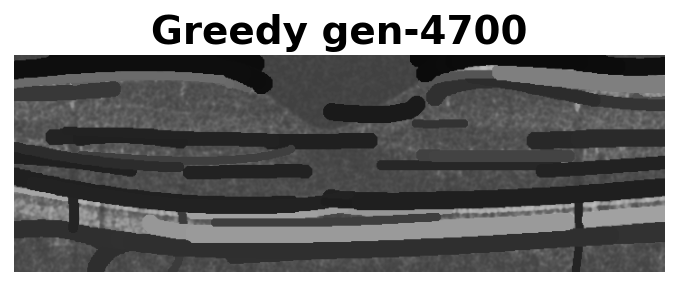

Generation 4701: SSIM = 0.372, Scores = 218 ± 103, [-41, 405], Worms = 106  (took 1.35 sec)
len =  0.0 for [239 521] - [239 521]
Generation 4702: SSIM = 0.372, Scores = 218 ± 103, [-41, 405], Worms = 105  (took 1.23 sec)
Generation 4703: SSIM = 0.373, Scores = 218 ± 103, [-40, 405], Worms = 105  (took 1.30 sec)
Generation 4704: SSIM = 0.373, Scores = 220 ± 100, [5, 405], Worms = 105  (took 1.15 sec)
Generation 4705: SSIM = 0.372, Scores = 218 ± 103, [-39, 405], Worms = 106  (took 1.31 sec)
Generation 4706: SSIM = 0.372, Scores = 218 ± 103, [-39, 405], Worms = 106  (took 1.20 sec)
Generation 4707: SSIM = 0.372, Scores = 218 ± 103, [-39, 405], Worms = 106  (took 1.23 sec)
Generation 4708: SSIM = 0.372, Scores = 218 ± 103, [-39, 405], Worms = 105  (took 1.21 sec)
Generation 4709: SSIM = 0.373, Scores = 221 ± 100, [5, 405], Worms = 105  (took 1.17 sec)
Generation 4710: SSIM = 0.372, Scores = 218 ± 103, [-37, 405], Worms = 105  (took 1.31 sec)
Generation 4711: SSIM = 0.372, Scores = 218 ± 1

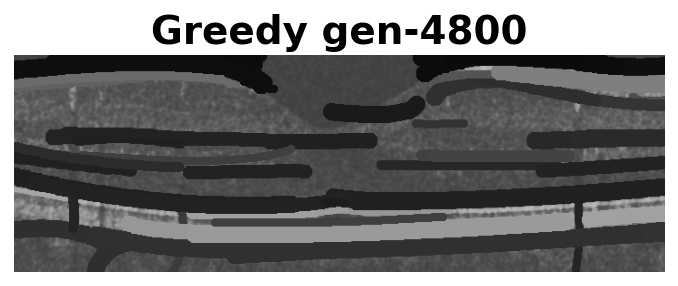

Generation 4801: SSIM = 0.373, Scores = 221 ± 101, [5, 411], Worms = 106  (took 1.26 sec)
Generation 4802: SSIM = 0.374, Scores = 219 ± 103, [-28, 411], Worms = 106  (took 1.37 sec)
Generation 4803: SSIM = 0.373, Scores = 219 ± 103, [-37, 411], Worms = 106  (took 1.40 sec)
Generation 4804: SSIM = 0.373, Scores = 219 ± 103, [-26, 411], Worms = 107  (took 1.39 sec)
Generation 4805: SSIM = 0.373, Scores = 219 ± 103, [-26, 411], Worms = 106  (took 1.30 sec)
Generation 4806: SSIM = 0.373, Scores = 219 ± 103, [-31, 411], Worms = 106  (took 1.36 sec)
Generation 4807: SSIM = 0.373, Scores = 219 ± 103, [-33, 411], Worms = 106  (took 1.37 sec)
Generation 4808: SSIM = 0.373, Scores = 221 ± 100, [5, 411], Worms = 106  (took 1.25 sec)
Generation 4809: SSIM = 0.374, Scores = 219 ± 103, [-22, 411], Worms = 107  (took 1.37 sec)
len =  0.0 for [ 0 97] - [ 0 97]
Generation 4810: SSIM = 0.374, Scores = 219 ± 103, [-22, 411], Worms = 106  (took 1.29 sec)
Generation 4811: SSIM = 0.373, Scores = 219 ± 103, 

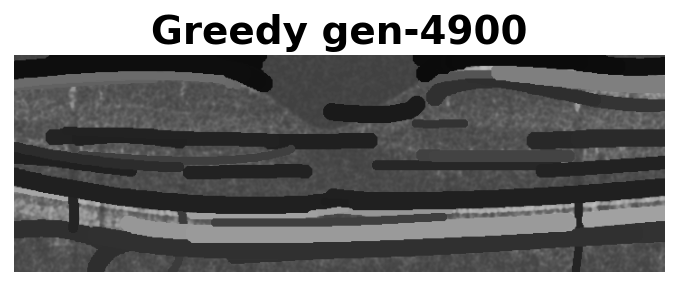

Generation 4901: SSIM = 0.373, Scores = 221 ± 101, [-35, 411], Worms = 109  (took 1.41 sec)
Generation 4902: SSIM = 0.373, Scores = 221 ± 101, [-35, 411], Worms = 109  (took 1.31 sec)
Generation 4903: SSIM = 0.373, Scores = 221 ± 101, [-35, 411], Worms = 109  (took 1.30 sec)
Generation 4904: SSIM = 0.373, Scores = 221 ± 101, [-35, 411], Worms = 109  (took 1.29 sec)
Generation 4905: SSIM = 0.373, Scores = 221 ± 101, [-35, 411], Worms = 109  (took 1.31 sec)
Generation 4906: SSIM = 0.373, Scores = 221 ± 101, [-35, 411], Worms = 108  (took 1.29 sec)
Generation 4907: SSIM = 0.373, Scores = 221 ± 101, [-31, 411], Worms = 109  (took 1.38 sec)
Generation 4908: SSIM = 0.373, Scores = 221 ± 101, [-31, 411], Worms = 108  (took 1.30 sec)
Generation 4909: SSIM = 0.374, Scores = 221 ± 101, [-32, 411], Worms = 109  (took 1.36 sec)
Generation 4910: SSIM = 0.374, Scores = 221 ± 101, [-32, 411], Worms = 109  (took 1.30 sec)
Generation 4911: SSIM = 0.373, Scores = 222 ± 100, [3, 411], Worms = 109  (took 

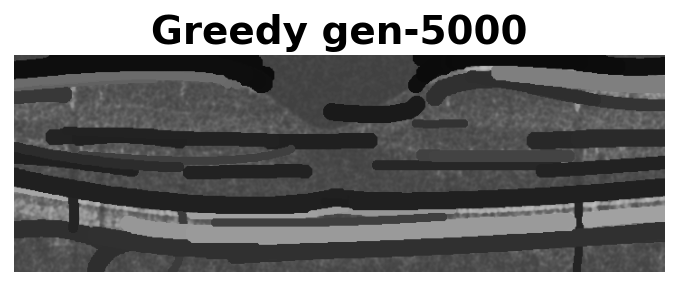

Generation 5001: SSIM = 0.371, Scores = 220 ± 102, [-60, 411], Worms = 113  (took 1.44 sec)
Generation 5002: SSIM = 0.371, Scores = 220 ± 102, [-60, 411], Worms = 112  (took 1.31 sec)
Generation 5003: SSIM = 0.370, Scores = 221 ± 101, [-32, 411], Worms = 112  (took 1.39 sec)
Generation 5004: SSIM = 0.371, Scores = 223 ± 99, [5, 411], Worms = 112  (took 1.25 sec)
Generation 5005: SSIM = 0.371, Scores = 223 ± 99, [5, 411], Worms = 112  (took 1.25 sec)
Generation 5006: SSIM = 0.370, Scores = 221 ± 101, [-28, 411], Worms = 112  (took 1.37 sec)
Generation 5007: SSIM = 0.371, Scores = 223 ± 99, [5, 411], Worms = 112  (took 1.27 sec)
Generation 5008: SSIM = 0.371, Scores = 221 ± 101, [-21, 411], Worms = 113  (took 1.41 sec)
Generation 5009: SSIM = 0.371, Scores = 221 ± 101, [-21, 411], Worms = 112  (took 1.32 sec)
Generation 5010: SSIM = 0.371, Scores = 221 ± 101, [-34, 411], Worms = 113  (took 1.44 sec)
Generation 5011: SSIM = 0.371, Scores = 221 ± 101, [-34, 411], Worms = 112  (took 1.34 se

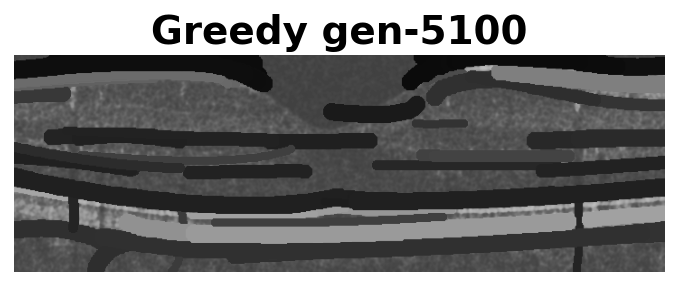

Generation 5101: SSIM = 0.374, Scores = 223 ± 99, [5, 411], Worms = 115  (took 1.30 sec)
Generation 5102: SSIM = 0.374, Scores = 221 ± 101, [-24, 411], Worms = 115  (took 1.42 sec)
Generation 5103: SSIM = 0.374, Scores = 223 ± 99, [5, 411], Worms = 115  (took 1.31 sec)
Generation 5104: SSIM = 0.373, Scores = 221 ± 102, [-48, 411], Worms = 116  (took 1.46 sec)
Generation 5105: SSIM = 0.373, Scores = 221 ± 102, [-48, 411], Worms = 115  (took 1.39 sec)
Generation 5106: SSIM = 0.374, Scores = 224 ± 99, [5, 411], Worms = 115  (took 1.34 sec)
Generation 5107: SSIM = 0.374, Scores = 221 ± 101, [-31, 411], Worms = 116  (took 1.48 sec)
Generation 5108: SSIM = 0.374, Scores = 221 ± 101, [-31, 411], Worms = 115  (took 1.35 sec)
Generation 5109: SSIM = 0.374, Scores = 221 ± 101, [-23, 411], Worms = 116  (took 1.46 sec)
Generation 5110: SSIM = 0.374, Scores = 222 ± 101, [-23, 411], Worms = 116  (took 1.37 sec)
Generation 5111: SSIM = 0.375, Scores = 222 ± 101, [-23, 411], Worms = 116  (took 1.36 se

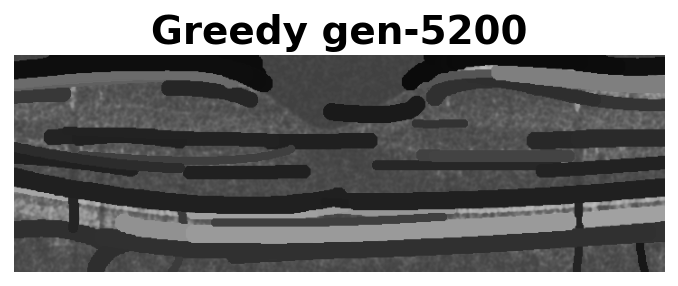

Generation 5201: SSIM = 0.374, Scores = 222 ± 101, [-37, 411], Worms = 116  (took 1.43 sec)
Generation 5202: SSIM = 0.374, Scores = 225 ± 99, [5, 411], Worms = 116  (took 1.37 sec)
Generation 5203: SSIM = 0.373, Scores = 222 ± 101, [-40, 411], Worms = 117  (took 1.49 sec)
Generation 5204: SSIM = 0.373, Scores = 222 ± 101, [-40, 411], Worms = 116  (took 1.39 sec)
Generation 5205: SSIM = 0.373, Scores = 222 ± 101, [-32, 411], Worms = 116  (took 1.47 sec)
Generation 5206: SSIM = 0.373, Scores = 223 ± 101, [-24, 411], Worms = 117  (took 1.45 sec)
Generation 5207: SSIM = 0.374, Scores = 221 ± 102, [-20, 411], Worms = 118  (took 1.52 sec)
Generation 5208: SSIM = 0.374, Scores = 221 ± 102, [4, 411], Worms = 118  (took 1.41 sec)
Generation 5209: SSIM = 0.374, Scores = 219 ± 104, [-36, 411], Worms = 119  (took 1.52 sec)
Generation 5210: SSIM = 0.374, Scores = 219 ± 104, [-36, 411], Worms = 119  (took 1.45 sec)
Generation 5211: SSIM = 0.374, Scores = 219 ± 104, [-36, 411], Worms = 118  (took 1.4

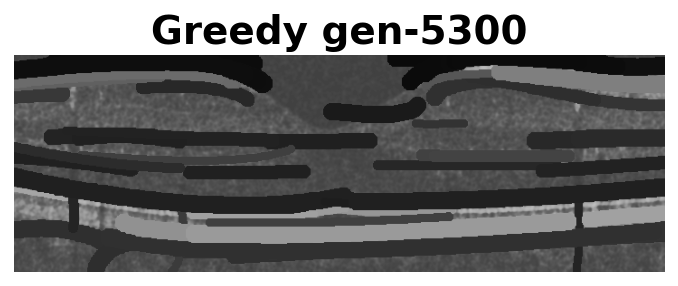

Generation 5301: SSIM = 0.374, Scores = 222 ± 101, [5, 417], Worms = 120  (took 1.43 sec)
Generation 5302: SSIM = 0.374, Scores = 220 ± 103, [-32, 417], Worms = 121  (took 1.53 sec)
Generation 5303: SSIM = 0.374, Scores = 220 ± 103, [-32, 417], Worms = 121  (took 1.47 sec)
Generation 5304: SSIM = 0.374, Scores = 220 ± 103, [-32, 417], Worms = 121  (took 1.46 sec)
Generation 5305: SSIM = 0.374, Scores = 221 ± 103, [-32, 417], Worms = 120  (took 1.46 sec)
Generation 5306: SSIM = 0.374, Scores = 223 ± 100, [5, 417], Worms = 120  (took 1.42 sec)
Generation 5307: SSIM = 0.374, Scores = 221 ± 103, [-30, 417], Worms = 121  (took 1.54 sec)
Generation 5308: SSIM = 0.374, Scores = 221 ± 102, [-30, 417], Worms = 121  (took 1.50 sec)
Generation 5309: SSIM = 0.374, Scores = 221 ± 102, [-30, 417], Worms = 121  (took 1.44 sec)
Generation 5310: SSIM = 0.374, Scores = 221 ± 102, [-30, 417], Worms = 121  (took 1.46 sec)
Generation 5311: SSIM = 0.374, Scores = 221 ± 102, [-30, 417], Worms = 120  (took 1.

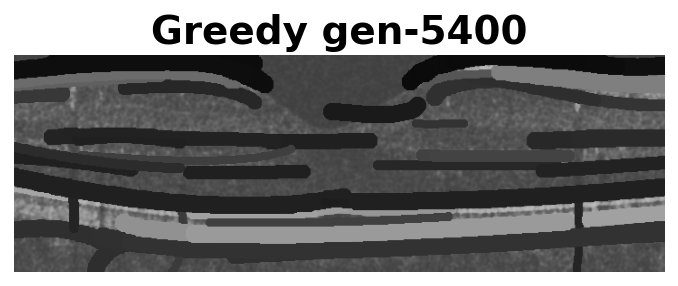

Generation 5401: SSIM = 0.373, Scores = 225 ± 101, [-28, 417], Worms = 120  (took 1.55 sec)
Generation 5402: SSIM = 0.373, Scores = 225 ± 101, [-34, 417], Worms = 121  (took 1.50 sec)
Generation 5403: SSIM = 0.373, Scores = 225 ± 101, [-34, 417], Worms = 120  (took 1.43 sec)
Generation 5404: SSIM = 0.372, Scores = 225 ± 101, [-30, 417], Worms = 120  (took 1.50 sec)
Generation 5405: SSIM = 0.373, Scores = 225 ± 100, [-21, 417], Worms = 120  (took 1.49 sec)
Generation 5406: SSIM = 0.373, Scores = 225 ± 101, [-40, 417], Worms = 120  (took 1.54 sec)
Generation 5407: SSIM = 0.373, Scores = 225 ± 101, [-28, 417], Worms = 121  (took 1.55 sec)
len =  0.0 for [239 538] - [239 538]
Generation 5408: SSIM = 0.373, Scores = 225 ± 101, [-28, 417], Worms = 120  (took 1.44 sec)
Generation 5409: SSIM = 0.373, Scores = 225 ± 100, [-17, 417], Worms = 120  (took 1.55 sec)
Generation 5410: SSIM = 0.372, Scores = 225 ± 101, [-40, 417], Worms = 121  (took 1.51 sec)
Generation 5411: SSIM = 0.373, Scores = 225

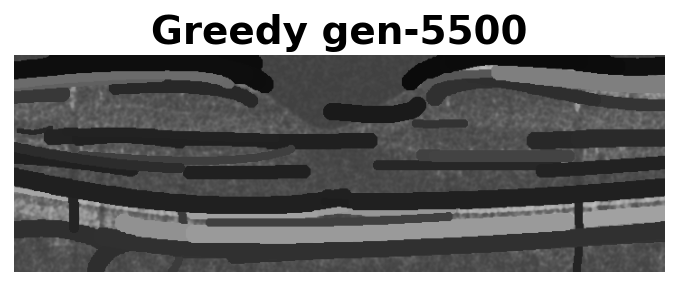

Generation 5501: SSIM = 0.373, Scores = 226 ± 101, [-30, 417], Worms = 121  (took 1.48 sec)
Generation 5502: SSIM = 0.373, Scores = 226 ± 101, [-21, 417], Worms = 121  (took 1.55 sec)
Generation 5503: SSIM = 0.373, Scores = 226 ± 101, [-31, 417], Worms = 121  (took 1.53 sec)
Generation 5504: SSIM = 0.373, Scores = 228 ± 99, [5, 417], Worms = 121  (took 1.37 sec)
Generation 5505: SSIM = 0.373, Scores = 228 ± 99, [5, 417], Worms = 121  (took 1.40 sec)
Generation 5506: SSIM = 0.373, Scores = 228 ± 99, [5, 417], Worms = 121  (took 1.38 sec)
Generation 5507: SSIM = 0.373, Scores = 228 ± 99, [5, 417], Worms = 121  (took 1.40 sec)
Generation 5508: SSIM = 0.373, Scores = 226 ± 101, [-23, 417], Worms = 121  (took 1.54 sec)
Generation 5509: SSIM = 0.373, Scores = 228 ± 99, [5, 417], Worms = 121  (took 1.40 sec)
Generation 5510: SSIM = 0.373, Scores = 226 ± 101, [-28, 417], Worms = 121  (took 1.54 sec)
Generation 5511: SSIM = 0.373, Scores = 226 ± 101, [-35, 417], Worms = 121  (took 1.53 sec)
Gen

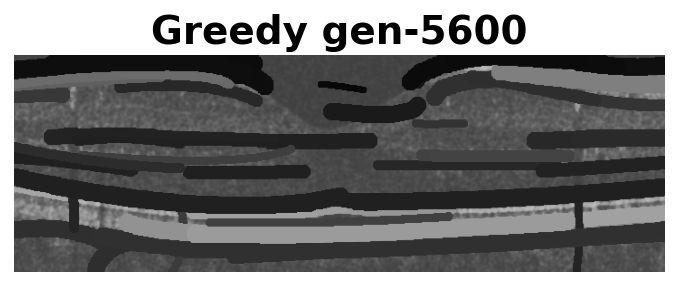

Generation 5601: SSIM = 0.371, Scores = 227 ± 101, [-35, 417], Worms = 122  (took 1.49 sec)
Generation 5602: SSIM = 0.371, Scores = 229 ± 98, [5, 417], Worms = 122  (took 1.38 sec)
Generation 5603: SSIM = 0.372, Scores = 229 ± 98, [5, 417], Worms = 122  (took 1.36 sec)
Generation 5604: SSIM = 0.372, Scores = 229 ± 98, [5, 417], Worms = 122  (took 1.35 sec)
Generation 5605: SSIM = 0.372, Scores = 229 ± 98, [5, 417], Worms = 122  (took 1.40 sec)
Generation 5606: SSIM = 0.371, Scores = 227 ± 101, [-42, 417], Worms = 123  (took 1.51 sec)
Generation 5607: SSIM = 0.371, Scores = 228 ± 101, [-42, 417], Worms = 123  (took 1.46 sec)
Generation 5608: SSIM = 0.371, Scores = 228 ± 101, [-42, 417], Worms = 122  (took 1.40 sec)
Generation 5609: SSIM = 0.371, Scores = 228 ± 100, [-29, 417], Worms = 123  (took 1.54 sec)
Generation 5610: SSIM = 0.372, Scores = 228 ± 100, [-29, 417], Worms = 122  (took 1.46 sec)
Generation 5611: SSIM = 0.371, Scores = 228 ± 100, [-31, 417], Worms = 122  (took 1.55 sec)


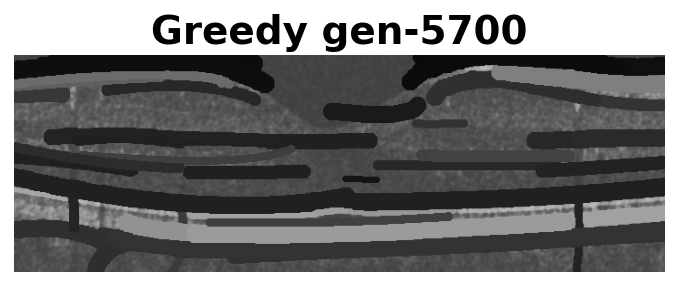

Generation 5701: SSIM = 0.371, Scores = 227 ± 102, [-30, 417], Worms = 123  (took 1.51 sec)
len =  0.0 for [239 498] - [239 498]
Generation 5702: SSIM = 0.372, Scores = 227 ± 102, [-40, 417], Worms = 123  (took 1.58 sec)
Generation 5703: SSIM = 0.372, Scores = 227 ± 102, [-27, 417], Worms = 123  (took 1.55 sec)
len =  0.0 for [239 510] - [239 510]
Generation 5704: SSIM = 0.372, Scores = 227 ± 102, [-42, 417], Worms = 124  (took 1.55 sec)
Generation 5705: SSIM = 0.372, Scores = 227 ± 102, [-42, 417], Worms = 123  (took 1.45 sec)
Generation 5706: SSIM = 0.371, Scores = 227 ± 102, [-45, 417], Worms = 123  (took 1.54 sec)
Generation 5707: SSIM = 0.372, Scores = 229 ± 99, [5, 417], Worms = 123  (took 1.39 sec)
Generation 5708: SSIM = 0.372, Scores = 227 ± 102, [-33, 417], Worms = 123  (took 1.52 sec)
Generation 5709: SSIM = 0.371, Scores = 227 ± 102, [-33, 417], Worms = 124  (took 1.52 sec)
Generation 5710: SSIM = 0.371, Scores = 227 ± 102, [-33, 417], Worms = 124  (took 1.42 sec)
Generatio

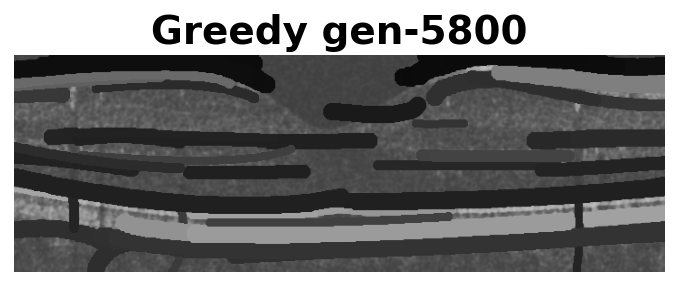

Generation 5801: SSIM = 0.371, Scores = 228 ± 101, [-37, 417], Worms = 125  (took 1.60 sec)
Generation 5802: SSIM = 0.371, Scores = 228 ± 101, [-37, 417], Worms = 124  (took 1.46 sec)
Generation 5803: SSIM = 0.372, Scores = 228 ± 101, [-31, 417], Worms = 125  (took 1.58 sec)
Generation 5804: SSIM = 0.372, Scores = 228 ± 101, [-31, 417], Worms = 124  (took 1.50 sec)
Generation 5805: SSIM = 0.372, Scores = 228 ± 100, [-25, 417], Worms = 124  (took 1.61 sec)
Generation 5806: SSIM = 0.372, Scores = 230 ± 98, [5, 417], Worms = 124  (took 1.41 sec)
Generation 5807: SSIM = 0.372, Scores = 228 ± 101, [-36, 417], Worms = 125  (took 1.56 sec)
Generation 5808: SSIM = 0.372, Scores = 228 ± 101, [-36, 417], Worms = 124  (took 1.50 sec)
Generation 5809: SSIM = 0.372, Scores = 230 ± 98, [5, 417], Worms = 124  (took 1.43 sec)
Generation 5810: SSIM = 0.372, Scores = 228 ± 101, [-36, 417], Worms = 124  (took 1.57 sec)
Generation 5811: SSIM = 0.372, Scores = 228 ± 101, [-36, 417], Worms = 124  (took 1.59

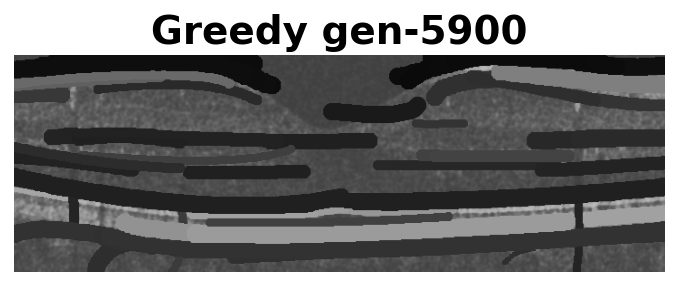

Generation 5901: SSIM = 0.373, Scores = 230 ± 100, [-21, 417], Worms = 124  (took 1.50 sec)
Generation 5902: SSIM = 0.372, Scores = 229 ± 100, [-28, 417], Worms = 125  (took 1.57 sec)
Generation 5903: SSIM = 0.372, Scores = 229 ± 100, [-28, 417], Worms = 124  (took 1.48 sec)
Generation 5904: SSIM = 0.372, Scores = 229 ± 101, [-36, 417], Worms = 124  (took 1.59 sec)
Generation 5905: SSIM = 0.372, Scores = 229 ± 101, [-39, 417], Worms = 124  (took 1.57 sec)
Generation 5906: SSIM = 0.373, Scores = 229 ± 101, [-33, 417], Worms = 125  (took 1.58 sec)
Generation 5907: SSIM = 0.372, Scores = 229 ± 101, [-33, 417], Worms = 124  (took 1.52 sec)
Generation 5908: SSIM = 0.372, Scores = 230 ± 100, [-27, 417], Worms = 124  (took 1.54 sec)
Generation 5909: SSIM = 0.372, Scores = 230 ± 100, [-25, 417], Worms = 124  (took 1.58 sec)
Generation 5910: SSIM = 0.372, Scores = 229 ± 101, [-42, 417], Worms = 124  (took 1.57 sec)
Generation 5911: SSIM = 0.372, Scores = 230 ± 101, [-35, 417], Worms = 125  (too

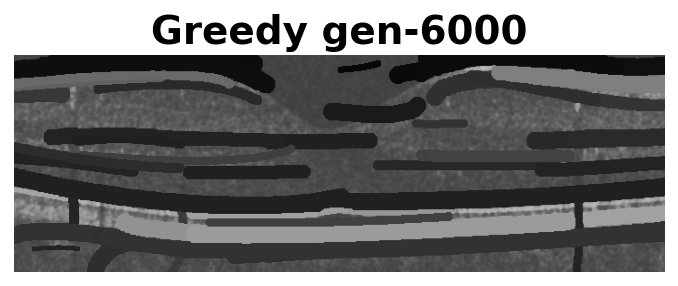

Generation 6001: SSIM = 0.371, Scores = 228 ± 102, [-36, 417], Worms = 126  (took 1.54 sec)
Generation 6002: SSIM = 0.372, Scores = 230 ± 100, [3, 417], Worms = 126  (took 1.49 sec)
Generation 6003: SSIM = 0.371, Scores = 228 ± 102, [-48, 417], Worms = 126  (took 1.62 sec)
Generation 6004: SSIM = 0.372, Scores = 228 ± 102, [-32, 417], Worms = 126  (took 1.58 sec)
Generation 6005: SSIM = 0.372, Scores = 228 ± 102, [-31, 417], Worms = 127  (took 1.63 sec)
Generation 6006: SSIM = 0.372, Scores = 228 ± 102, [-31, 417], Worms = 126  (took 1.53 sec)
Generation 6007: SSIM = 0.372, Scores = 228 ± 102, [-36, 417], Worms = 126  (took 1.63 sec)
Generation 6008: SSIM = 0.372, Scores = 230 ± 100, [3, 417], Worms = 126  (took 1.48 sec)
Generation 6009: SSIM = 0.372, Scores = 231 ± 100, [3, 417], Worms = 126  (took 1.49 sec)
Generation 6010: SSIM = 0.372, Scores = 229 ± 102, [-29, 417], Worms = 127  (took 1.61 sec)
Generation 6011: SSIM = 0.372, Scores = 229 ± 102, [-29, 417], Worms = 126  (took 1.52

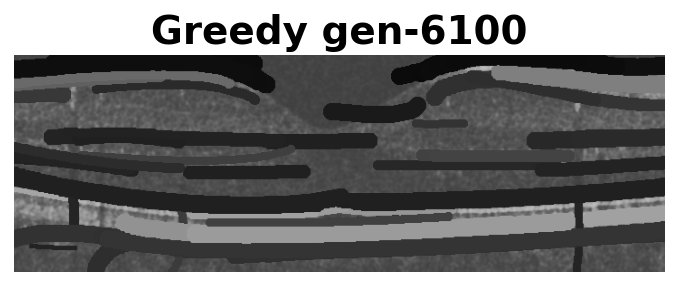

Generation 6101: SSIM = 0.371, Scores = 233 ± 100, [5, 417], Worms = 126  (took 1.53 sec)
Generation 6102: SSIM = 0.371, Scores = 231 ± 102, [-19, 417], Worms = 126  (took 1.64 sec)
Generation 6103: SSIM = 0.371, Scores = 231 ± 102, [-33, 417], Worms = 127  (took 1.65 sec)
Generation 6104: SSIM = 0.371, Scores = 231 ± 102, [-33, 417], Worms = 126  (took 1.55 sec)
Generation 6105: SSIM = 0.371, Scores = 230 ± 103, [-61, 417], Worms = 127  (took 1.66 sec)
Generation 6106: SSIM = 0.371, Scores = 230 ± 103, [-61, 417], Worms = 126  (took 1.49 sec)
Generation 6107: SSIM = 0.371, Scores = 231 ± 102, [-32, 417], Worms = 127  (took 1.57 sec)
Generation 6108: SSIM = 0.371, Scores = 231 ± 102, [-32, 417], Worms = 126  (took 1.53 sec)
Generation 6109: SSIM = 0.372, Scores = 231 ± 102, [-29, 417], Worms = 127  (took 1.62 sec)
Generation 6110: SSIM = 0.371, Scores = 231 ± 102, [-29, 417], Worms = 126  (took 1.50 sec)
Generation 6111: SSIM = 0.371, Scores = 233 ± 100, [5, 417], Worms = 126  (took 1.

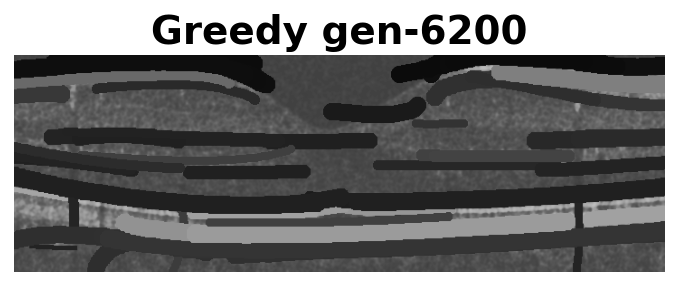

Generation 6201: SSIM = 0.371, Scores = 232 ± 102, [-21, 417], Worms = 126  (took 1.66 sec)
Generation 6202: SSIM = 0.370, Scores = 232 ± 103, [-31, 417], Worms = 126  (took 1.64 sec)
Generation 6203: SSIM = 0.371, Scores = 234 ± 100, [5, 417], Worms = 126  (took 1.50 sec)
Generation 6204: SSIM = 0.371, Scores = 232 ± 103, [-29, 417], Worms = 126  (took 1.63 sec)
Generation 6205: SSIM = 0.371, Scores = 232 ± 102, [-25, 417], Worms = 127  (took 1.64 sec)
Generation 6206: SSIM = 0.371, Scores = 232 ± 102, [-25, 417], Worms = 126  (took 1.55 sec)
Generation 6207: SSIM = 0.371, Scores = 232 ± 102, [-24, 417], Worms = 126  (took 1.62 sec)
Generation 6208: SSIM = 0.371, Scores = 232 ± 103, [-29, 417], Worms = 126  (took 1.63 sec)
Generation 6209: SSIM = 0.370, Scores = 232 ± 103, [-39, 417], Worms = 126  (took 1.65 sec)
Generation 6210: SSIM = 0.370, Scores = 232 ± 103, [-45, 417], Worms = 127  (took 1.65 sec)
Generation 6211: SSIM = 0.370, Scores = 232 ± 103, [-45, 417], Worms = 126  (took 

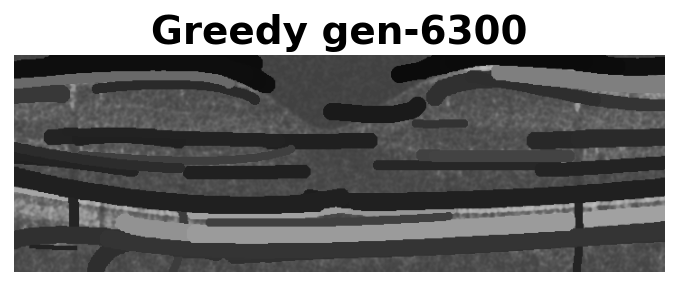

Generation 6301: SSIM = 0.371, Scores = 232 ± 102, [-13, 417], Worms = 128  (took 1.58 sec)
Generation 6302: SSIM = 0.371, Scores = 231 ± 103, [-42, 417], Worms = 128  (took 1.59 sec)
Generation 6303: SSIM = 0.370, Scores = 231 ± 103, [-44, 417], Worms = 128  (took 1.59 sec)
Generation 6304: SSIM = 0.371, Scores = 231 ± 102, [-35, 417], Worms = 129  (took 1.67 sec)
Generation 6305: SSIM = 0.371, Scores = 231 ± 102, [-35, 417], Worms = 128  (took 1.57 sec)
Generation 6306: SSIM = 0.371, Scores = 231 ± 103, [-40, 417], Worms = 129  (took 1.67 sec)
Generation 6307: SSIM = 0.371, Scores = 231 ± 102, [-40, 417], Worms = 128  (took 1.54 sec)
Generation 6308: SSIM = 0.372, Scores = 232 ± 102, [-16, 417], Worms = 129  (took 1.61 sec)
Generation 6309: SSIM = 0.372, Scores = 232 ± 102, [-16, 417], Worms = 128  (took 1.54 sec)
Generation 6310: SSIM = 0.371, Scores = 231 ± 102, [-33, 417], Worms = 128  (took 1.66 sec)
Generation 6311: SSIM = 0.371, Scores = 232 ± 102, [-26, 417], Worms = 129  (too

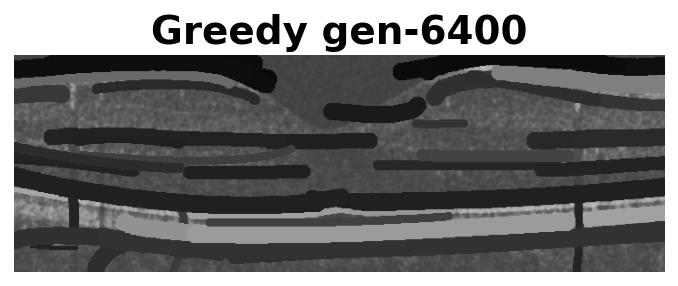

Generation 6401: SSIM = 0.371, Scores = 231 ± 102, [-17, 417], Worms = 129  (took 1.70 sec)
Generation 6402: SSIM = 0.371, Scores = 231 ± 103, [-47, 417], Worms = 129  (took 1.64 sec)
Generation 6403: SSIM = 0.371, Scores = 231 ± 103, [-31, 417], Worms = 130  (took 1.66 sec)
Generation 6404: SSIM = 0.371, Scores = 231 ± 103, [-31, 417], Worms = 129  (took 1.59 sec)
Generation 6405: SSIM = 0.371, Scores = 231 ± 103, [-36, 417], Worms = 130  (took 1.66 sec)
Generation 6406: SSIM = 0.371, Scores = 231 ± 103, [-36, 417], Worms = 129  (took 1.57 sec)
Generation 6407: SSIM = 0.371, Scores = 231 ± 103, [-36, 417], Worms = 129  (took 1.65 sec)
Generation 6408: SSIM = 0.371, Scores = 231 ± 103, [-31, 417], Worms = 129  (took 1.65 sec)
Generation 6409: SSIM = 0.371, Scores = 231 ± 102, [-27, 417], Worms = 130  (took 1.65 sec)
Generation 6410: SSIM = 0.371, Scores = 231 ± 102, [-27, 417], Worms = 130  (took 1.55 sec)
Generation 6411: SSIM = 0.371, Scores = 231 ± 102, [-27, 417], Worms = 129  (too

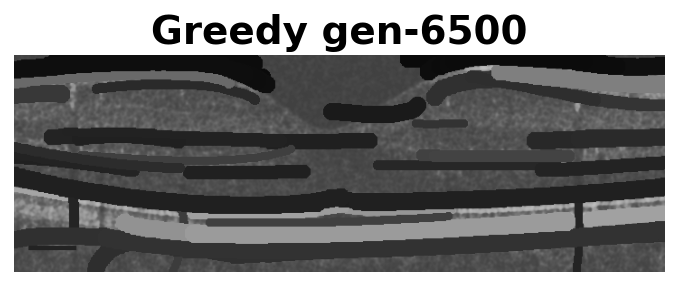

Generation 6501: SSIM = 0.371, Scores = 232 ± 102, [-32, 417], Worms = 130  (took 1.65 sec)
Generation 6502: SSIM = 0.371, Scores = 232 ± 102, [-32, 417], Worms = 129  (took 1.53 sec)
Generation 6503: SSIM = 0.371, Scores = 232 ± 103, [-40, 417], Worms = 129  (took 1.63 sec)
Generation 6504: SSIM = 0.371, Scores = 232 ± 102, [-34, 417], Worms = 129  (took 1.61 sec)
Generation 6505: SSIM = 0.371, Scores = 232 ± 102, [-30, 417], Worms = 129  (took 1.63 sec)
Generation 6506: SSIM = 0.371, Scores = 232 ± 103, [-40, 417], Worms = 129  (took 1.63 sec)
Generation 6507: SSIM = 0.371, Scores = 232 ± 102, [-32, 417], Worms = 129  (took 1.62 sec)
Generation 6508: SSIM = 0.371, Scores = 232 ± 102, [-32, 417], Worms = 130  (took 1.61 sec)
Generation 6509: SSIM = 0.371, Scores = 232 ± 102, [-32, 417], Worms = 129  (took 1.57 sec)
Generation 6510: SSIM = 0.371, Scores = 232 ± 103, [-43, 417], Worms = 129  (took 1.62 sec)
Generation 6511: SSIM = 0.371, Scores = 232 ± 103, [-41, 417], Worms = 129  (too

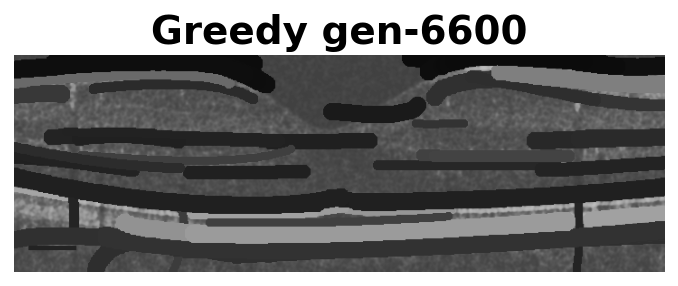

Generation 6601: SSIM = 0.371, Scores = 235 ± 100, [5, 417], Worms = 129  (took 1.52 sec)
Generation 6602: SSIM = 0.371, Scores = 235 ± 100, [5, 417], Worms = 129  (took 1.50 sec)
Generation 6603: SSIM = 0.370, Scores = 233 ± 102, [-33, 417], Worms = 130  (took 1.70 sec)
Generation 6604: SSIM = 0.370, Scores = 233 ± 102, [-33, 417], Worms = 129  (took 1.59 sec)
Generation 6605: SSIM = 0.370, Scores = 233 ± 102, [-36, 417], Worms = 130  (took 1.64 sec)
Generation 6606: SSIM = 0.371, Scores = 233 ± 102, [-36, 417], Worms = 130  (took 1.54 sec)
len =  0.0 for [239 525] - [239 525]
Generation 6607: SSIM = 0.371, Scores = 233 ± 102, [-36, 417], Worms = 129  (took 1.53 sec)
Generation 6608: SSIM = 0.371, Scores = 235 ± 100, [5, 417], Worms = 129  (took 1.53 sec)
Generation 6609: SSIM = 0.371, Scores = 233 ± 102, [-34, 417], Worms = 129  (took 1.66 sec)
Generation 6610: SSIM = 0.370, Scores = 233 ± 102, [-39, 417], Worms = 129  (took 1.67 sec)
Generation 6611: SSIM = 0.371, Scores = 233 ± 102

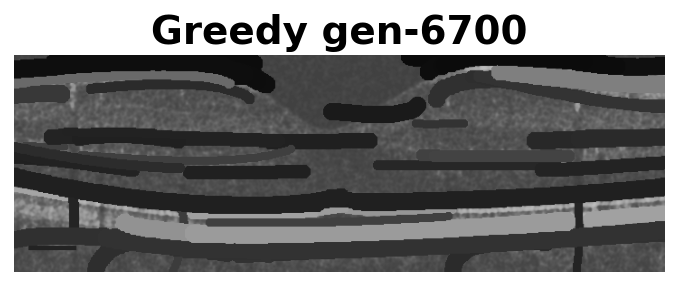

Generation 6701: SSIM = 0.372, Scores = 231 ± 103, [-27, 417], Worms = 131  (took 1.71 sec)
Generation 6702: SSIM = 0.371, Scores = 231 ± 104, [-40, 417], Worms = 131  (took 1.66 sec)
Generation 6703: SSIM = 0.371, Scores = 231 ± 103, [-25, 417], Worms = 131  (took 1.62 sec)
Generation 6704: SSIM = 0.371, Scores = 233 ± 101, [5, 417], Worms = 131  (took 1.48 sec)
Generation 6705: SSIM = 0.370, Scores = 231 ± 104, [-38, 417], Worms = 131  (took 1.64 sec)
Generation 6706: SSIM = 0.371, Scores = 233 ± 101, [5, 417], Worms = 131  (took 1.54 sec)
Generation 6707: SSIM = 0.371, Scores = 231 ± 103, [-29, 417], Worms = 131  (took 1.67 sec)
Generation 6708: SSIM = 0.371, Scores = 231 ± 103, [-33, 417], Worms = 131  (took 1.72 sec)
Generation 6709: SSIM = 0.371, Scores = 231 ± 103, [-19, 417], Worms = 132  (took 1.72 sec)
Generation 6710: SSIM = 0.371, Scores = 231 ± 103, [-19, 417], Worms = 131  (took 1.61 sec)
Generation 6711: SSIM = 0.371, Scores = 231 ± 103, [-26, 417], Worms = 131  (took 1.

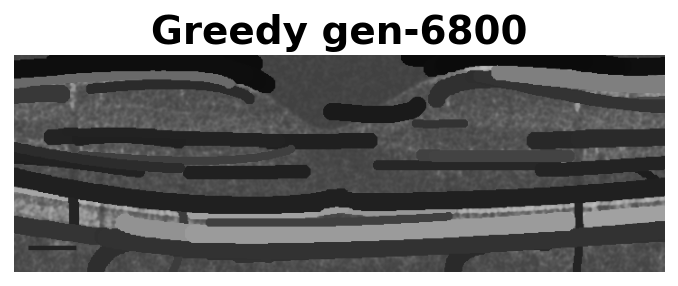

Generation 6801: SSIM = 0.371, Scores = 231 ± 103, [-34, 417], Worms = 133  (took 1.63 sec)
Generation 6802: SSIM = 0.371, Scores = 231 ± 103, [-34, 417], Worms = 132  (took 1.63 sec)
Generation 6803: SSIM = 0.370, Scores = 231 ± 103, [-33, 417], Worms = 133  (took 1.71 sec)
Generation 6804: SSIM = 0.370, Scores = 231 ± 103, [-33, 417], Worms = 132  (took 1.62 sec)
Generation 6805: SSIM = 0.370, Scores = 231 ± 103, [-40, 417], Worms = 132  (took 1.75 sec)
Generation 6806: SSIM = 0.371, Scores = 231 ± 104, [-51, 417], Worms = 133  (took 1.70 sec)
Generation 6807: SSIM = 0.371, Scores = 232 ± 103, [5, 417], Worms = 133  (took 1.62 sec)
Generation 6808: SSIM = 0.371, Scores = 232 ± 102, [5, 417], Worms = 133  (took 1.59 sec)
Generation 6809: SSIM = 0.371, Scores = 230 ± 105, [-41, 417], Worms = 134  (took 1.77 sec)
Generation 6810: SSIM = 0.371, Scores = 230 ± 104, [-41, 417], Worms = 134  (took 1.65 sec)
Generation 6811: SSIM = 0.371, Scores = 230 ± 104, [-41, 417], Worms = 133  (took 1.

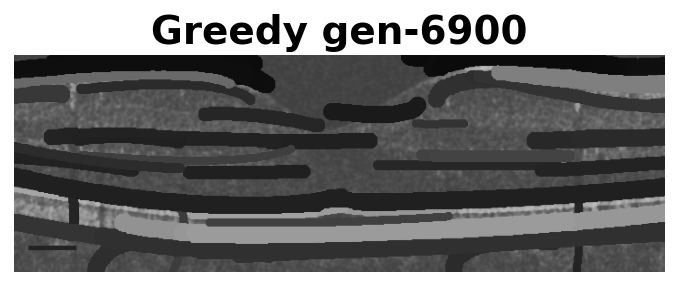

Generation 6901: SSIM = 0.370, Scores = 233 ± 102, [5, 417], Worms = 135  (took 1.66 sec)
Generation 6902: SSIM = 0.369, Scores = 231 ± 104, [-37, 417], Worms = 136  (took 1.77 sec)
Generation 6903: SSIM = 0.369, Scores = 231 ± 104, [-37, 417], Worms = 135  (took 1.65 sec)
Generation 6904: SSIM = 0.370, Scores = 231 ± 104, [-58, 417], Worms = 136  (took 1.75 sec)
Generation 6905: SSIM = 0.370, Scores = 231 ± 104, [-58, 417], Worms = 135  (took 1.65 sec)
Generation 6906: SSIM = 0.369, Scores = 231 ± 104, [-35, 417], Worms = 135  (took 1.79 sec)
Generation 6907: SSIM = 0.369, Scores = 231 ± 104, [-31, 417], Worms = 135  (took 1.74 sec)
Generation 6908: SSIM = 0.370, Scores = 231 ± 104, [-49, 417], Worms = 136  (took 1.76 sec)
Generation 6909: SSIM = 0.370, Scores = 231 ± 104, [-49, 417], Worms = 135  (took 1.64 sec)
Generation 6910: SSIM = 0.369, Scores = 231 ± 104, [-34, 417], Worms = 135  (took 1.74 sec)
Generation 6911: SSIM = 0.369, Scores = 231 ± 104, [-28, 417], Worms = 136  (took 

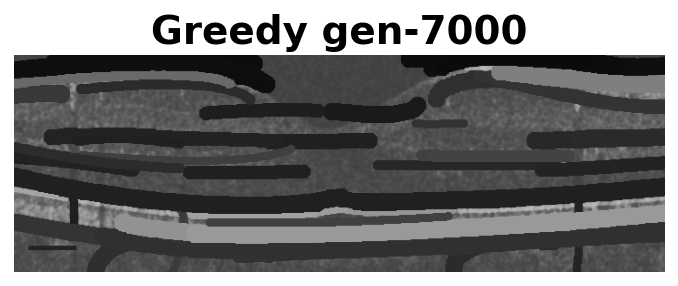

Generation 7001: SSIM = 0.370, Scores = 232 ± 104, [-38, 417], Worms = 136  (took 1.81 sec)
len =  0.0 for [239 507] - [239 507]
Generation 7002: SSIM = 0.371, Scores = 232 ± 103, [-29, 417], Worms = 137  (took 1.79 sec)
Generation 7003: SSIM = 0.371, Scores = 232 ± 103, [-29, 417], Worms = 137  (took 1.69 sec)
Generation 7004: SSIM = 0.371, Scores = 232 ± 103, [-29, 417], Worms = 136  (took 1.67 sec)
Generation 7005: SSIM = 0.370, Scores = 232 ± 104, [-37, 417], Worms = 136  (took 1.78 sec)
Generation 7006: SSIM = 0.371, Scores = 232 ± 104, [-38, 417], Worms = 136  (took 1.77 sec)
Generation 7007: SSIM = 0.371, Scores = 232 ± 103, [-30, 417], Worms = 136  (took 1.76 sec)
Generation 7008: SSIM = 0.371, Scores = 234 ± 101, [5, 417], Worms = 136  (took 1.62 sec)
Generation 7009: SSIM = 0.371, Scores = 232 ± 104, [-44, 417], Worms = 136  (took 1.78 sec)
Generation 7010: SSIM = 0.371, Scores = 232 ± 103, [-25, 417], Worms = 137  (took 1.79 sec)
Generation 7011: SSIM = 0.371, Scores = 232 ±

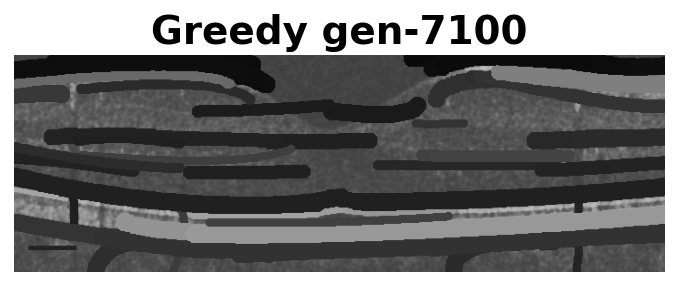

Generation 7101: SSIM = 0.370, Scores = 232 ± 104, [-32, 417], Worms = 137  (took 1.83 sec)
Generation 7102: SSIM = 0.370, Scores = 232 ± 104, [-32, 417], Worms = 136  (took 1.68 sec)
Generation 7103: SSIM = 0.371, Scores = 232 ± 104, [-35, 417], Worms = 136  (took 1.74 sec)
Generation 7104: SSIM = 0.370, Scores = 232 ± 104, [-34, 417], Worms = 136  (took 1.80 sec)
Generation 7105: SSIM = 0.371, Scores = 232 ± 103, [-31, 417], Worms = 136  (took 1.77 sec)
Generation 7106: SSIM = 0.370, Scores = 232 ± 104, [-31, 417], Worms = 137  (took 1.79 sec)
Generation 7107: SSIM = 0.370, Scores = 232 ± 104, [-31, 417], Worms = 136  (took 1.71 sec)
Generation 7108: SSIM = 0.371, Scores = 234 ± 101, [5, 417], Worms = 136  (took 1.62 sec)
Generation 7109: SSIM = 0.371, Scores = 232 ± 103, [-27, 417], Worms = 137  (took 1.78 sec)
Generation 7110: SSIM = 0.371, Scores = 232 ± 103, [-27, 417], Worms = 136  (took 1.73 sec)
Generation 7111: SSIM = 0.371, Scores = 232 ± 103, [-27, 417], Worms = 136  (took 

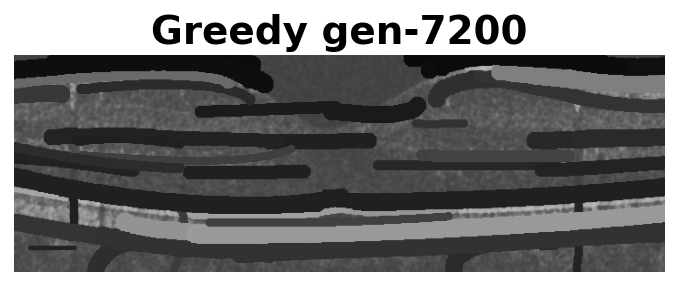

Generation 7201: SSIM = 0.371, Scores = 233 ± 103, [-27, 417], Worms = 136  (took 1.79 sec)
Generation 7202: SSIM = 0.371, Scores = 233 ± 104, [-30, 417], Worms = 136  (took 1.75 sec)
Generation 7203: SSIM = 0.370, Scores = 233 ± 104, [-39, 417], Worms = 136  (took 1.74 sec)
Generation 7204: SSIM = 0.370, Scores = 233 ± 104, [-45, 417], Worms = 136  (took 1.74 sec)
Generation 7205: SSIM = 0.371, Scores = 233 ± 104, [-38, 417], Worms = 136  (took 1.72 sec)
Generation 7206: SSIM = 0.371, Scores = 233 ± 104, [-31, 417], Worms = 136  (took 1.73 sec)
Generation 7207: SSIM = 0.371, Scores = 233 ± 104, [-38, 417], Worms = 136  (took 1.70 sec)
Generation 7208: SSIM = 0.371, Scores = 233 ± 104, [-40, 417], Worms = 136  (took 1.72 sec)
Generation 7209: SSIM = 0.371, Scores = 233 ± 104, [-60, 417], Worms = 137  (took 1.74 sec)
Generation 7210: SSIM = 0.371, Scores = 233 ± 104, [-60, 417], Worms = 136  (took 1.64 sec)
Generation 7211: SSIM = 0.371, Scores = 233 ± 104, [-31, 417], Worms = 136  (too

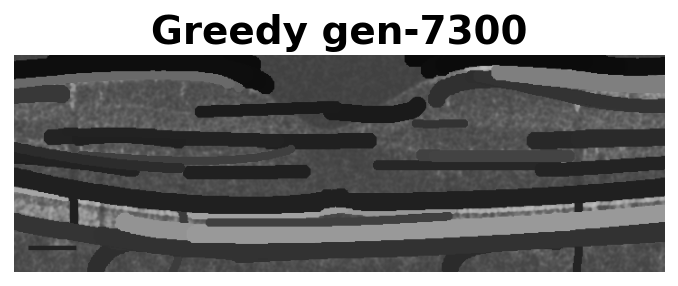

Generation 7301: SSIM = 0.371, Scores = 233 ± 103, [-34, 417], Worms = 136  (took 1.79 sec)
Generation 7302: SSIM = 0.371, Scores = 233 ± 103, [-36, 417], Worms = 136  (took 1.78 sec)
Generation 7303: SSIM = 0.372, Scores = 233 ± 103, [-37, 417], Worms = 136  (took 1.78 sec)
len =  0.0 for [239 512] - [239 512]
Generation 7304: SSIM = 0.372, Scores = 233 ± 103, [-34, 417], Worms = 136  (took 1.78 sec)
Generation 7305: SSIM = 0.371, Scores = 233 ± 104, [-42, 417], Worms = 137  (took 1.80 sec)
Generation 7306: SSIM = 0.371, Scores = 233 ± 104, [-42, 417], Worms = 136  (took 1.72 sec)
Generation 7307: SSIM = 0.372, Scores = 233 ± 103, [-33, 417], Worms = 136  (took 1.81 sec)
Generation 7308: SSIM = 0.371, Scores = 233 ± 103, [-32, 417], Worms = 136  (took 1.79 sec)
Generation 7309: SSIM = 0.372, Scores = 235 ± 101, [5, 417], Worms = 136  (took 1.62 sec)
Generation 7310: SSIM = 0.372, Scores = 234 ± 103, [-23, 417], Worms = 136  (took 1.83 sec)
Generation 7311: SSIM = 0.372, Scores = 233 ±

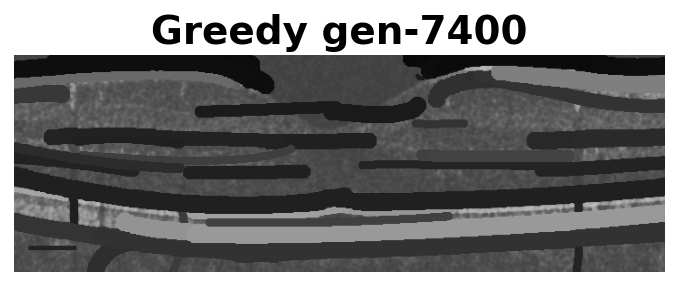

Generation 7401: SSIM = 0.372, Scores = 232 ± 104, [-38, 417], Worms = 138  (took 1.82 sec)
Generation 7402: SSIM = 0.372, Scores = 232 ± 104, [-29, 417], Worms = 138  (took 1.78 sec)
Generation 7403: SSIM = 0.372, Scores = 232 ± 104, [-35, 417], Worms = 138  (took 1.79 sec)
Generation 7404: SSIM = 0.372, Scores = 232 ± 104, [-29, 417], Worms = 139  (took 1.84 sec)
Generation 7405: SSIM = 0.372, Scores = 232 ± 104, [-29, 417], Worms = 138  (took 1.72 sec)
len =  0.0 for [239 504] - [239 504]
Generation 7406: SSIM = 0.372, Scores = 232 ± 104, [-31, 417], Worms = 139  (took 1.85 sec)
Generation 7407: SSIM = 0.372, Scores = 232 ± 104, [-31, 417], Worms = 138  (took 1.74 sec)
Generation 7408: SSIM = 0.372, Scores = 232 ± 104, [-32, 417], Worms = 138  (took 1.83 sec)
Generation 7409: SSIM = 0.372, Scores = 234 ± 102, [5, 417], Worms = 138  (took 1.67 sec)
Generation 7410: SSIM = 0.371, Scores = 232 ± 104, [-37, 417], Worms = 139  (took 1.84 sec)
Generation 7411: SSIM = 0.371, Scores = 232 ±

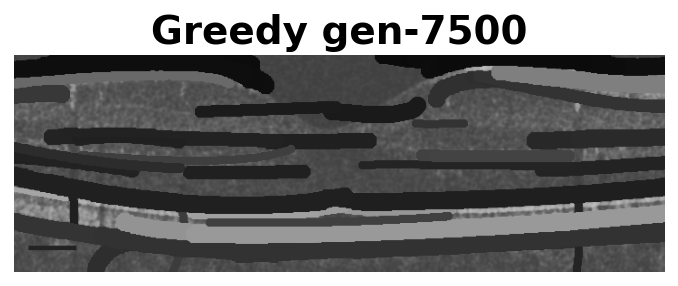

Generation 7501: SSIM = 0.372, Scores = 234 ± 103, [-40, 417], Worms = 140  (took 1.85 sec)
Generation 7502: SSIM = 0.372, Scores = 234 ± 103, [-40, 417], Worms = 139  (took 1.67 sec)
Generation 7503: SSIM = 0.373, Scores = 234 ± 102, [-32, 417], Worms = 140  (took 1.79 sec)
Generation 7504: SSIM = 0.373, Scores = 234 ± 102, [-32, 417], Worms = 139  (took 1.70 sec)
Generation 7505: SSIM = 0.373, Scores = 234 ± 103, [-46, 417], Worms = 140  (took 1.79 sec)
Generation 7506: SSIM = 0.373, Scores = 234 ± 103, [-46, 417], Worms = 139  (took 1.71 sec)
Generation 7507: SSIM = 0.373, Scores = 234 ± 102, [-27, 417], Worms = 139  (took 1.82 sec)
Generation 7508: SSIM = 0.373, Scores = 234 ± 102, [-29, 417], Worms = 139  (took 1.83 sec)
Generation 7509: SSIM = 0.373, Scores = 234 ± 102, [-28, 417], Worms = 140  (took 1.83 sec)
Generation 7510: SSIM = 0.373, Scores = 234 ± 102, [-28, 417], Worms = 139  (took 1.71 sec)
Generation 7511: SSIM = 0.373, Scores = 236 ± 100, [5, 417], Worms = 139  (took 

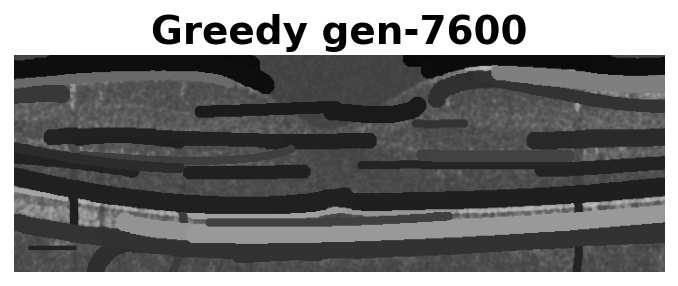

Generation 7601: SSIM = 0.371, Scores = 235 ± 102, [-37, 417], Worms = 139  (took 1.87 sec)
len =  0.0 for [239 499] - [239 499]
Generation 7602: SSIM = 0.372, Scores = 235 ± 102, [-30, 417], Worms = 139  (took 1.86 sec)
Generation 7603: SSIM = 0.372, Scores = 235 ± 103, [-42, 417], Worms = 139  (took 1.81 sec)
Generation 7604: SSIM = 0.372, Scores = 235 ± 102, [-33, 417], Worms = 140  (took 1.82 sec)
Generation 7605: SSIM = 0.372, Scores = 235 ± 102, [-33, 417], Worms = 139  (took 1.76 sec)
Generation 7606: SSIM = 0.372, Scores = 235 ± 102, [-30, 417], Worms = 140  (took 1.83 sec)
Generation 7607: SSIM = 0.372, Scores = 235 ± 102, [-30, 417], Worms = 140  (took 1.71 sec)
Generation 7608: SSIM = 0.372, Scores = 235 ± 102, [-30, 417], Worms = 139  (took 1.76 sec)
Generation 7609: SSIM = 0.372, Scores = 237 ± 100, [5, 417], Worms = 139  (took 1.66 sec)
Generation 7610: SSIM = 0.372, Scores = 235 ± 103, [-47, 417], Worms = 140  (took 1.84 sec)
Generation 7611: SSIM = 0.372, Scores = 235 ±

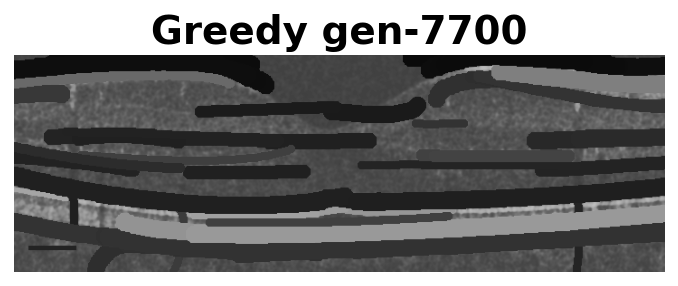

Generation 7701: SSIM = 0.373, Scores = 234 ± 104, [-72, 417], Worms = 141  (took 1.87 sec)
Generation 7702: SSIM = 0.373, Scores = 235 ± 104, [-38, 417], Worms = 141  (took 1.76 sec)
Generation 7703: SSIM = 0.373, Scores = 235 ± 104, [-38, 417], Worms = 140  (took 1.72 sec)
Generation 7704: SSIM = 0.373, Scores = 235 ± 103, [-29, 417], Worms = 141  (took 1.84 sec)
Generation 7705: SSIM = 0.373, Scores = 235 ± 103, [-29, 417], Worms = 140  (took 1.71 sec)
Generation 7706: SSIM = 0.373, Scores = 235 ± 103, [-26, 417], Worms = 141  (took 1.84 sec)
Generation 7707: SSIM = 0.372, Scores = 235 ± 103, [-26, 417], Worms = 141  (took 1.71 sec)
Generation 7708: SSIM = 0.372, Scores = 235 ± 103, [-26, 417], Worms = 141  (took 1.70 sec)
Generation 7709: SSIM = 0.372, Scores = 235 ± 103, [-26, 417], Worms = 140  (took 1.78 sec)
Generation 7710: SSIM = 0.372, Scores = 235 ± 103, [-36, 417], Worms = 140  (took 1.81 sec)
Generation 7711: SSIM = 0.372, Scores = 237 ± 101, [5, 417], Worms = 140  (took 

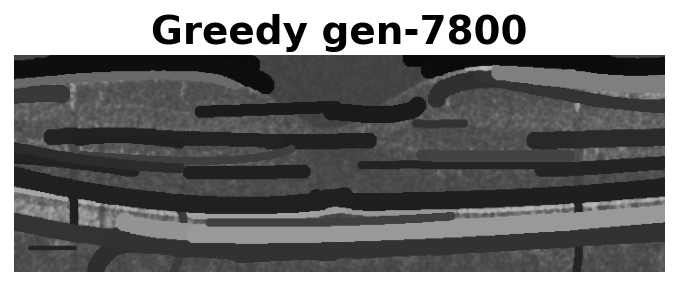

Generation 7801: SSIM = 0.372, Scores = 237 ± 103, [-31, 417], Worms = 140  (took 1.85 sec)
Generation 7802: SSIM = 0.372, Scores = 239 ± 101, [5, 417], Worms = 140  (took 1.70 sec)
Generation 7803: SSIM = 0.372, Scores = 237 ± 103, [-38, 417], Worms = 141  (took 1.86 sec)
Generation 7804: SSIM = 0.372, Scores = 237 ± 103, [-38, 417], Worms = 140  (took 1.77 sec)
Generation 7805: SSIM = 0.372, Scores = 237 ± 102, [-18, 417], Worms = 141  (took 1.83 sec)
Generation 7806: SSIM = 0.372, Scores = 235 ± 104, [-38, 417], Worms = 142  (took 1.90 sec)
Generation 7807: SSIM = 0.372, Scores = 235 ± 104, [-38, 417], Worms = 142  (took 1.81 sec)
Generation 7808: SSIM = 0.372, Scores = 235 ± 104, [-38, 417], Worms = 141  (took 1.79 sec)
Generation 7809: SSIM = 0.372, Scores = 235 ± 104, [-35, 417], Worms = 142  (took 1.87 sec)
Generation 7810: SSIM = 0.372, Scores = 235 ± 104, [-35, 417], Worms = 141  (took 1.75 sec)
Generation 7811: SSIM = 0.371, Scores = 235 ± 104, [-31, 417], Worms = 142  (took 

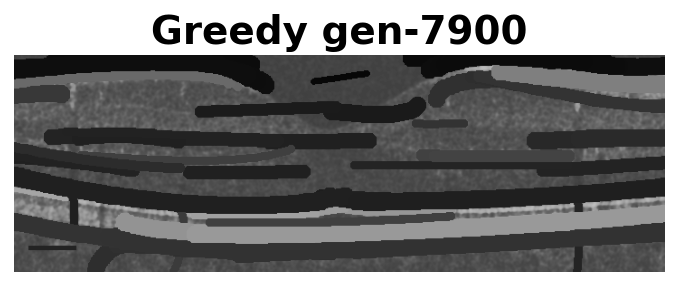

Generation 7901: SSIM = 0.372, Scores = 236 ± 104, [-35, 417], Worms = 142  (took 1.75 sec)
Generation 7902: SSIM = 0.372, Scores = 236 ± 104, [-35, 417], Worms = 142  (took 1.81 sec)
Generation 7903: SSIM = 0.372, Scores = 236 ± 104, [-51, 417], Worms = 143  (took 1.81 sec)
Generation 7904: SSIM = 0.372, Scores = 236 ± 104, [-51, 417], Worms = 142  (took 1.71 sec)
Generation 7905: SSIM = 0.372, Scores = 236 ± 103, [-26, 417], Worms = 142  (took 1.82 sec)
Generation 7906: SSIM = 0.372, Scores = 236 ± 104, [-36, 417], Worms = 143  (took 1.82 sec)
Generation 7907: SSIM = 0.372, Scores = 236 ± 104, [-36, 417], Worms = 143  (took 1.75 sec)
Generation 7908: SSIM = 0.372, Scores = 236 ± 104, [-36, 417], Worms = 143  (took 1.73 sec)
Generation 7909: SSIM = 0.372, Scores = 236 ± 104, [-36, 417], Worms = 142  (took 1.74 sec)
Generation 7910: SSIM = 0.372, Scores = 236 ± 104, [-41, 417], Worms = 142  (took 1.86 sec)
Generation 7911: SSIM = 0.372, Scores = 238 ± 101, [5, 417], Worms = 142  (took 

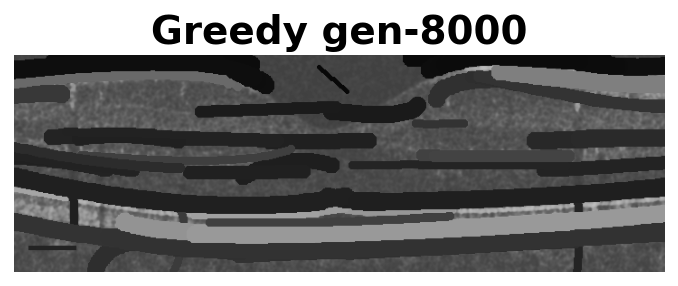

Generation 8001: SSIM = 0.371, Scores = 236 ± 104, [-43, 417], Worms = 145  (took 1.86 sec)
Generation 8002: SSIM = 0.371, Scores = 236 ± 104, [-43, 417], Worms = 144  (took 1.80 sec)
Generation 8003: SSIM = 0.372, Scores = 236 ± 104, [-35, 417], Worms = 145  (took 1.90 sec)
Generation 8004: SSIM = 0.372, Scores = 236 ± 104, [-35, 417], Worms = 144  (took 1.80 sec)
Generation 8005: SSIM = 0.371, Scores = 236 ± 104, [-34, 417], Worms = 145  (took 1.98 sec)
Generation 8006: SSIM = 0.371, Scores = 236 ± 104, [-34, 417], Worms = 145  (took 1.88 sec)
Generation 8007: SSIM = 0.371, Scores = 236 ± 104, [-34, 417], Worms = 144  (took 1.85 sec)
Generation 8008: SSIM = 0.371, Scores = 236 ± 104, [-39, 417], Worms = 145  (took 1.96 sec)
Generation 8009: SSIM = 0.371, Scores = 236 ± 104, [-39, 417], Worms = 144  (took 1.84 sec)
Generation 8010: SSIM = 0.372, Scores = 236 ± 103, [-31, 417], Worms = 145  (took 1.94 sec)
Generation 8011: SSIM = 0.372, Scores = 236 ± 103, [-31, 417], Worms = 144  (too

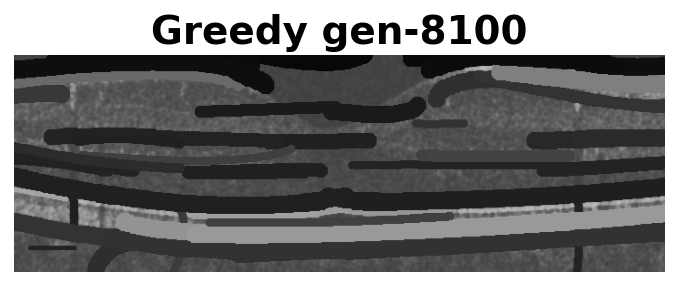

Generation 8101: SSIM = 0.374, Scores = 235 ± 104, [-42, 417], Worms = 147  (took 1.98 sec)
Generation 8102: SSIM = 0.374, Scores = 235 ± 104, [-42, 417], Worms = 148  (took 1.98 sec)
len =  0.0 for [239 531] - [239 531]
Generation 8103: SSIM = 0.374, Scores = 235 ± 104, [-42, 417], Worms = 147  (took 1.90 sec)
Generation 8104: SSIM = 0.374, Scores = 235 ± 104, [-31, 417], Worms = 148  (took 1.98 sec)
Generation 8105: SSIM = 0.374, Scores = 235 ± 104, [-31, 417], Worms = 147  (took 1.87 sec)
Generation 8106: SSIM = 0.374, Scores = 235 ± 104, [-35, 417], Worms = 147  (took 1.97 sec)
Generation 8107: SSIM = 0.374, Scores = 235 ± 104, [-39, 417], Worms = 147  (took 1.97 sec)
Generation 8108: SSIM = 0.374, Scores = 235 ± 104, [-27, 417], Worms = 147  (took 1.98 sec)
Generation 8109: SSIM = 0.374, Scores = 235 ± 104, [-35, 417], Worms = 148  (took 1.97 sec)
Generation 8110: SSIM = 0.374, Scores = 235 ± 104, [-35, 417], Worms = 147  (took 1.85 sec)
Generation 8111: SSIM = 0.374, Scores = 235

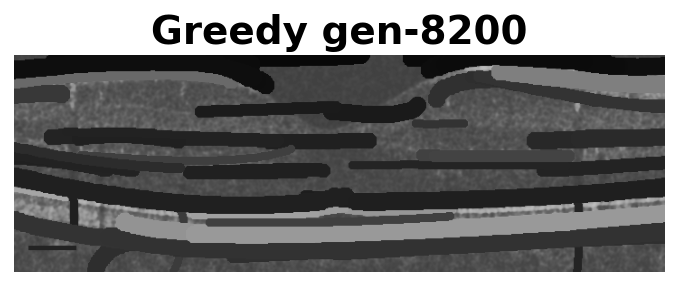

Generation 8201: SSIM = 0.374, Scores = 235 ± 103, [-23, 417], Worms = 150  (took 2.00 sec)
Generation 8202: SSIM = 0.374, Scores = 235 ± 103, [-23, 417], Worms = 150  (took 1.87 sec)
Generation 8203: SSIM = 0.374, Scores = 235 ± 103, [-23, 417], Worms = 150  (took 1.86 sec)
Generation 8204: SSIM = 0.373, Scores = 235 ± 103, [-23, 417], Worms = 150  (took 1.82 sec)
Generation 8205: SSIM = 0.373, Scores = 235 ± 103, [-23, 417], Worms = 149  (took 1.87 sec)
Generation 8206: SSIM = 0.373, Scores = 235 ± 104, [-32, 417], Worms = 150  (took 1.96 sec)
Generation 8207: SSIM = 0.373, Scores = 235 ± 103, [-32, 417], Worms = 150  (took 1.86 sec)
Generation 8208: SSIM = 0.373, Scores = 235 ± 104, [-32, 417], Worms = 149  (took 1.88 sec)
Generation 8209: SSIM = 0.373, Scores = 235 ± 103, [-27, 417], Worms = 149  (took 1.91 sec)
Generation 8210: SSIM = 0.373, Scores = 235 ± 104, [-38, 417], Worms = 150  (took 1.93 sec)
Generation 8211: SSIM = 0.373, Scores = 235 ± 104, [-38, 417], Worms = 150  (too

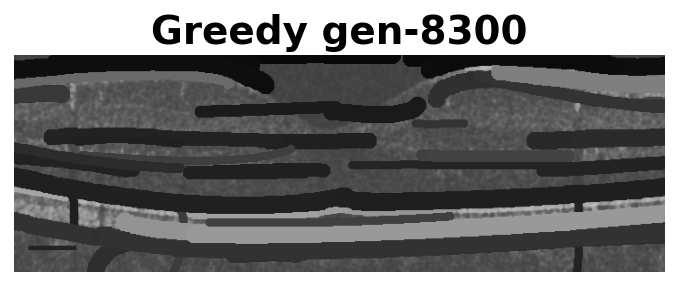

Generation 8301: SSIM = 0.373, Scores = 236 ± 104, [-35, 417], Worms = 152  (took 2.05 sec)
Generation 8302: SSIM = 0.373, Scores = 236 ± 104, [-35, 417], Worms = 152  (took 1.92 sec)
Generation 8303: SSIM = 0.373, Scores = 236 ± 104, [-35, 417], Worms = 151  (took 1.93 sec)
Generation 8304: SSIM = 0.374, Scores = 236 ± 104, [-29, 417], Worms = 152  (took 2.06 sec)
Generation 8305: SSIM = 0.374, Scores = 236 ± 104, [-29, 417], Worms = 151  (took 1.94 sec)
Generation 8306: SSIM = 0.373, Scores = 236 ± 104, [-38, 417], Worms = 151  (took 2.06 sec)
Generation 8307: SSIM = 0.373, Scores = 236 ± 105, [-45, 417], Worms = 151  (took 2.06 sec)
Generation 8308: SSIM = 0.373, Scores = 236 ± 105, [-46, 417], Worms = 152  (took 2.06 sec)
Generation 8309: SSIM = 0.373, Scores = 236 ± 104, [-46, 417], Worms = 152  (took 1.97 sec)
Generation 8310: SSIM = 0.373, Scores = 236 ± 104, [-46, 417], Worms = 151  (took 1.93 sec)
Generation 8311: SSIM = 0.374, Scores = 236 ± 105, [-53, 417], Worms = 152  (too

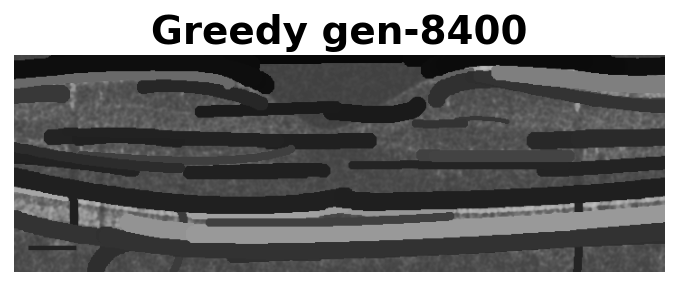

Generation 8401: SSIM = 0.374, Scores = 235 ± 105, [-42, 417], Worms = 153  (took 1.91 sec)
Generation 8402: SSIM = 0.374, Scores = 235 ± 105, [-17, 417], Worms = 154  (took 2.01 sec)
Generation 8403: SSIM = 0.374, Scores = 235 ± 105, [-17, 417], Worms = 153  (took 1.91 sec)
Generation 8404: SSIM = 0.374, Scores = 235 ± 105, [-29, 417], Worms = 154  (took 2.02 sec)
Generation 8405: SSIM = 0.374, Scores = 235 ± 105, [-29, 417], Worms = 153  (took 1.94 sec)
Generation 8406: SSIM = 0.374, Scores = 237 ± 103, [5, 417], Worms = 153  (took 1.85 sec)
Generation 8407: SSIM = 0.374, Scores = 235 ± 105, [-30, 417], Worms = 154  (took 2.03 sec)
Generation 8408: SSIM = 0.374, Scores = 235 ± 105, [-30, 417], Worms = 153  (took 1.91 sec)
Generation 8409: SSIM = 0.374, Scores = 235 ± 105, [-27, 417], Worms = 153  (took 2.04 sec)
len =  0.0 for [239 512] - [239 512]
len =  0.0 for [239 531] - [239 531]
Generation 8410: SSIM = 0.374, Scores = 235 ± 105, [-52, 417], Worms = 153  (took 2.11 sec)
Generati

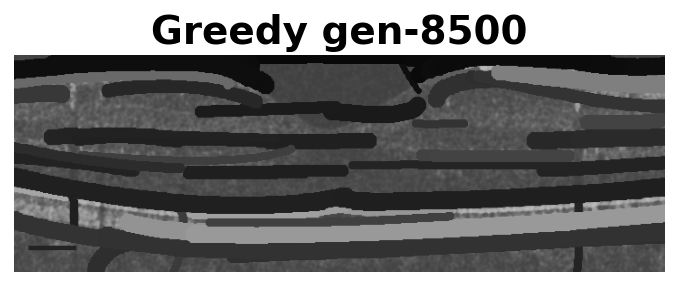

Generation 8501: SSIM = 0.377, Scores = 235 ± 105, [-32, 417], Worms = 156  (took 2.00 sec)
Generation 8502: SSIM = 0.378, Scores = 235 ± 105, [-32, 417], Worms = 155  (took 2.00 sec)
Generation 8503: SSIM = 0.377, Scores = 235 ± 105, [-34, 417], Worms = 155  (took 2.05 sec)
Generation 8504: SSIM = 0.377, Scores = 235 ± 105, [-32, 417], Worms = 155  (took 2.13 sec)
Generation 8505: SSIM = 0.377, Scores = 235 ± 105, [-32, 417], Worms = 155  (took 2.13 sec)
Generation 8506: SSIM = 0.377, Scores = 237 ± 103, [5, 417], Worms = 155  (took 1.96 sec)
Generation 8507: SSIM = 0.377, Scores = 235 ± 104, [-25, 417], Worms = 156  (took 2.15 sec)
Generation 8508: SSIM = 0.377, Scores = 235 ± 104, [-25, 417], Worms = 155  (took 2.01 sec)
Generation 8509: SSIM = 0.377, Scores = 235 ± 105, [-28, 417], Worms = 156  (took 2.13 sec)
Generation 8510: SSIM = 0.377, Scores = 235 ± 105, [-28, 417], Worms = 155  (took 2.00 sec)
Generation 8511: SSIM = 0.377, Scores = 237 ± 103, [5, 417], Worms = 155  (took 1.

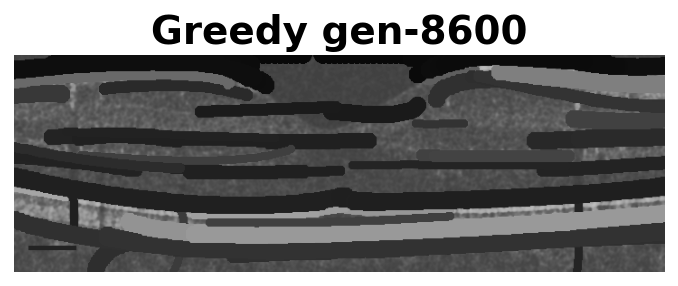

Generation 8601: SSIM = 0.377, Scores = 238 ± 102, [5, 417], Worms = 156  (took 2.00 sec)
Generation 8602: SSIM = 0.376, Scores = 236 ± 105, [-45, 417], Worms = 157  (took 2.15 sec)
Generation 8603: SSIM = 0.376, Scores = 236 ± 105, [-45, 417], Worms = 156  (took 1.98 sec)
Generation 8604: SSIM = 0.376, Scores = 236 ± 104, [-33, 417], Worms = 156  (took 2.11 sec)
Generation 8605: SSIM = 0.376, Scores = 236 ± 105, [-54, 417], Worms = 156  (took 2.09 sec)
Generation 8606: SSIM = 0.377, Scores = 238 ± 102, [5, 417], Worms = 156  (took 1.96 sec)
Generation 8607: SSIM = 0.377, Scores = 236 ± 104, [-31, 417], Worms = 157  (took 2.10 sec)
Generation 8608: SSIM = 0.377, Scores = 236 ± 104, [-31, 417], Worms = 157  (took 2.02 sec)
Generation 8609: SSIM = 0.377, Scores = 236 ± 104, [-31, 417], Worms = 157  (took 1.98 sec)
Generation 8610: SSIM = 0.377, Scores = 236 ± 104, [-31, 417], Worms = 156  (took 2.00 sec)
Generation 8611: SSIM = 0.377, Scores = 236 ± 104, [-40, 417], Worms = 157  (took 2.

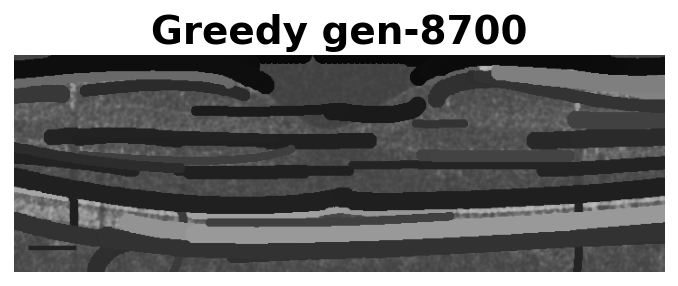

Generation 8701: SSIM = 0.377, Scores = 236 ± 104, [5, 417], Worms = 158  (took 2.05 sec)
Generation 8702: SSIM = 0.377, Scores = 236 ± 104, [5, 417], Worms = 158  (took 1.98 sec)
Generation 8703: SSIM = 0.378, Scores = 234 ± 106, [-39, 417], Worms = 159  (took 2.17 sec)
Generation 8704: SSIM = 0.378, Scores = 235 ± 106, [-39, 417], Worms = 159  (took 2.05 sec)
Generation 8705: SSIM = 0.378, Scores = 235 ± 106, [-39, 417], Worms = 159  (took 2.03 sec)
Generation 8706: SSIM = 0.377, Scores = 235 ± 106, [-39, 417], Worms = 158  (took 2.05 sec)
Generation 8707: SSIM = 0.377, Scores = 235 ± 106, [-37, 417], Worms = 158  (took 2.15 sec)
Generation 8708: SSIM = 0.377, Scores = 235 ± 106, [-37, 417], Worms = 158  (took 2.14 sec)
Generation 8709: SSIM = 0.377, Scores = 235 ± 106, [-38, 417], Worms = 159  (took 2.13 sec)
Generation 8710: SSIM = 0.377, Scores = 235 ± 106, [-38, 417], Worms = 158  (took 2.01 sec)
Generation 8711: SSIM = 0.378, Scores = 235 ± 106, [-39, 417], Worms = 159  (took 2.

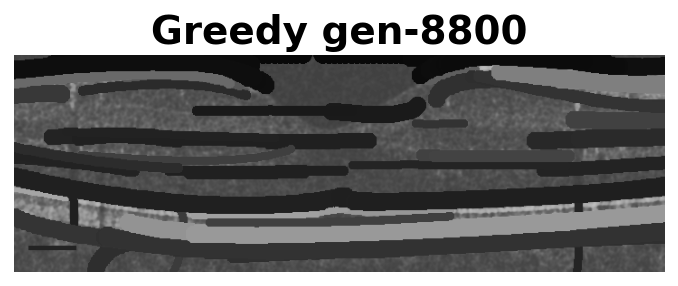

Generation 8801: SSIM = 0.377, Scores = 236 ± 105, [-42, 417], Worms = 159  (took 2.25 sec)
Generation 8802: SSIM = 0.377, Scores = 236 ± 104, [-14, 417], Worms = 160  (took 2.20 sec)
Generation 8803: SSIM = 0.377, Scores = 236 ± 104, [-14, 417], Worms = 159  (took 2.02 sec)
Generation 8804: SSIM = 0.376, Scores = 236 ± 104, [-38, 417], Worms = 159  (took 2.11 sec)
Generation 8805: SSIM = 0.377, Scores = 236 ± 105, [-71, 417], Worms = 160  (took 2.11 sec)
Generation 8806: SSIM = 0.376, Scores = 236 ± 105, [-71, 417], Worms = 160  (took 2.03 sec)
Generation 8807: SSIM = 0.377, Scores = 236 ± 104, [-19, 417], Worms = 159  (took 2.11 sec)
Generation 8808: SSIM = 0.376, Scores = 236 ± 105, [-41, 417], Worms = 159  (took 2.17 sec)
Generation 8809: SSIM = 0.377, Scores = 236 ± 104, [-31, 417], Worms = 160  (took 2.19 sec)
Generation 8810: SSIM = 0.377, Scores = 236 ± 104, [-31, 417], Worms = 159  (took 2.01 sec)
Generation 8811: SSIM = 0.377, Scores = 236 ± 104, [-33, 417], Worms = 159  (too

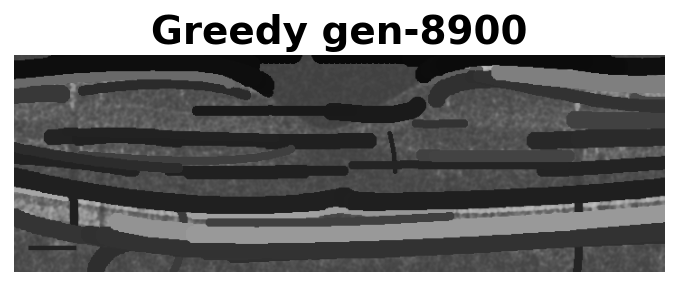

Generation 8901: SSIM = 0.377, Scores = 234 ± 106, [-40, 417], Worms = 161  (took 2.14 sec)
Generation 8902: SSIM = 0.377, Scores = 236 ± 104, [5, 417], Worms = 161  (took 2.02 sec)
Generation 8903: SSIM = 0.377, Scores = 236 ± 104, [5, 417], Worms = 161  (took 2.02 sec)
Generation 8904: SSIM = 0.376, Scores = 235 ± 106, [-47, 417], Worms = 162  (took 2.13 sec)
len =  0.0 for [239 521] - [239 521]
Generation 8905: SSIM = 0.377, Scores = 235 ± 106, [-47, 417], Worms = 161  (took 2.04 sec)
Generation 8906: SSIM = 0.377, Scores = 237 ± 104, [5, 417], Worms = 161  (took 2.04 sec)
Generation 8907: SSIM = 0.377, Scores = 235 ± 105, [-33, 417], Worms = 162  (took 2.15 sec)
Generation 8908: SSIM = 0.377, Scores = 235 ± 105, [-33, 417], Worms = 162  (took 2.07 sec)
Generation 8909: SSIM = 0.377, Scores = 235 ± 105, [-33, 417], Worms = 161  (took 2.02 sec)
Generation 8910: SSIM = 0.377, Scores = 235 ± 105, [-40, 417], Worms = 162  (took 2.16 sec)
Generation 8911: SSIM = 0.377, Scores = 235 ± 105

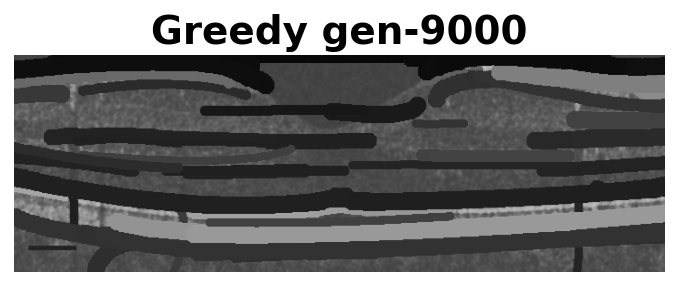

Generation 9001: SSIM = 0.378, Scores = 235 ± 105, [-28, 417], Worms = 162  (took 2.33 sec)
Generation 9002: SSIM = 0.377, Scores = 237 ± 103, [5, 417], Worms = 162  (took 2.05 sec)
Generation 9003: SSIM = 0.377, Scores = 237 ± 103, [5, 417], Worms = 162  (took 2.06 sec)
Generation 9004: SSIM = 0.377, Scores = 235 ± 105, [-56, 417], Worms = 162  (took 2.24 sec)
Generation 9005: SSIM = 0.377, Scores = 236 ± 105, [-34, 417], Worms = 163  (took 2.25 sec)
Generation 9006: SSIM = 0.377, Scores = 236 ± 105, [-34, 417], Worms = 162  (took 2.12 sec)
Generation 9007: SSIM = 0.377, Scores = 236 ± 105, [-37, 417], Worms = 163  (took 2.20 sec)
Generation 9008: SSIM = 0.377, Scores = 236 ± 105, [-37, 417], Worms = 162  (took 2.14 sec)
Generation 9009: SSIM = 0.378, Scores = 236 ± 105, [-29, 417], Worms = 163  (took 2.29 sec)
Generation 9010: SSIM = 0.378, Scores = 236 ± 105, [-29, 417], Worms = 162  (took 2.17 sec)
Generation 9011: SSIM = 0.377, Scores = 237 ± 103, [5, 417], Worms = 162  (took 2.04

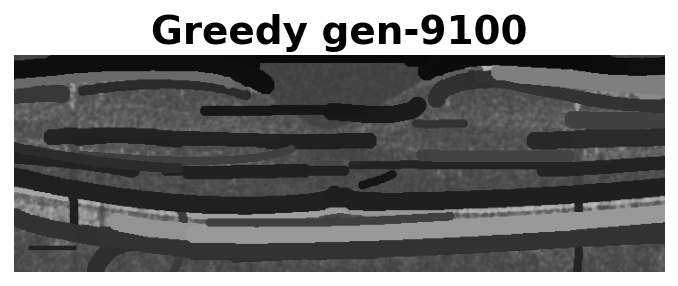

Generation 9101: SSIM = 0.376, Scores = 235 ± 105, [-73, 417], Worms = 165  (took 2.15 sec)
Generation 9102: SSIM = 0.376, Scores = 235 ± 105, [-73, 417], Worms = 164  (took 2.12 sec)
len =  0.0 for [239 499] - [239 499]
Generation 9103: SSIM = 0.377, Scores = 236 ± 105, [-36, 417], Worms = 164  (took 2.25 sec)
Generation 9104: SSIM = 0.377, Scores = 236 ± 105, [-44, 417], Worms = 164  (took 2.24 sec)
Generation 9105: SSIM = 0.377, Scores = 236 ± 105, [-37, 417], Worms = 164  (took 2.25 sec)
Generation 9106: SSIM = 0.377, Scores = 236 ± 105, [-37, 417], Worms = 164  (took 2.29 sec)
Generation 9107: SSIM = 0.377, Scores = 237 ± 103, [5, 417], Worms = 164  (took 2.14 sec)
Generation 9108: SSIM = 0.377, Scores = 236 ± 105, [-66, 417], Worms = 164  (took 2.27 sec)
Generation 9109: SSIM = 0.377, Scores = 236 ± 105, [-35, 417], Worms = 164  (took 2.29 sec)
Generation 9110: SSIM = 0.377, Scores = 237 ± 103, [5, 417], Worms = 164  (took 2.09 sec)
Generation 9111: SSIM = 0.377, Scores = 236 ± 1

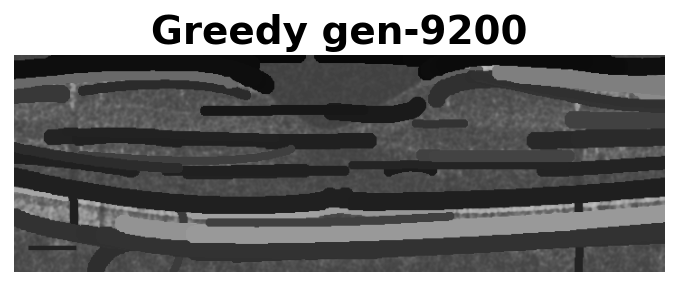

Generation 9201: SSIM = 0.376, Scores = 236 ± 105, [-39, 417], Worms = 165  (took 2.20 sec)
Generation 9202: SSIM = 0.377, Scores = 236 ± 105, [-76, 417], Worms = 165  (took 2.22 sec)
Generation 9203: SSIM = 0.377, Scores = 236 ± 105, [-82, 417], Worms = 166  (took 2.28 sec)
Generation 9204: SSIM = 0.377, Scores = 236 ± 105, [-82, 417], Worms = 165  (took 2.16 sec)
Generation 9205: SSIM = 0.377, Scores = 236 ± 105, [-43, 417], Worms = 165  (took 2.29 sec)
Generation 9206: SSIM = 0.377, Scores = 236 ± 104, [-21, 417], Worms = 166  (took 2.27 sec)
Generation 9207: SSIM = 0.377, Scores = 236 ± 104, [-21, 417], Worms = 165  (took 2.19 sec)
Generation 9208: SSIM = 0.377, Scores = 236 ± 105, [-46, 417], Worms = 165  (took 2.30 sec)
Generation 9209: SSIM = 0.377, Scores = 238 ± 103, [5, 417], Worms = 165  (took 2.08 sec)
Generation 9210: SSIM = 0.377, Scores = 238 ± 103, [5, 417], Worms = 165  (took 2.14 sec)
Generation 9211: SSIM = 0.377, Scores = 238 ± 103, [5, 417], Worms = 165  (took 2.09

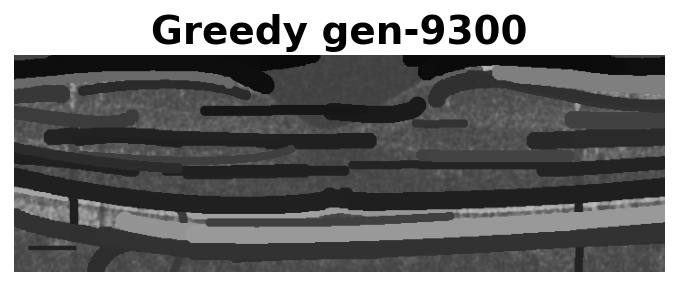

Generation 9301: SSIM = 0.377, Scores = 238 ± 104, [-44, 417], Worms = 166  (took 2.29 sec)
Generation 9302: SSIM = 0.377, Scores = 239 ± 102, [5, 417], Worms = 166  (took 2.13 sec)
Generation 9303: SSIM = 0.377, Scores = 238 ± 104, [-35, 417], Worms = 167  (took 2.30 sec)
Generation 9304: SSIM = 0.377, Scores = 238 ± 104, [-35, 417], Worms = 166  (took 2.18 sec)
Generation 9305: SSIM = 0.377, Scores = 239 ± 102, [5, 417], Worms = 166  (took 2.18 sec)
Generation 9306: SSIM = 0.378, Scores = 238 ± 104, [-36, 417], Worms = 167  (took 2.34 sec)
Generation 9307: SSIM = 0.378, Scores = 238 ± 104, [-36, 417], Worms = 166  (took 2.14 sec)
Generation 9308: SSIM = 0.377, Scores = 239 ± 102, [5, 417], Worms = 166  (took 2.08 sec)
Generation 9309: SSIM = 0.377, Scores = 238 ± 104, [-38, 417], Worms = 167  (took 2.30 sec)
Generation 9310: SSIM = 0.377, Scores = 238 ± 104, [-38, 417], Worms = 166  (took 2.12 sec)
Generation 9311: SSIM = 0.377, Scores = 238 ± 104, [-32, 417], Worms = 166  (took 2.26

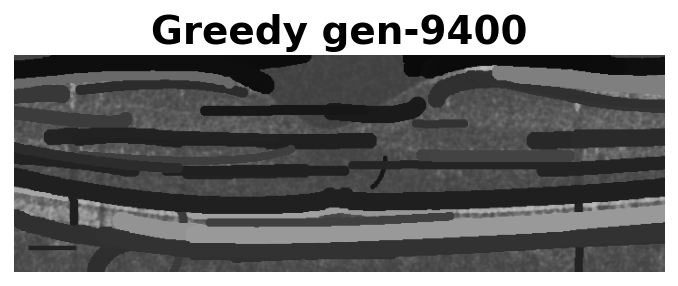

Generation 9401: SSIM = 0.373, Scores = 238 ± 104, [-44, 417], Worms = 167  (took 2.14 sec)
Generation 9402: SSIM = 0.373, Scores = 238 ± 105, [-89, 417], Worms = 168  (took 2.30 sec)
Generation 9403: SSIM = 0.373, Scores = 238 ± 104, [-56, 417], Worms = 168  (took 2.25 sec)
Generation 9404: SSIM = 0.373, Scores = 238 ± 104, [-56, 417], Worms = 168  (took 2.25 sec)
len =  0.0 for [239 411] - [239 411]
Generation 9405: SSIM = 0.373, Scores = 238 ± 104, [-56, 417], Worms = 167  (took 2.21 sec)
Generation 9406: SSIM = 0.372, Scores = 238 ± 104, [-34, 417], Worms = 168  (took 2.33 sec)
Generation 9407: SSIM = 0.372, Scores = 238 ± 104, [-34, 417], Worms = 167  (took 2.23 sec)
Generation 9408: SSIM = 0.373, Scores = 238 ± 104, [-33, 417], Worms = 168  (took 2.36 sec)
Generation 9409: SSIM = 0.373, Scores = 238 ± 104, [-33, 417], Worms = 168  (took 2.25 sec)
Generation 9410: SSIM = 0.373, Scores = 239 ± 104, [-33, 417], Worms = 167  (took 2.24 sec)
Generation 9411: SSIM = 0.373, Scores = 238

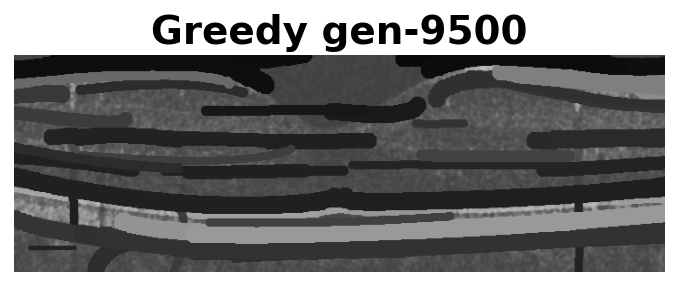

Generation 9501: SSIM = 0.376, Scores = 237 ± 105, [-33, 417], Worms = 169  (took 2.33 sec)
Generation 9502: SSIM = 0.375, Scores = 237 ± 105, [-41, 417], Worms = 169  (took 2.36 sec)
Generation 9503: SSIM = 0.376, Scores = 237 ± 105, [-37, 417], Worms = 170  (took 2.35 sec)
Generation 9504: SSIM = 0.376, Scores = 237 ± 105, [-37, 417], Worms = 169  (took 2.26 sec)
Generation 9505: SSIM = 0.376, Scores = 238 ± 105, [-23, 417], Worms = 170  (took 2.33 sec)
Generation 9506: SSIM = 0.376, Scores = 238 ± 105, [-23, 417], Worms = 169  (took 2.24 sec)
Generation 9507: SSIM = 0.376, Scores = 237 ± 105, [-35, 417], Worms = 170  (took 2.29 sec)
Generation 9508: SSIM = 0.376, Scores = 237 ± 105, [-35, 417], Worms = 169  (took 2.19 sec)
Generation 9509: SSIM = 0.376, Scores = 239 ± 103, [5, 417], Worms = 169  (took 2.14 sec)
Generation 9510: SSIM = 0.375, Scores = 238 ± 105, [-40, 417], Worms = 170  (took 2.31 sec)
Generation 9511: SSIM = 0.375, Scores = 238 ± 105, [-40, 417], Worms = 169  (took 

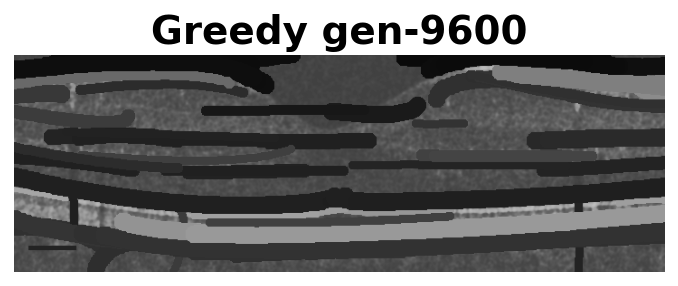

Generation 9601: SSIM = 0.375, Scores = 238 ± 104, [-33, 417], Worms = 169  (took 2.38 sec)
Generation 9602: SSIM = 0.376, Scores = 238 ± 104, [-40, 417], Worms = 169  (took 2.35 sec)
Generation 9603: SSIM = 0.376, Scores = 238 ± 105, [-84, 417], Worms = 169  (took 2.36 sec)
Generation 9604: SSIM = 0.376, Scores = 240 ± 102, [5, 417], Worms = 169  (took 2.19 sec)
Generation 9605: SSIM = 0.375, Scores = 238 ± 104, [-44, 417], Worms = 169  (took 2.34 sec)
Generation 9606: SSIM = 0.376, Scores = 238 ± 104, [-44, 417], Worms = 169  (took 2.35 sec)
Generation 9607: SSIM = 0.376, Scores = 238 ± 104, [-39, 417], Worms = 170  (took 2.30 sec)
Generation 9608: SSIM = 0.376, Scores = 238 ± 104, [-39, 417], Worms = 169  (took 2.19 sec)
Generation 9609: SSIM = 0.376, Scores = 238 ± 105, [-77, 417], Worms = 170  (took 2.26 sec)
Generation 9610: SSIM = 0.376, Scores = 238 ± 105, [-77, 417], Worms = 169  (took 2.24 sec)
Generation 9611: SSIM = 0.376, Scores = 238 ± 104, [-42, 417], Worms = 169  (took 

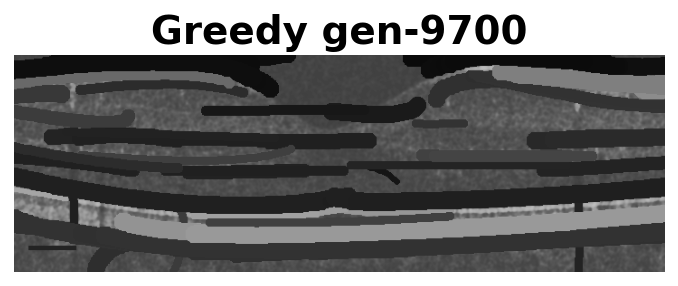

Generation 9701: SSIM = 0.373, Scores = 239 ± 103, [-38, 417], Worms = 170  (took 2.26 sec)
Generation 9702: SSIM = 0.374, Scores = 241 ± 102, [5, 417], Worms = 170  (took 2.18 sec)
Generation 9703: SSIM = 0.373, Scores = 240 ± 103, [-40, 417], Worms = 170  (took 2.42 sec)
Generation 9704: SSIM = 0.373, Scores = 240 ± 103, [-37, 417], Worms = 171  (took 2.39 sec)
Generation 9705: SSIM = 0.373, Scores = 240 ± 103, [-37, 417], Worms = 171  (took 2.16 sec)
Generation 9706: SSIM = 0.373, Scores = 240 ± 103, [-37, 417], Worms = 171  (took 2.17 sec)
Generation 9707: SSIM = 0.373, Scores = 240 ± 103, [-37, 417], Worms = 170  (took 2.20 sec)
Generation 9708: SSIM = 0.373, Scores = 240 ± 103, [-33, 417], Worms = 171  (took 2.36 sec)
Generation 9709: SSIM = 0.373, Scores = 240 ± 103, [-33, 417], Worms = 170  (took 2.19 sec)
Generation 9710: SSIM = 0.374, Scores = 240 ± 103, [-35, 417], Worms = 170  (took 2.31 sec)
Generation 9711: SSIM = 0.375, Scores = 241 ± 101, [5, 417], Worms = 170  (took 2.

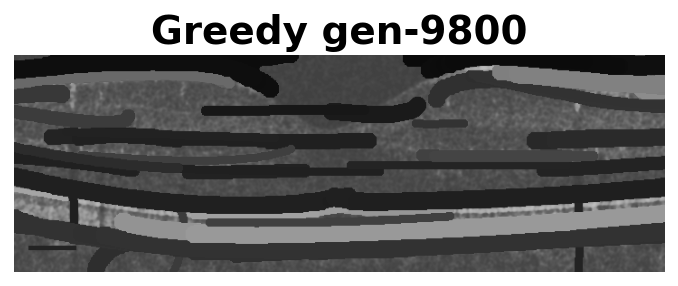

Generation 9801: SSIM = 0.374, Scores = 241 ± 103, [-21, 417], Worms = 172  (took 2.30 sec)
Generation 9802: SSIM = 0.374, Scores = 241 ± 103, [-21, 417], Worms = 171  (took 2.20 sec)
Generation 9803: SSIM = 0.374, Scores = 241 ± 103, [-35, 417], Worms = 172  (took 2.27 sec)
Generation 9804: SSIM = 0.374, Scores = 241 ± 103, [-35, 417], Worms = 171  (took 2.29 sec)
Generation 9805: SSIM = 0.374, Scores = 241 ± 103, [-29, 417], Worms = 172  (took 2.40 sec)
Generation 9806: SSIM = 0.374, Scores = 241 ± 102, [5, 417], Worms = 172  (took 2.24 sec)
Generation 9807: SSIM = 0.374, Scores = 240 ± 104, [-33, 417], Worms = 173  (took 2.42 sec)
Generation 9808: SSIM = 0.374, Scores = 240 ± 104, [-33, 417], Worms = 173  (took 2.33 sec)
Generation 9809: SSIM = 0.374, Scores = 240 ± 104, [-33, 417], Worms = 173  (took 2.26 sec)
Generation 9810: SSIM = 0.374, Scores = 240 ± 104, [-33, 417], Worms = 173  (took 2.29 sec)
Generation 9811: SSIM = 0.375, Scores = 240 ± 104, [-33, 417], Worms = 173  (took 

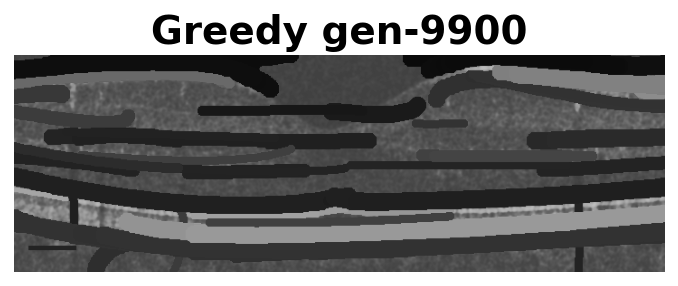

Generation 9901: SSIM = 0.374, Scores = 242 ± 103, [-30, 417], Worms = 173  (took 2.48 sec)
Generation 9902: SSIM = 0.374, Scores = 242 ± 103, [-30, 417], Worms = 172  (took 2.28 sec)
Generation 9903: SSIM = 0.374, Scores = 244 ± 101, [5, 417], Worms = 172  (took 2.27 sec)
Generation 9904: SSIM = 0.374, Scores = 242 ± 103, [-35, 417], Worms = 172  (took 2.41 sec)
Generation 9905: SSIM = 0.374, Scores = 244 ± 101, [5, 417], Worms = 172  (took 2.23 sec)
Generation 9906: SSIM = 0.374, Scores = 242 ± 103, [-45, 417], Worms = 172  (took 2.40 sec)
Generation 9907: SSIM = 0.374, Scores = 242 ± 103, [-38, 417], Worms = 173  (took 2.40 sec)
Generation 9908: SSIM = 0.375, Scores = 242 ± 103, [-38, 417], Worms = 173  (took 2.30 sec)
Generation 9909: SSIM = 0.374, Scores = 242 ± 103, [-38, 417], Worms = 172  (took 2.32 sec)
Generation 9910: SSIM = 0.374, Scores = 242 ± 103, [-42, 417], Worms = 172  (took 2.39 sec)
Generation 9911: SSIM = 0.374, Scores = 242 ± 103, [-36, 417], Worms = 172  (took 2.

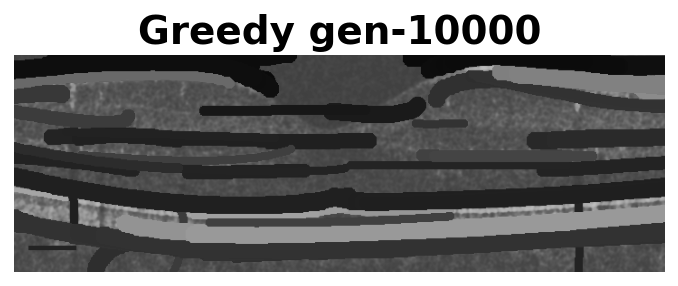

In [36]:
# for i in range(95):
#     ga.run_generations(100)
#     ga.plot_clew()


In [37]:
ga.generate_progress_gif()


gifsicle: warning: huge GIF, conserving memory (processing may take a while)
gifsicle: warning: trivial adaptive palette (only 167 colors in source)
